Installations

In [ ]:
!pip install powerlaw
!pip install python-igraph
!pip install numpy==1.23.5 # in the new version of numpy, there is a problem with np.array

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 48.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 75.6 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chex 0.1.86 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
pandas-stubs 2.0.3.230814 requires numpy>=1.25.0; python_version >= "3.9", but you have numpy 1.23.5 which is incompatible.


**Graph U-Nets Integration**
<br>
We integrate into preproc_data method the gpool operation. We will not use the coarse graph of misc-gan that generated in parse_data (R, P, W and c values). We used gpool operation instead.

In the second approach, in the generate_network, misc-gan performs Multi-Resolution Reconstruction and sigma operations. After that, we will apply the gunpool on the generated network.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
class GNet(nn.Module):
    def __init__(self, in_dim, n_classes, args):
        super(GNet, self).__init__()
        self.n_act = getattr(nn, args.act_n)()
        self.c_act = getattr(nn, args.act_c)()
        self.s_gcn = GCN(in_dim, args.l_dim, self.n_act, args.drop_n)
        self.g_unet = GraphUnet(
            args.ks, args.l_dim, args.l_dim, args.l_dim, self.n_act,
            args.drop_n)
        self.out_l_1 = nn.Linear(3*args.l_dim*(args.l_num+1), args.h_dim)
        self.out_l_2 = nn.Linear(args.h_dim, n_classes)
        self.out_drop = nn.Dropout(p=args.drop_c)
        Initializer.weights_init(self)

    def forward(self, gs, hs, labels):
        hs = self.embed(gs, hs)
        logits = self.classify(hs)
        return self.metric(logits, labels)

    def embed(self, gs, hs):
        o_hs = []
        for g, h in zip(gs, hs):
            h = self.embed_one(g, h)
            o_hs.append(h)
        hs = torch.stack(o_hs, 0)
        return hs

    def embed_one(self, g, h):
        g = norm_g(g)
        h = self.s_gcn(g, h)
        hs = self.g_unet(g, h)
        h = self.readout(hs)
        return h

    def readout(self, hs):
        h_max = [torch.max(h, 0)[0] for h in hs]
        h_sum = [torch.sum(h, 0) for h in hs]
        h_mean = [torch.mean(h, 0) for h in hs]
        h = torch.cat(h_max + h_sum + h_mean)
        return h

    def classify(self, h):
        h = self.out_drop(h)
        h = self.out_l_1(h)
        h = self.c_act(h)
        h = self.out_drop(h)
        h = self.out_l_2(h)
        return F.log_softmax(h, dim=1)

    def metric(self, logits, labels):
        loss = F.nll_loss(logits, labels)
        _, preds = torch.max(logits, 1)
        acc = torch.mean((preds == labels).float())
        return loss, acc


In [ ]:
class GraphUnet(nn.Module):

    def __init__(self, ks, in_dim, out_dim, dim, act, drop_p):
        super(GraphUnet, self).__init__()
        self.ks = ks
        self.bottom_gcn = GCN(dim, dim, act, drop_p)
        self.down_gcns = nn.ModuleList()
        self.up_gcns = nn.ModuleList()
        self.pools = nn.ModuleList()
        self.unpools = nn.ModuleList()
        self.l_n = len(ks)
        for i in range(self.l_n):
            self.down_gcns.append(GCN(dim, dim, act, drop_p))
            self.up_gcns.append(GCN(dim, dim, act, drop_p))
            self.pools.append(Pool(ks[i], dim, drop_p))
            self.unpools.append(Unpool(dim, dim, drop_p))

    def forward(self, g, h):
        adj_ms = []
        indices_list = []
        down_outs = []
        hs = []
        org_h = h
        for i in range(self.l_n):
            h = self.down_gcns[i](g, h)
            adj_ms.append(g)
            down_outs.append(h)
            g, h, idx = self.pools[i](g, h)
            indices_list.append(idx)
        h = self.bottom_gcn(g, h)
        for i in range(self.l_n):
            up_idx = self.l_n - i - 1
            g, idx = adj_ms[up_idx], indices_list[up_idx]
            g, h = self.unpools[i](g, h, down_outs[up_idx], idx)
            h = self.up_gcns[i](g, h)
            h = h.add(down_outs[up_idx])
            hs.append(h)
        h = h.add(org_h)
        hs.append(h)
        return hs


class GCN(nn.Module):

    def __init__(self, in_dim, out_dim, act, p):
        super(GCN, self).__init__()
        self.proj = nn.Linear(in_dim, out_dim)
        self.act = act
        self.drop = nn.Dropout(p=p) if p > 0.0 else nn.Identity()

    def forward(self, g, h):
        h = self.drop(h)
        h = torch.matmul(g, h)
        h = self.proj(h)
        h = self.act(h)
        return h

class Pool(nn.Module):

    def __init__(self, k, in_dim, p):
        super(Pool, self).__init__()
        self.k = k
        self.sigmoid = nn.Sigmoid()
        self.proj = nn.Linear(in_dim, 1)
        self.drop = nn.Dropout(p=p) if p > 0 else nn.Identity()

    def forward(self, g, h):
        Z = self.drop(h)
        weights = self.proj(Z).squeeze()
        scores = self.sigmoid(weights)
        return top_k_graph(scores, g, h, self.k)


class Unpool(nn.Module):
    def __init__(self, *args):
        super(Unpool, self).__init__()

    def forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        # Subset h to match the size of idx
        h_subset = h[:len(idx)]
        # Debug: Print shapes before assignment
        print(f"Shape of new_h before assignment: {new_h.shape}")
        print(f"Shape of h_subset: {h_subset.shape}")
        print(f"Shape of idx: {idx.shape}")
        new_h[idx] = h_subset
        return g, new_h
    '''ddef forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        new_h[idx] = h
        return g, new_h'''


def top_k_graph(scores, g, h, k):
    num_nodes = g.shape[0]
    values, idx = torch.topk(scores, max(2, int(k*num_nodes)))
    new_h = h[idx, :]
    values = torch.unsqueeze(values, -1)
    new_h = torch.mul(new_h, values)
    un_g = g.bool().float()
    un_g = torch.matmul(un_g, un_g).bool().float()
    un_g = un_g[idx, :]
    un_g = un_g[:, idx]
    g = norm_g(un_g)
    return g, new_h, idx


def norm_g(g):
    degrees = torch.sum(g, 1)
    g = g / degrees
    return g

In [ ]:
class Initializer(object):

    @classmethod
    def _glorot_uniform(cls, w):
        if len(w.size()) == 2:
            fan_in, fan_out = w.size()
        elif len(w.size()) == 3:
            fan_in = w.size()[1] * w.size()[2]
            fan_out = w.size()[0] * w.size()[2]
        else:
            fan_in = np.prod(w.size())
            fan_out = np.prod(w.size())
        limit = np.sqrt(6.0 / (fan_in + fan_out))
        w.uniform_(-limit, limit)

    @classmethod
    def _param_init(cls, m):
        if isinstance(m, nn.parameter.Parameter):
            cls._glorot_uniform(m.data)
        elif isinstance(m, nn.Linear):
            m.bias.data.zero_()
            cls._glorot_uniform(m.weight.data)

    @classmethod
    def weights_init(cls, m):
        for p in m.modules():
            if isinstance(p, nn.ParameterList):
                for pp in p:
                    cls._param_init(pp)
            else:
                cls._param_init(p)

        for name, p in m.named_parameters():
            if '.' not in name:
                cls._param_init(p)

First analysis results: DBLP dataset what were trained on graph u-nets using

In [ ]:
class GNetArgs:
    seed = 42
    data = 'DBLP'
    fold = 1
    num_epochs = 200
    batch = 1
    lr = 0.001  # A higher learning rate for faster convergence
    deg_as_tag = 0
    l_num = 3  # Number of layers in the model
    h_dim = 128  # Higher hidden dimension for larger datasets
    l_dim = 64  # Latent dimension
    drop_n = 0.5  # Dropout rate for nodes
    drop_c = 0.5  # Dropout rate for edges
    act_n = 'ReLU'
    act_c = 'ReLU'
    ks = [0.9, 0.8, 0.7]  # k for pooling layers
    acc_file = 're'
    save_model = '/content/drive/MyDrive/TrainedGraphU-Nets/dblp_graph_unet_model.pth'
    in_dim = 1

gnet_args = GNetArgs()
net = GNet(in_dim=gnet_args.in_dim, n_classes=2, args=gnet_args)

def load_model_parameters(model, model_path):
    pretrained_dict = torch.load(model_path)
    model_dict = model.state_dict()
    pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and model_dict[k].size() == v.size()}
    model_dict.update(pretrained_dict)
    model.load_state_dict(model_dict)

model_path = gnet_args.save_model
load_model_parameters(net, model_path)
net.eval()

# for g-unets integration
global_params = {
    "down_outs_list": [],
    "indices_list_list": []
}

Imports

In [ ]:
import tensorflow as tf
import numpy as np
import pickle as pkl
import argparse
import networkx as nx
import scipy.sparse as sp
import scipy.io as sio
import sys
import os
from collections import namedtuple
import math
import time
from google.colab import drive
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from scipy.sparse.csgraph import connected_components
from __future__ import division
from __future__ import print_function
import copy
import powerlaw
import collections
import igraph
import tf_slim as slim # import tensorflow.contrib.slim as slim also legacy and goolge colab removed it
from tensorflow.python.framework import ops

print(np.__version__)

1.23.5


In [ ]:
class Args:
  def __init__(self, version=-1):
    self.demo = False
    self.dataset_A = f'cora_{version}.mat' if version > -1 else 'cora.mat'  # path of the data set
    self.checkpoint = f'/content/Misc-Gan_Project/checkpoint_training_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/checkpoint_training_cora'  # path of the checkpoint
    self.filename = f'cora_output_network_{version}' if version > -1 else 'cora_output_network'  # the filename of output network
    self.output_dir = f'/content/Misc-Gan_Project/output_dir_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/output_dir_cora'  # results are saved here
    self.epoch = 250  # number of epoch
    self.layer = 5  # number of layers
    self.clusters = 2  # number of clusters (2 or 3)
    self.use_resnet = True  # generation network using reidule block
    self.use_lsgan = True  # gan loss defined in lsgan
    self.which_direction = 'BtoA'  # AtoB or BtoA
    self.which_stage = 'training'  # training stage or testing stage
    self.starting_layer = 1  # the starting layer
    self.shuffle = True  # Shuffle the graph
    self.gpu = True  # Use gpu to train the model or not
    self.kernel_number = 32  # Shuffle the graph
    self.iter = 5  # Iterations of residule_block function for generator to train graph

args = Args()

Gae Module

initializations.py

In [ ]:
def weight_variable_glorot(input_dim, output_dim, name=""):
    """Create a weight variable with Glorot & Bengio (AISTATS 2010)
    initialization.
    """
    init_range = np.sqrt(6.0 / (input_dim + output_dim))
    initial = tf.compat.v1.random_uniform([input_dim, output_dim], minval=-init_range,
                                maxval=init_range, dtype=tf.compat.v1.float32)
    return tf.compat.v1.Variable(initial, name=name)


input_data.py

In [ ]:
def parse_index_file(filename):
    index = []
    for line in open(filename):
        index.append(int(line.strip()))
    return index

In [ ]:
def load_data(dataset):
    # load the data: x, tx, allx, graph
    names = ['x', 'tx', 'allx', 'graph']
    objects = []
    for i in range(len(names)):
        objects.append(pkl.load(open("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.{}".format(dataset, names[i]))))
    x, tx, allx, graph = tuple(objects)
    test_idx_reorder = parse_index_file("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.test.index".format(dataset))
    test_idx_range = np.sort(test_idx_reorder)

    if dataset == 'citeseer':
        # Fix citeseer dataset (there are some isolated nodes in the graph)
        # Find isolated nodes, add them as zero-vecs into the right position
        test_idx_range_full = range(min(test_idx_reorder), max(test_idx_reorder)+1)
        tx_extended = sp.lil_matrix((len(test_idx_range_full), x.shape[1]))
        tx_extended[test_idx_range-min(test_idx_range), :] = tx
        tx = tx_extended

    features = sp.vstack((allx, tx)).tolil()
    features[test_idx_reorder, :] = features[test_idx_range, :]
    adj = nx.adjacency_matrix(nx.from_dict_of_lists(graph))
    return adj, features

In [ ]:
def load_network_data(filename):
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(filename))
    A = network_A['A']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    return A, R, edges

layers.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

# global unique layer ID dictionary for layer name assignment
_LAYER_UIDS = {}

In [ ]:
def get_layer_uid(layer_name=''):
    """Helper function, assigns unique layer IDs
    """
    if layer_name not in _LAYER_UIDS:
        _LAYER_UIDS[layer_name] = 1
        return 1
    else:
        _LAYER_UIDS[layer_name] += 1
        return _LAYER_UIDS[layer_name]

In [ ]:
def dropout_sparse(x, keep_prob, num_nonzero_elems):
    """Dropout for sparse tensors. Currently fails for very large sparse tensors (>1M elements)
    """
    noise_shape = [num_nonzero_elems]
    random_tensor = keep_prob
    random_tensor += tf.compat.v1.random_uniform(noise_shape)
    dropout_mask = tf.cast(tf.compat.v1.floor(random_tensor), dtype=tf.compat.v1.bool)
    pre_out = tf.compat.v1.sparse_retain(x, dropout_mask)
    return pre_out * (1./keep_prob)

In [ ]:
class Layer(object):
    """Base layer class. Defines basic API for all layer objects.

    # Properties
        name: String, defines the variable scope of the layer.

    # Methods
        _call(inputs): Defines computation graph of layer
            (i.e. takes input, returns output)
        __call__(inputs): Wrapper for _call()
    """
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            layer = self.__class__.__name__.lower()
            name = layer + '_' + str(get_layer_uid(layer))
        self.name = name
        self.vars = {}
        logging = kwargs.get('logging', False)
        self.logging = logging
        self.issparse = False

    def _call(self, inputs):
        return inputs

    def __call__(self, inputs):
        with tf.compat.v1.name_scope(self.name):
            outputs = self._call(inputs)
            return outputs

In [ ]:
class GraphConvolution(Layer):
    """Basic graph convolution layer for undirected graph without edge labels."""
    def __init__(self, input_dim, output_dim, adj, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolution, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act

    def _call(self, inputs):
        x = inputs
        x = tf.compat.v1.nn.dropout(x, 1-self.dropout)
        x = tf.compat.v1.matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs

In [ ]:

class GraphConvolutionSparse(Layer):
    """Graph convolution layer for sparse inputs."""
    def __init__(self, input_dim, output_dim, adj, features_nonzero, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolutionSparse, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act
        self.issparse = True
        self.features_nonzero = features_nonzero

    def _call(self, inputs):
        x = inputs
        x = dropout_sparse(x, 1-self.dropout, self.features_nonzero)
        x = tf.compat.v1.sparse_tensor_dense_matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs


In [ ]:
class InnerProductDecoder(Layer):
    """Decoder model layer for link prediction."""
    def __init__(self, input_dim, dropout=0., act=tf.compat.v1.nn.sigmoid, **kwargs):
        super(InnerProductDecoder, self).__init__(**kwargs)
        self.dropout = dropout
        self.act = act

    def _call(self, inputs):
        inputs = tf.compat.v1.nn.dropout(inputs, 1-self.dropout)
        x = tf.compat.v1.transpose(inputs)
        x = tf.compat.v1.matmul(inputs, x)
        x = tf.compat.v1.reshape(x, [-1])
        outputs = self.act(x)
        return outputs

model.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class Model(object):
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg

        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            name = self.__class__.__name__.lower()
        self.name = name

        logging = kwargs.get('logging', False)
        self.logging = logging

        self.vars = {}

    def _build(self):
        raise NotImplementedError

    def build(self):
        """ Wrapper for _build() """
        with tf.compat.v1.variable_scope(self.name):
            self._build()
        variables = tf.compat.v1.get_collection(tf.compat.v1.GraphKeys.GLOBAL_VARIABLES, scope=self.name)
        self.vars = {var.name: var for var in variables}

    def fit(self):
        pass

    def predict(self):
        pass

In [ ]:
class GCNModelAE(Model):
    def __init__(self, placeholders, num_features, features_nonzero, **kwargs):
        super(GCNModelAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.embeddings = GraphConvolution(input_dim=FLAGS.hidden1,
                                           output_dim=FLAGS.hidden2,
                                           adj=self.adj,
                                           act=lambda x: x,
                                           dropout=self.dropout,
                                           logging=self.logging)(self.hidden1)

        self.z_mean = self.embeddings

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.embeddings)

In [ ]:
class GCNModelVAE(Model):
    def __init__(self, placeholders, num_features, num_nodes, features_nonzero, **kwargs):
        super(GCNModelVAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.n_samples = num_nodes
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.z_mean = GraphConvolution(input_dim=FLAGS.hidden1,
                                       output_dim=FLAGS.hidden2,
                                       adj=self.adj,
                                       act=lambda x: x,
                                       dropout=self.dropout,
                                       logging=self.logging)(self.hidden1)

        self.z_log_std = GraphConvolution(input_dim=FLAGS.hidden1,
                                          output_dim=FLAGS.hidden2,
                                          adj=self.adj,
                                          act=lambda x: x,
                                          dropout=self.dropout,
                                          logging=self.logging)(self.hidden1)

        self.z = self.z_mean + tf.compat.v1.random_normal([self.n_samples, FLAGS.hidden2]) * tf.compat.v1.exp(self.z_log_std)

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.z)

optimizer.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class OptimizerAE(object):
    def __init__(self, preds, labels, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))


In [ ]:
class OptimizerVAE(object):
    def __init__(self, preds, labels, model, num_nodes, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        # Latent loss
        self.log_lik = self.cost
        self.kl = (0.5 / num_nodes) * tf.compat.v1.reduce_mean(tf.compat.v1.reduce_sum(1 + 2 * model.z_log_std - tf.compat.v1.square(model.z_mean) -
                                                                   tf.compat.v1.square(tf.compat.v1.exp(model.z_log_std)), 1))
        self.cost -= self.kl

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))

preprocessing.py

In [ ]:
def sparse_to_tuple(sparse_mx):
    if not sp.isspmatrix_coo(sparse_mx):
        sparse_mx = sparse_mx.tocoo()
    coords = np.vstack((sparse_mx.row, sparse_mx.col)).transpose()
    values = sparse_mx.data
    shape = sparse_mx.shape
    return coords, values, shape

In [ ]:
def preprocess_graph(adj):
    adj = sp.coo_matrix(adj)
    adj_ = adj + sp.eye(adj.shape[0])
    rowsum = np.array(adj_.sum(1))
    degree_mat_inv_sqrt = sp.diags(np.power(rowsum, -0.5).flatten())
    adj_normalized = adj_.dot(degree_mat_inv_sqrt).transpose().dot(degree_mat_inv_sqrt).tocoo()
    return sparse_to_tuple(adj_normalized)

In [ ]:
def construct_feed_dict(adj_normalized, adj, features, placeholders):
    # construct feed dictionary
    feed_dict = dict()
    feed_dict.update({placeholders['features']: features})
    feed_dict.update({placeholders['adj']: adj_normalized})
    feed_dict.update({placeholders['adj_orig']: adj})
    return feed_dict

In [ ]:
def mask_test_edges(adj):
    # Function to build test set with 10% positive links
    # NOTE: Splits are randomized and results might slightly deviate from reported numbers in the paper.
    # TODO: Clean up.

    # Remove diagonal elements
    adj = adj - sp.dia_matrix((adj.diagonal()[np.newaxis, :], [0]), shape=adj.shape)
    adj.eliminate_zeros()
    # Check that diag is zero:
    # assert np.diag(adj.todense()).sum() == 0

    adj_triu = sp.triu(adj)
    adj_tuple = sparse_to_tuple(adj_triu)
    edges = adj_tuple[0]
    # edges_all = sparse_to_tuple(adj)[0]
    # num_test = int(np.floor(edges.shape[0] / 10.))
    # num_val = int(np.floor(edges.shape[0] / 20.))

    # all_edge_idx = range(edges.shape[0])
    # np.random.shuffle(all_edge_idx)
    # val_edge_idx = all_edge_idx[:num_val]
    # test_edge_idx = all_edge_idx[num_val:(num_val + num_test)]
    # test_edges = edges[test_edge_idx]
    # val_edges = edges[val_edge_idx]
    # train_edges = np.delete(edges, np.hstack([test_edge_idx, val_edge_idx]), axis=0)
    train_edges = edges

    # def ismember(a, b, tol=5):
    #     rows_close = np.all(np.round(a - b[:, None], tol) == 0, axis=-1)
    #     return np.any(rows_close)
    #
    # test_edges_false = []
    # while len(test_edges_false) < len(test_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], edges_all):
    #         continue
    #     if test_edges_false:
    #         if ismember([idx_j, idx_i], np.array(test_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(test_edges_false)):
    #             continue
    #     test_edges_false.append([idx_i, idx_j])

    # val_edges_false = []
    # while len(val_edges_false) < len(val_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], train_edges):
    #         continue
    #     if ismember([idx_j, idx_i], train_edges):
    #         continue
    #     if ismember([idx_i, idx_j], val_edges):
    #         continue
    #     if ismember([idx_j, idx_i], val_edges):
    #         continue
    #     if val_edges_false:
    #         if ismember([idx_j, idx_i], np.array(val_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(val_edges_false)):
    #             continue
    #     val_edges_false.append([idx_i, idx_j])
    #
    # assert ~ismember(test_edges_false, edges_all)
    # assert ~ismember(val_edges_false, edges_all)
    # assert ~ismember(val_edges, train_edges)
    # assert ~ismember(test_edges, train_edges)
    # assert ~ismember(val_edges, test_edges)

    data = np.ones(train_edges.shape[0])

    # Re-build adj matrix
    adj_train = sp.csr_matrix((data, (train_edges[:, 0], train_edges[:, 1])), shape=adj.shape)
    adj_train = adj_train + adj_train.T

    # NOTE: these edge lists only contain single direction of edge!
    return adj_train, train_edges #, val_edges, val_edges_false, test_edges, test_edges_false

utils_network.py

In [ ]:
# new added functions for cyclegan
class ImagePool(object):
    def __init__(self, maxsize=50):
        self.maxsize = maxsize
        self.num_img = 0
        self.images = []

    def __call__(self, image):
        if self.maxsize <= 0:
            return image
        if self.num_img < self.maxsize:
            self.images.append(image)
            self.num_img += 1
            return image
        if np.random.rand() > 0.5:
            idx = int(np.random.rand()*self.maxsize)
            tmp1 = copy.copy(self.images[idx])[0]
            self.images[idx][0] = image[0]
            idx = int(np.random.rand()*self.maxsize)
            tmp2 = copy.copy(self.images[idx])[1]
            self.images[idx][1] = image[1]
            return [tmp1, tmp2]
        else:
            return image

In [ ]:
# --- loading dataset --- #
def load_mat_file():
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A))
    A = network_A['A']
    P = network_A['P'].transpose()
    W = network_A['W']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    cluster_info = network_A['IDX'].flatten()
    c = network_A['c'][0]
    clusters_info = []
    prev = 1
    for j in range(len(c)):
        idx = np.zeros(R[j, 0].shape[1], dtype=np.int16)
        for i in range(len(idx)):
            if i+1 not in c[j][0]:
                idx[i] = prev
            else:
                idx[i] = cluster_info[i]
                prev = idx[i]
        clusters_info.append(np.array(idx))
    clusters_info = np.array(clusters_info)
    indices = [[] for _ in range(len(clusters_info))]
    min_value = np.min(clusters_info[0])
    for j in range(len(clusters_info)):
        index = [[] for _ in range(args.clusters)]
        for c in range(args.clusters):
            for i in range(len(clusters_info[j])):
                if clusters_info[j][i] == c + min_value:
                    index[c].append(i)
        indices[j] = np.array(index)
    indices = np.array(indices)
    return A, P, W, R, indices, edges

In [ ]:
def gpool_operation(A_copy, net, gnet_args):
    A_copy_tensor = torch.tensor(A_copy, dtype=torch.float32)
    feature_tensor = torch.randn((A_copy_tensor.shape[0], gnet_args.l_dim), dtype=torch.float32)

    down_outs = []
    indices_list = []

    with torch.no_grad():
        for j in range(net.g_unet.l_n):
            feature_tensor = net.g_unet.down_gcns[j](A_copy_tensor, feature_tensor)
            down_outs.append(feature_tensor.clone())
            A_copy_tensor, feature_tensor, coarsening_indices = net.g_unet.pools[j](A_copy_tensor, feature_tensor)
            indices_list.append(coarsening_indices)

        coarsened_graph, coarsened_features = A_copy_tensor, feature_tensor

    return coarsened_graph, coarsened_features, down_outs, indices_list

def preproc_data(sess, net, gnet_args):
    init_op = tf.compat.v1.global_variables_initializer()
    sess.run(init_op)
    A, P, W, R, indices, edges = load_mat_file()

    # Preserve the original graph
    A_copy = np.array(A.todense(), copy=True) if hasattr(A, 'todense') else np.array(A, copy=True)
    data_A = dict()
    data_B = dict()
    A_layer = []

    global_params["down_outs_list"].clear()
    global_params["indices_list_list"].clear()

    for i in range(1, args.layer + 1):
        # Store the intermediate coarse graph before G-Pool operation
        A_layer.append(A_copy.copy())

        # Perform G-Pool operation
        coarsened_graph, coarsened_features, down_outs, indices_list = gpool_operation(A_copy, net, gnet_args)
        A_copy = coarsened_graph.detach().numpy()

        # Ensure shuffle_list indices are within the valid range
        shuffle_list = np.array(indices[i-1][0] + indices[i-1][1])
        shuffle_list = shuffle_list[shuffle_list < A_copy.shape[0]]

        if args.shuffle:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy[shuffle_list, :][:, shuffle_list])
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense()[shuffle_list, :][:, shuffle_list])
        else:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy)
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense())

        global_params["down_outs_list"].append(down_outs)
        global_params["indices_list_list"].append(indices_list)

    return data_A, data_B, indices, P, A_layer, edges, R

In [ ]:
# --- add zero padding such that height and the width of the adjacent matrix can be divided by 4 --- #
def zero_padding(data):
    dim = data.shape[1]
    if dim % 4 != 0:
        dim = (int(dim / 4) + 1) * 4
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        new_data[0, :data.shape[1], :data.shape[1], 0] = data
        return new_data
    else:
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        if len(data.shape) == 2:
            new_data[0, :dim, :dim, 0] = data
        else:
            new_data[0, :dim, :dim, :] = data
        return new_data

In [ ]:
def squares(g):
    """
    Count the number of squares for each node
    Parameters
    ----------
    g: igraph Graph object
       The input graph.

    Returns
    -------
    List with N entries (N is number of nodes) that give the number of squares a node is part of.
    """

    cliques = g.cliques(min=4, max=4)
    result = [0] * g.vcount()
    for i, j, k, l in cliques:
        result[i] += 1
        result[j] += 1
        result[k] += 1
        result[l] += 1
    return result

In [ ]:
def statistics_degrees(A_in):
    """
    Compute min, max, mean degree

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    d_max. d_min, d_mean
    """

    degrees = A_in.sum(axis=0)
    return np.max(degrees), np.min(degrees), np.mean(degrees)

In [ ]:
def statistics_LCC(A_in):
    """
    Compute the size of the largest connected component (LCC)

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Size of LCC

    """

    unique, counts = np.unique(connected_components(A_in)[1], return_counts=True)
    LCC = np.where(connected_components(A_in)[1] == np.argmax(counts))[0]
    return LCC

In [ ]:
def statistics_wedge_count(A_in):
    """
    Compute the wedge count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    The wedge count.
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([0.5 * x * (x - 1) for x in degrees])))

In [ ]:
def statistics_claw_count(A_in):
    """
    Compute the claw count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Claw count
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([1 / 6. * x * (x - 1) * (x - 2) for x in degrees])))

In [ ]:
def statistics_triangle_count(A_in):
    """
    Compute the triangle count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Triangle count
    """

    A_graph = nx.from_numpy_array(A_in)
    triangles = nx.triangles(A_graph)
    t = np.sum(list(triangles.values())) / 3
    return int(t)

In [ ]:
def statistics_square_count(A_in):
    """
    Compute the square count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Square count
    """

    A_igraph = igraph.Graph.Adjacency((A_in > 0).tolist()).as_undirected()
    return int(np.sum(squares(A_igraph)) / 4)

In [ ]:
def statistics_power_law_alpha(A_in):
    """
    Compute the power law coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Power law coefficient
    """

    degrees = A_in.sum(axis=0)
    return powerlaw.Fit(degrees, xmin=max(np.min(degrees), 1)).power_law.alpha

In [ ]:

def statistics_gini(A_in):
    """
    Compute the Gini coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Gini coefficient
    """

    n = A_in.shape[0]
    degrees = A_in.sum(axis=0)
    degrees_sorted = np.sort(degrees)
    G = (2 * np.sum(np.array([i * degrees_sorted[i] for i in range(len(degrees))]))) / (n * np.sum(degrees)) - (
            n + 1) / n
    return float(G)

In [ ]:
def statistics_edge_distribution_entropy(A_in):
    """
    Compute the relative edge distribution entropy of the input graph.

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Rel. edge distribution entropy
    """

    degrees = A_in.sum(axis=0)
    m = 0.5 * np.sum(np.square(A_in))
    n = A_in.shape[0]

    H_er = 1 / np.log(n) * np.sum(-degrees / (2 * float(m)) * np.log((degrees + .0001) / (2 * float(m))))
    return H_er

In [ ]:
def statistics_cluster_props(A, Z_obs):
    def get_blocks(A_in, Z_obs, normalize=True):
        block = Z_obs.T.dot(A_in.dot(Z_obs))
        counts = np.sum(Z_obs, axis=0)
        blocks_outer = counts[:, None].dot(counts[None, :])
        if normalize:
            blocks_outer = np.multiply(block, 1 / blocks_outer)
        return blocks_outer

    in_blocks = get_blocks(A, Z_obs)
    diag_mean = np.multiply(in_blocks, np.eye(in_blocks.shape[0])).mean()
    offdiag_mean = np.multiply(in_blocks, 1 - np.eye(in_blocks.shape[0])).mean()
    return diag_mean, offdiag_mean

In [ ]:
def statistics_compute_cpl(A):
    """Compute characteristic path length."""
    P = sp.csgraph.shortest_path(sp.csr_matrix(A))
    return P[((1 - np.isinf(P)) * (1 - np.eye(P.shape[0]))).astype(np.bool)].mean()

In [ ]:
def compute_graph_statistics(A_in, Z_obs=None):
    """

    Parameters
    ----------
    A_in: sparse matrix
          The input adjacency matrix.
    Z_obs: np.matrix [N, K], where K is the number of classes.
          Matrix whose rows are one-hot vectors indicating the class membership of the respective node.

    Returns
    -------
    Dictionary containing the following statistics:
             * Maximum, minimum, mean degree of nodes
             * Size of the largest connected component (LCC)
             * Wedge count
             * Claw count
             * Triangle count
             * Square count
             * Power law exponent
             * Gini coefficient
             * Relative edge distribution entropy
             * Assortativity
             * Clustering coefficient
             * Number of connected components
             * Intra- and inter-community density (if Z_obs is passed)
             * Characteristic path length
    """

    A = A_in.copy()

    # assert ((A == A.T).all())
    A_graph = nx.from_numpy_array(A).to_undirected()

    statistics = {}
    start_time = time.time()
    d_max, d_min, d_mean = statistics_degrees(A)
    print("--- %s seconds to compute statistics_degrees ---" % (time.time() - start_time))
    # Degree statistics
    statistics['d_max'] = d_max
    statistics['d_min'] = d_min
    statistics['d'] = d_mean

    # largest connected component
    start_time = time.time()
    LCC = statistics_LCC(A)
    print("--- %s seconds to compute statistics_LCC ---" % (time.time() - start_time))
    statistics['LCC'] = LCC.shape[0]
    # wedge count
    start_time = time.time()
    statistics['wedge_count'] = statistics_wedge_count(A)
    print("--- %s seconds to compute statistics_wedge_count ---" % (time.time() - start_time))
    start_time = time.time()
    # claw count
    statistics['claw_count'] = statistics_claw_count(A)
    print("--- %s seconds to compute statistics_claw_count ---" % (time.time() - start_time))
    start_time = time.time()
    # triangle count
    statistics['triangle_count'] = statistics_triangle_count(A)
    print("--- %s seconds to compute statistics_triangle_count ---" % (time.time() - start_time))
    # start_time = time.time()
    # # Square count
    # statistics['square_count'] = statistics_square_count(A)
    # print("--- %s seconds to compute statistics_square_count ---" % (time.time() - start_time))
    start_time = time.time()
    # power law exponent
    statistics['power_law_exp'] = statistics_power_law_alpha(A)
    print("--- %s seconds to compute statistics_power_law_alpha ---" % (time.time() - start_time))
    start_time = time.time()
    # gini coefficient
    statistics['gini'] = statistics_gini(A)
    print("--- %s seconds to compute statistics_gini ---" % (time.time() - start_time))
    start_time = time.time()
    # Relative edge distribution entropy
    statistics['rel_edge_distr_entropy'] = statistics_edge_distribution_entropy(A)
    print("--- %s seconds to compute statistics_edge_distribution_entropy ---" % (time.time() - start_time))
    start_time = time.time()
    # Assortativity
    statistics['assortativity'] = nx.degree_assortativity_coefficient(A_graph)
    print("--- %s seconds to compute degree_assortativity_coefficient ---" % (time.time() - start_time))
    # Clustering coefficient
    statistics['clustering_coefficient'] = 3 * statistics['triangle_count'] / statistics['claw_count']
    start_time = time.time()
    # Number of connected components
    statistics['n_components'] = connected_components(A)[0]
    print("--- %s seconds to compute connected_components ---" % (time.time() - start_time))
    start_time = time.time()
    if Z_obs is not None:
        # inter- and intra-community density
        intra, inter = statistics_cluster_props(A, Z_obs)
        statistics['intra_community_density'] = intra
        statistics['inter_community_density'] = inter
    print("--- %s seconds to compute statistics_cluster_props ---" % (time.time() - start_time))
    # start_time = time.time()
    # statistics['cpl'] = statistics_compute_cpl(A)
    # print("--- %s seconds to compute statistics_compute_cpl ---" % (time.time() - start_time))

    return statistics

ops.py

In [ ]:
def batch_norm(x, name="batch_norm"):
    return tf.compat.v1.contrib.layers.batch_norm(x, decay=0.9, updates_collections=None, epsilon=1e-5, scale=True, scope=name)

def instance_norm(input, name="instance_norm"):
    with tf.compat.v1.variable_scope(name):
        depth = input.get_shape()[3]
        scale = tf.compat.v1.get_variable("scale", [depth], initializer=tf.compat.v1.random_normal_initializer(1.0, 0.02, dtype=tf.compat.v1.float32))
        offset = tf.compat.v1.get_variable("offset", [depth], initializer=tf.compat.v1.constant_initializer(0.0))
        mean, variance = tf.compat.v1.nn.moments(input, axes=[1,2], keep_dims=True)
        epsilon = 1e-5
        inv = tf.compat.v1.rsqrt(variance + epsilon)
        normalized = (input-mean)*inv
        return scale*normalized + offset

def conv2d(input_, output_dim, ks=4, s=2, stddev=0.02, padding='SAME', name="conv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d(input_, output_dim, ks, s, padding=padding, activation_fn=None,
                            weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                            biases_initializer=None)

def deconv2d(input_, output_dim, ks=4, s=2, stddev=0.02, name="deconv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d_transpose(input_, output_dim, ks, s, padding='SAME', activation_fn=None,
                                    weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                                    biases_initializer=None)

def lrelu(x, leak=0.2, name="lrelu"):
    return tf.compat.v1.maximum(x, leak*x)

def linear(input_, output_size, scope=None, stddev=0.02, bias_start=0.0, with_w=False):

    with tf.variable_scope(scope or "Linear"):
        matrix = tf.compat.v1.get_variable("Matrix", [input_.get_shape()[-1], output_size], tf.compat.v1.float32,
                                 tf.compat.v1.random_normal_initializer(stddev=stddev))
        bias = tf.compat.v1.get_variable("bias", [output_size],
            initializer=tf.compat.v1.constant_initializer(bias_start))
        if with_w:
            return tf.compat.v1.matmul(input_, matrix) + bias, matrix, bias
        else:
            return tf.compat.v1.matmul(input_, matrix) + bias

module.py

In [ ]:
def discriminator(image, options, reuse=False, name="discriminator"):

    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        h0 = lrelu(conv2d(image, options.df_dim, name='d_h0_conv'))
        # h0 is (128 x 128 x self.df_dim)
        h1 = lrelu(instance_norm(conv2d(h0, options.df_dim*2, name='d_h1_conv'), 'd_bn1'))
        # h1 is (64 x 64 x self.df_dim*2)
        h2 = lrelu(instance_norm(conv2d(h1, options.df_dim*4, name='d_h2_conv'), 'd_bn2'))
        # h2 is (32x 32 x self.df_dim*4)
        h3 = lrelu(instance_norm(conv2d(h2, options.df_dim*8, s=1, name='d_h3_conv'), 'd_bn3'))
        # h3 is (32 x 32 x self.df_dim*8)
        h4 = conv2d(h3, 1, s=1, name='d_h3_pred')
        # h4 is (32 x 32 x 1)
        return h4


def generator_unet(image, options, reuse=False, name="generator"):

    dropout_rate = 0.5 if options.is_training else 1.0
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        # image is (256 x 256 x input_c_dim)
        e1 = instance_norm(conv2d(image, options.gf_dim, name='g_e1_conv'))
        # e1 is (128 x 128 x self.gf_dim)
        e2 = instance_norm(conv2d(lrelu(e1), options.gf_dim*2, name='g_e2_conv'), 'g_bn_e2')
        # e2 is (64 x 64 x self.gf_dim*2)
        e3 = instance_norm(conv2d(lrelu(e2), options.gf_dim*4, name='g_e3_conv'), 'g_bn_e3')
        # e3 is (32 x 32 x self.gf_dim*4)
        e4 = instance_norm(conv2d(lrelu(e3), options.gf_dim*8, name='g_e4_conv'), 'g_bn_e4')
        # e4 is (16 x 16 x self.gf_dim*8)
        e5 = instance_norm(conv2d(lrelu(e4), options.gf_dim*8, name='g_e5_conv'), 'g_bn_e5')
        # e5 is (8 x 8 x self.gf_dim*8)
        e6 = instance_norm(conv2d(lrelu(e5), options.gf_dim*8, name='g_e6_conv'), 'g_bn_e6')
        # e6 is (4 x 4 x self.gf_dim*8)
        e7 = instance_norm(conv2d(lrelu(e6), options.gf_dim*8, name='g_e7_conv'), 'g_bn_e7')
        # e7 is (2 x 2 x self.gf_dim*8)
        e8 = instance_norm(conv2d(lrelu(e7), options.gf_dim*8, name='g_e8_conv'), 'g_bn_e8')
        # e8 is (1 x 1 x self.gf_dim*8)

        d1 = deconv2d(tf.compat.v1.nn.relu(e8), options.gf_dim*8, name='g_d1')
        d1 = tf.compat.v1.nn.dropout(d1, dropout_rate)
        d1 = tf.compat.v1.concat([instance_norm(d1, 'g_bn_d1'), e7], 3)
        # d1 is (2 x 2 x self.gf_dim*8*2)

        d2 = deconv2d(tf.compat.v1.nn.relu(d1), options.gf_dim*8, name='g_d2')
        d2 = tf.compat.v1.nn.dropout(d2, dropout_rate)
        d2 = tf.compat.v1.concat([instance_norm(d2, 'g_bn_d2'), e6], 3)
        # d2 is (4 x 4 x self.gf_dim*8*2)

        d3 = deconv2d(tf.compat.v1.nn.relu(d2), options.gf_dim*8, name='g_d3')
        d3 = tf.compat.v1.nn.dropout(d3, dropout_rate)
        d3 = tf.compat.v1.concat([instance_norm(d3, 'g_bn_d3'), e5], 3)
        # d3 is (8 x 8 x self.gf_dim*8*2)

        d4 = deconv2d(tf.compat.v1.nn.relu(d3), options.gf_dim*8, name='g_d4')
        d4 = tf.compat.v1.concat([instance_norm(d4, 'g_bn_d4'), e4], 3)
        # d4 is (16 x 16 x self.gf_dim*8*2)

        d5 = deconv2d(tf.compat.v1.nn.relu(d4), options.gf_dim*4, name='g_d5')
        d5 = tf.compat.v1.concat([instance_norm(d5, 'g_bn_d5'), e3], 3)
        # d5 is (32 x 32 x self.gf_dim*4*2)

        d6 = deconv2d(tf.compat.v1.nn.relu(d5), options.gf_dim*2, name='g_d6')
        d6 = tf.compat.v1.concat([instance_norm(d6, 'g_bn_d6'), e2], 3)
        # d6 is (64 x 64 x self.gf_dim*2*2)

        d7 = deconv2d(tf.compat.v1.nn.relu(d6), options.gf_dim, name='g_d7')
        d7 = tf.compat.v1.concat([instance_norm(d7, 'g_bn_d7'), e1], 3)
        # d7 is (128 x 128 x self.gf_dim*1*2)

        d8 = deconv2d(tf.compat.v1.nn.relu(d7), options.output_c_dim, name='g_d8')
        # d8 is (256 x 256 x output_c_dim)

        return tf.compat.v1.nn.tanh(d8)


def generator_resnet(image, options, reuse=False, name="generator"):
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        def residule_block(x, dim, ks=4, s=1, name='res'):
            y = instance_norm(conv2d(x, dim, ks, s, padding='SAME', name=name+'_c1'), name+'_bn1')
            y = instance_norm(conv2d(y, dim, ks, s, padding='SAME', name=name+'_c2'), name+'_bn2')
            return y + x
        dim = 4
        if image.get_shape().as_list()[1] % 8 != 0:
            dim = 2
        c2 = tf.compat.v1.nn.relu(instance_norm(conv2d(image, options.gf_dim, 4, dim, name='g_e2_c'), 'g_e2_bn'))
        c3 = tf.compat.v1.nn.relu(instance_norm(conv2d(c2, options.gf_dim*2, 4, 2, name='g_e3_c'), 'g_e3_bn'))
        r = c3
        for i in range(options.iters):
            r = residule_block(r, options.gf_dim * 2, name='g_r{}'.format(i))

        d1 = deconv2d(r, options.gf_dim*2, 4, 2, name='g_d1_dc')
        d1 = tf.compat.v1.nn.relu(instance_norm(d1, 'g_d1_bn'))
        d2 = deconv2d(d1, options.output_c_dim, 4, dim, name='g_d2_dc')
        d2 = tf.compat.v1.nn.relu(instance_norm(d2, 'g_d2_bn'))
        return d2


def abs_criterion(in_, target):
    return tf.compat.v1.reduce_mean(tf.compat.v1.abs(in_ - target))


def mae_criterion(in_, target):
    return tf.compat.v1.reduce_mean((in_-target)**2)


def sce_criterion(logits, labels):
    return tf.compat.v1.reduce_mean(tf.compat.v1.nn.sigmoid_cross_entropy_with_logits(logits=logits, labels=labels))

train.py

In [ ]:
# Train on CPU (hide GPU) due to memory constraints
os.environ['CUDA_VISIBLE_DEVICES'] = ""

def draw_graph(final_network, edges, output_dir):
    network_B = final_network
    print('Generating graph by GAE algorithm.')
    for l in range(len(network_B)):
        DD = np.sort(network_B[l].flatten())
        threshold = DD[edges[0, l]]
        # threshold = DD[edges[0, l]]
        network_C = np.array([[0 if network_B[l][i, j] < threshold else 1 for i in range(network_B[l].shape[0])] for j in range(network_B[l].shape[1])])
        G = nx.from_numpy_matrix(network_C)
        pos = nx.spring_layout(G)
        nx.draw_networkx_nodes(G, pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        plt.savefig('./{}/GAE_graph_l_{}_no_edge'.format(output_dir, l+1), dpi=1000)
        if l > 1:
            nx.draw_networkx_edges(G, pos, alpha=0.1)
            plt.savefig('./{}/GAE_graph_l_{}_with_edge'.format(output_dir, l+1), dpi=1000)
        plt.close()

def gae(filename, output_dir):
    # Settings
    flags = tf.compat.v1.flags
    FLAGS = flags.FLAGS

    flag_names = [
        'learning_rate',
        'epochs',
        'hidden1',
        'hidden2',
        'weight_decay',
        'dropout',
        'filename',
        'model',
        'dataset',
        'features',
        'f'
    ]

    for flag_name in flag_names:
        try:
            # Attempt to delete the flag
            delattr(FLAGS, flag_name)
        except AttributeError:
            # If the flag does not exist, just pass and continue
            print(f"Flag {flag_name} not found. Continuing...")
            pass

    flags.DEFINE_string('f','','')
    flags.DEFINE_float('learning_rate', 0.01, 'Initial learning rate.')
    flags.DEFINE_integer('epochs', 200, 'Number of epochs to train.')
    flags.DEFINE_integer('hidden1', 32, 'Number of units in hidden layer 1.')
    flags.DEFINE_integer('hidden2', 16, 'Number of units in hidden layer 2.')
    flags.DEFINE_float('weight_decay', 0., 'Weight for L2 loss on embedding matrix.')
    flags.DEFINE_float('dropout', 0., 'Dropout rate (1 - keep probability).')
    flags.DEFINE_string('filename', 'email-Eu-core.mat', 'dataset')
    flags.DEFINE_string('model', 'gcn_vae', 'Model string.')
    flags.DEFINE_string('dataset', 'cora', 'Dataset string.')
    flags.DEFINE_integer('features', 0, 'Whether to use features (1) or not (0).')

    model_str = FLAGS.model
    # dataset_str = FLAGS.dataset

    # Load data
    # adj, features = load_data(dataset_str)
    adj, R, edges = load_network_data(filename)

    num_edges = np.sum(adj)
    length = adj.shape[0]
    A = np.array(adj, copy=True)
    adj = sp.csr_matrix(adj)
    # Store original adjacency matrix (without diagonal entries) for later
    adj_orig = adj
    adj_orig = adj_orig - sp.dia_matrix((adj_orig.diagonal()[np.newaxis, :], [0]), shape=adj_orig.shape)
    adj_orig.eliminate_zeros()

    adj_train, train_edges = mask_test_edges(adj)
    adj = adj_train

    if FLAGS.features == 0:
        features = sp.identity(adj.shape[0])  # featureless

    # Some preprocessing
    adj_norm = preprocess_graph(adj)

    # Define placeholders
    placeholders = {
        'features': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj_orig': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'dropout': tf.compat.v1.placeholder_with_default(0., shape=())
    }

    num_nodes = adj.shape[0]

    features = sparse_to_tuple(features.tocoo())
    num_features = features[2][1]
    features_nonzero = features[1].shape[0]

    # Create model
    model = None
    if model_str == 'gcn_ae':
        model = GCNModelAE(placeholders, num_features, features_nonzero)
    elif model_str == 'gcn_vae':
        model = GCNModelVAE(placeholders, num_features, num_nodes, features_nonzero)

    pos_weight = float(adj.shape[0] * adj.shape[0] - adj.sum()) / adj.sum()
    norm = adj.shape[0] * adj.shape[0] / float((adj.shape[0] * adj.shape[0] - adj.sum()) * 2)

    # Optimizer
    with tf.compat.v1.name_scope('optimizer'):
        if model_str == 'gcn_ae':
            opt = OptimizerAE(preds=model.reconstructions,
                              labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                          validate_indices=False), [-1]),
                              pos_weight=pos_weight,
                              norm=norm)
        elif model_str == 'gcn_vae':
            opt = OptimizerVAE(preds=model.reconstructions,
                               labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                           validate_indices=False), [-1]),
                               model=model, num_nodes=num_nodes,
                               pos_weight=pos_weight,
                               norm=norm)

    # Initialize session
    sess = tf.compat.v1.Session()
    sess.run(tf.compat.v1.global_variables_initializer())
    adj_label = adj_train + sp.eye(adj_train.shape[0])
    adj_label = sparse_to_tuple(adj_label)

    # Train model
    for epoch in range(FLAGS.epochs):

        t = time.time()
        # Construct feed dictionary
        feed_dict = construct_feed_dict(adj_norm, adj_label, features, placeholders)
        feed_dict.update({placeholders['dropout']: FLAGS.dropout})
        # Run single weight update
        outs = sess.run([opt.opt_op, opt.cost, opt.accuracy], feed_dict=feed_dict)
        print(f"Epoch {epoch} - Cost: {outs[1]}, Accuracy: {outs[2]}")
        # Compute average loss
        # avg_cost = outs[1]
        # avg_accuracy = outs[2]
        #
        # if (epoch + 1) % 10 == 0:
        #     print("Epoch:", '%04d' % (epoch + 1), "train_loss=", "{:.5f}".format(avg_cost),
        #           "train_acc=", "{:.5f}".format(avg_accuracy), "time=", "{:.5f}".format(time.time() - t))

    print("GAE Optimization Finished!")

    feed_dict.update({placeholders['dropout']: 0})
    emb = sess.run(model.z_mean, feed_dict=feed_dict)
    def sigmoid(x):
        return 1 / (1 + np.exp(-x))
    # Predict on test set of edges
    adj_rec = np.dot(emb, emb.T)
    adj_rec = np.array(adj_rec)
    # adj_rec = adj_rec[1:length, :][:, 1:length]
    DD = np.sort(adj_rec.flatten())
    threshold = DD[int(-1*num_edges)]
    network_C = np.array([[0 if adj_rec[i, j] < threshold else 1 for i in range(adj_rec.shape[0])] for j in range(adj_rec.shape[1])], dtype=np.int8)
    # np.save('../data/GAE_network.npy', network_C[1:length, :][:, 1:length])
    os.chdir('../')
    np.save('{}/GAE_network.npy'.format(output_dir, filename), network_C[1:length, :][:, 1:length])





    A_copy = adj_rec
    final_network = [A_copy]
    # orinal_network = [A]
    for i in range(1, 5):
        adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
        R_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=R[i - 1, 0].shape)
        A_copy = sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(R_matrix, adjacent_matrix), tf.compat.v1.transpose(R_matrix)),
                               feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A_copy})
        final_network.append(np.array(A_copy))

        # adjacent_matrix = tf.placeholder(tf.float32, shape=A.shape)
        # R_matrix = tf.placeholder(tf.float32, shape=R[i - 1, 0].shape)
        # A = sess.run(tf.matmul(tf.matmul(R_matrix, adjacent_matrix), tf.transpose(R_matrix)),
        #                        feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A})
        # orinal_network.append(A)
    # draw_graph(final_network, edges, output_dir)
    network_B = final_network[0]
    print('Generating graph by GAE algorithm.')
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[edges[0, 0]]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in range(network_B.shape[1])])
    _A_obs = network_C + network_C.T
    _A_obs[_A_obs > 1] = 1
    _A_obs = np.array(_A_obs)
    print('Computing metrics for graph generated by GAE')
    c = compute_graph_statistics(_A_obs)
    with open('{}/gae_network_statistics.pickle'.format(output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)

model_network.py

In [ ]:
class cyclegan(object):
    # --- cyclegan initialization  --- #
    def __init__(self, data_A, data_B):
        # need to modify the value
        self.output_dir = args.output_dir
        self.checkpoint_dir = args.checkpoint
        tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
        tfconfig.gpu_options.allow_growth = True
        self.sess = tf.compat.v1.Session(config=tfconfig)
        self.starting_layer = args.starting_layer
        self.filename = args.filename
        self.shuffle = args.shuffle
        self.batch_size = 1
        self.image_size = 28
        self.input_c_dim = 1
        self.output_c_dim = 1
        self.output_nc = 1
        self.L1_lambda = 10
        self.ngf = args.kernel_number
        self.ndf = args.kernel_number
        self.epoch = args.epoch
        self.phase = 'train'
        self.max_size = 5
        self.learning_rate = 0.0002
        self.print_freq = 1000
        self.save_freq = 100
        self.epoch_step = 100
        self.sample_dir = './sample'
        self.C = args.clusters
        self.direction = args.which_direction
        self.num_layer = args.layer
        # generate coarse network for each layer
        self.data_B = data_B
        self.data_A = data_A
        self.discriminator = discriminator
        if args.use_resnet:
            self.generator = generator_resnet
        else:
            self.generator = generator_unet
        if args.use_lsgan:
            self.criterionGAN = mae_criterion
        else:
            self.criterionGAN = sce_criterion
        self.iter = args.iter
        OPTIONS = namedtuple('OPTIONS', 'batch_size image_size \
                              gf_dim df_dim output_c_dim is_training iters')
        self.options = OPTIONS._make((self.batch_size, self.image_size,
                                      self.ngf, self.ndf, self.output_nc,
                                      self.phase == 'train', self.iter))
        # self._build_model()
        # self.saver = tf.train.Saver()
        self.pool = ImagePool(self.max_size)


    def _build_model(self):
        self.real_A = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.input_c_dim],
                                     name='real_A_images')
        self.real_B = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.output_c_dim],
                                     name='real_B_images')
        self.fake_B = self.generator(self.real_A, self.options, False, name="generatorA2B")
        self.fake_A_ = self.generator(self.fake_B, self.options, False, name="generatorB2A")
        self.fake_A = self.generator(self.real_B, self.options, True, name="generatorB2A")
        self.fake_B_ = self.generator(self.fake_A, self.options, True, name="generatorA2B")
        self.DB_fake = self.discriminator(self.fake_B, self.options, reuse=False, name="discriminatorB")
        self.DA_fake = self.discriminator(self.fake_A, self.options, reuse=False, name="discriminatorA")
        self.g_loss_a2b = self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss_b2a = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)




        self.fake_A_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.input_c_dim], name='fake_A_sample')
        self.fake_B_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.output_c_dim], name='fake_B_sample')
        self.DB_real = self.discriminator(self.real_B, self.options, reuse=True, name="discriminatorB")
        self.DA_real = self.discriminator(self.real_A, self.options, reuse=True, name="discriminatorA")
        self.DB_fake_sample = self.discriminator(self.fake_B_sample, self.options, reuse=True, name="discriminatorB")
        self.DA_fake_sample = self.discriminator(self.fake_A_sample, self.options, reuse=True, name="discriminatorA")

        self.db_loss_real = self.criterionGAN(self.DB_real, tf.compat.v1.ones_like(self.DB_real))
        self.db_loss_fake = self.criterionGAN(self.DB_fake_sample, tf.compat.v1.zeros_like(self.DB_fake_sample))
        self.db_loss = (self.db_loss_real + self.db_loss_fake) / 2
        self.da_loss_real = self.criterionGAN(self.DA_real, tf.compat.v1.ones_like(self.DA_real))
        self.da_loss_fake = self.criterionGAN(self.DA_fake_sample, tf.compat.v1.zeros_like(self.DA_fake_sample))
        self.da_loss = (self.da_loss_real + self.da_loss_fake) / 2
        self.d_loss = self.da_loss + self.db_loss

        self.g_loss_a2b_sum = tf.compat.v1.summary.scalar("g_loss_a2b", self.g_loss_a2b)
        self.g_loss_b2a_sum = tf.compat.v1.summary.scalar("g_loss_b2a", self.g_loss_b2a)
        self.g_loss_sum = tf.compat.v1.summary.scalar("g_loss", self.g_loss)
        self.g_sum = tf.compat.v1.summary.merge([self.g_loss_a2b_sum, self.g_loss_b2a_sum, self.g_loss_sum])
        self.db_loss_sum = tf.compat.v1.summary.scalar("db_loss", self.db_loss)
        self.da_loss_sum = tf.compat.v1.summary.scalar("da_loss", self.da_loss)
        self.d_loss_sum = tf.compat.v1.summary.scalar("d_loss", self.d_loss)
        self.db_loss_real_sum = tf.compat.v1.summary.scalar("db_loss_real", self.db_loss_real)
        self.db_loss_fake_sum = tf.compat.v1.summary.scalar("db_loss_fake", self.db_loss_fake)
        self.da_loss_real_sum = tf.compat.v1.summary.scalar("da_loss_real", self.da_loss_real)
        self.da_loss_fake_sum = tf.compat.v1.summary.scalar("da_loss_fake", self.da_loss_fake)
        self.d_sum = tf.compat.v1.summary.merge(
            [self.da_loss_sum, self.da_loss_real_sum, self.da_loss_fake_sum,
             self.db_loss_sum, self.db_loss_real_sum, self.db_loss_fake_sum,
             self.d_loss_sum]
        )

        self.test_A = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.input_c_dim], name='test_A')
        self.test_B = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.output_c_dim], name='test_B')
        self.testB = self.generator(self.test_A, self.options, True, name="generatorA2B")
        self.testA = self.generator(self.test_B, self.options, True, name="generatorB2A")

        t_vars = tf.compat.v1.trainable_variables()
        self.d_vars = [var for var in t_vars if 'discriminator' in var.name]
        self.g_vars = [var for var in t_vars if 'generator' in var.name]


    # --- training process  --- #
    def train(self, layer_idx):
        """Train cyclegan"""
        l = layer_idx
        print('Starting training Layer {}'.format(l))
        # dataA = self.data_A['l%d_1' % l]
        # dataB = self.data_B['l%d_1' % l]
        dataA = self.data_A
        dataB = self.data_B
        self.image_size = dataA.shape[1]
        self._build_model()
        self.saver = tf.compat.v1.train.Saver()
        self.lr = tf.compat.v1.placeholder(tf.compat.v1.float32, None, name='learning_rate')
        self.d_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.d_loss, var_list=self.d_vars)
        self.g_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.g_loss, var_list=self.g_vars)

        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        self.writer = tf.compat.v1.summary.FileWriter("./logs", self.sess.graph)

        counter = 1
        start_time = time.time()
        # a = dataA.shape[0]
        for epoch in range(1, self.epoch + 1):
            lr = self.learning_rate if epoch < self.epoch_step \
                else self.learning_rate*(self.epoch-epoch)/(self.epoch-self.epoch_step)
            fake_A, fake_B, _, summary_str = self.sess.run(
                [self.fake_A, self.fake_B, self.g_optim, self.g_sum],
                feed_dict={self.real_A: dataA,
                           self.real_B: dataB, self.lr: lr})
            self.writer.add_summary(summary_str, counter)
            [fake_A, fake_B] = self.pool([fake_A, fake_B])

            # Update D network
            _, summary_str = self.sess.run(
                [self.d_optim, self.d_sum],
                feed_dict={self.real_A: dataA, self.real_B: dataB,
                           self.fake_A_sample: fake_A,
                           self.fake_B_sample: fake_B,
                           self.lr: lr})
            self.writer.add_summary(summary_str, counter)
            counter += 1
            print(("Epoch: [%2d] time: %4.4f" % (epoch,  time.time() - start_time)))
            if epoch % 50 == 0:
                self.save(self.checkpoint_dir, epoch, l)
            # when the job is done, save the model.
        self.save(self.checkpoint_dir, epoch, l)
        print('Finish layer %d'%l)
        tf.compat.v1.reset_default_graph()

    # --- save the trained models --- #
    def save(self, checkpoint_dir, epoch, num_layer):
        model_name = "cyclegan.model"
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        if not os.path.exists(checkpoint_dir):
            os.makedirs(checkpoint_dir, exist_ok=True)
        self.saver.save(self.sess, os.path.join(checkpoint_dir, model_name))

    # --- load the trained models --- #
    def load(self, checkpoint_dir, num_layer, epoch):
        print(" [*] Reading checkpoint...")
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        ckpt = tf.compat.v1.train.get_checkpoint_state(checkpoint_dir)
        if ckpt and ckpt.model_checkpoint_path:
            ckpt_name = os.path.basename(ckpt.model_checkpoint_path)
            self.saver.restore(self.sess, os.path.join(checkpoint_dir, ckpt_name))
            return True
        else:
            return False

    # --- testing process  --- #
    def test(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            raise Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")

            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)

            # Generate fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)

            # Remove zero-padding
            length = sum(len(indices[l, i]) for i in range(len(indices[l])))
            new_A = np.zeros((length, length))

            # Adjust the shape of A_copy to match the shape of new_A
            min_dim = min(new_A.shape[0], A_copy.shape[1])
            new_A[:min_dim, :min_dim] = A_copy[0, :min_dim, :min_dim, 0]
            A_copy = new_A

            # Reshuffle the adjacency matrix
            shuffle_list = np.array([node for sublist in indices[l] for node in sublist])
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]

            network_A = np.array(A_copy, copy=True)
            n = P[0, 0].shape[1]
            if A_copy.shape[0] < n:
                P[l-1, 0] = P[l-1, 0][:, :A_copy.shape[0]]
                P[l, 0] = P[l, 0][:A_copy.shape[0], :]

            # Coarse graph to fine graph transformation
            for i in reversed(range(1, l+1)):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                      feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})

        return A_copy, network_A



    def test2(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        #
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")
            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)
            # use generator to create fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)
            # get rid of the zero-padding
            length = 0
            for i in range(len(indices[l])):
                length = len(indices[l, i]) + length
            new_A = np.zeros((length, length))
            new_A[:, :] = A_copy[0, :length, :length, 0]
            A_copy = new_A

            # re-shuffle the adjacent matrix
            shuffle_list = []
            for k in range(len(indices[l])):
                shuffle_list = shuffle_list + indices[l][k]
            shuffle_list = np.array(shuffle_list)
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]
            else:
                A_copy = A_copy
            network_A = np.array(A_copy, copy=True)
            # coarse graph to fine graph
            for i in list(reversed(range(1, l+1))):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                  feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})
        return A_copy, network_A

metrics.py

In [ ]:
# In the context of machine learning, KL(P|Q) is often called the information gain achieved if Q is used instead of P
def kl(p, q):
    p = np.asarray(p, dtype=np.float)
    q = np.asarray(q, dtype=np.float)
    return np.sum(p * np.log(p / q))

def bd(p,q):
    return -np.log(np.sum(np.sqrt(np.multiply(p, q))))

# --- the KL divergence of the degree of graphs  --- #
def degree(output_dir):
    print('Start computing graph degree')
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    ds = np.array(sorted([d for n, d in original_network.degree()], reverse=True))
    mean = np.mean(ds)
    max = np.max(ds)
    original_network_ds = degree_distribution(original_network, mean, max)

    random_G_ds = degree_distribution(random_G, mean, max)
    random_bara_G_ds = degree_distribution(random_bara_G, mean, max)
    generated_network_ds = degree_distribution(generated_network, mean, max)
    GAE_network_ds = degree_distribution(GAE_network, mean, max)
    # NetGAN_network_ds = degree_distribution(NetGAN_network, mean, max)

    data_1 = kl(original_network_ds, generated_network_ds)
    data_2 = kl(original_network_ds, random_G_ds)
    data_3 = kl(original_network_ds, random_bara_G_ds)
    data_4 = kl(original_network_ds, GAE_network_ds)
    # data_5 = kl(original_network_ds, NetGAN_network_ds)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(original_network_ds, generated_network_ds)
    # data_2 = bd(original_network_ds, random_G_ds)
    # data_3 = bd(original_network_ds, random_bara_G_ds)
    # data_4 = bd(original_network_ds, GAE_network_ds)
    # data_5 = bd(original_network_ds, NetGAN_network_ds)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))


def softmax(x, mean, max):
    e_x = np.exp((x-max)/mean)
    return e_x / e_x.sum()


def degree_distribution(graph, mean, max):
    ds = np.array(sorted([d for n, d in graph.degree()], reverse=True))
    ds[ds==0]=1
    # ds = np.array([d for n, d in graph.degree()])
    # degreeCount = collections.Counter(ds)
    # deg, cnt = zip(*degreeCount.items())
    return softmax(ds, mean, max)


# --- the KL divergence of the coefficient of graphs  --- #
def coefficient(output_dir):
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    print('Start computing graph coefficient')
    a = np.array(sorted([x[1] for x in nx.clustering(original_network).items()]))
    mean = np.mean(a)
    max = np.max(a)
    original_network_coef = coef(original_network, mean, max)
    random_G_coef = coef(random_G, mean, max)
    random_bara_G_coef = coef(random_bara_G, mean, max)
    generated_network_coef = coef(generated_network, mean, max)
    GAE_network_coef = coef(GAE_network, mean, max)
    # NetGAN_network_coef = coef(NetGAN_network, mean, max)

    data_1 = kl(generated_network_coef, original_network_coef)
    data_2 = kl(original_network_coef, random_G_coef)
    data_3 = kl(original_network_coef, random_bara_G_coef)
    data_4 = kl(GAE_network_coef, original_network_coef)
    # data_5 = kl(GAE_network_coef, NetGAN_network_coef)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(generated_network_coef, original_network_coef)
    # data_2 = bd(original_network_coef, random_G_coef)
    # data_3 = bd(original_network_coef, random_bara_G_coef)
    # data_4 = bd(GAE_network_coef, original_network_coef)
    # data_5 = bd(GAE_network_coef, NetGAN_network_coef)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))

def coef(graph, mean, max):
    coef = np.array(sorted([x[1] for x in nx.clustering(graph).items()]))
    return softmax(coef, mean, max)

def load_data(output_dir):
    NetGAN_network = None
    generated_network = np.load('{}/{}.npy'.format(args.output_dir, args.filename))
    original_network = np.load('{}/org_network.npy'.format(output_dir))
    GAE_network = np.load('{}/GAE_network.npy'.format(output_dir))
    # NetGAN_network = np.load('{}/netgan_network.npy'.format(output_dir))[1]
    n = original_network.shape[0]
    generated_network = generated_network + np.identity(n)
    original_network = original_network + np.identity(n)
    original_network[original_network > 2] = 1
    generated_network[generated_network > 2] = 1
    GAE_network = GAE_network + np.identity(n)
    m = int(np.sum(original_network))
    random_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 800)
    GAE_network = nx.from_numpy_array(GAE_network)
    generated_network = nx.from_numpy_array(generated_network)
    original_network = nx.from_numpy_array(original_network)
    # if NetGAN_network.shape[0] < n:
    #     Net = np.zeros((n, n))
    #     Net[:NetGAN_network.shape[0], :NetGAN_network.shape[1]] = NetGAN_network
    #     NetGAN_network = Net
    # NetGAN_network = nx.from_numpy_matrix(NetGAN_network[:n, :n])
    return random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network

Main

In [ ]:
# Enable inline plotting in Colab
%matplotlib inline

def save_graph(R, edges):
    filename = args.filename
    A = np.load('{}/org_network.npy'.format(args.output_dir))
    network_B = np.load('{}/{}.npy'.format(args.output_dir, filename))
    # netgan = np.load('{}/netgan_network.npy'.format(args.output_dir))[1]
    tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
    tfconfig.gpu_options.allow_growth = True
    sess = tf.compat.v1.Session(config=tfconfig)
    n = R[0, 0].shape[1]
    # if netgan.shape[0] < n:
    #     # Net = np.zeros((n, n))
    #     R[0, 0] = R[0, 0][:netgan.shape[0], :netgan.shape[1]]
    # netgan_copy = netgan
    # netgan_disp = [netgan]
    # for i in range(1, args.layer):
    #     adjacent_matrix = tf.placeholder(tf.float32, shape=netgan_copy.shape)
    #     R_matrix = tf.placeholder(tf.float32, shape=R[i - 1, 0].shape)
    #     netgan_copy = sess.run(tf.matmul(tf.matmul(R_matrix, adjacent_matrix), tf.transpose(R_matrix)),
    #                       feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: netgan_copy})
    #     DD = np.sort(netgan_copy.flatten())[::-1]
    #     threshold = DD[edges[0, i]]
    #     network_C = np.array([[0 if netgan_copy[i, j] < threshold else 1 for i in range(netgan_copy.shape[0])] for j in
    #                           range(netgan_copy.shape[1])], dtype=np.int8)
    #     netgan_disp.append(network_C)
    for l in range(5):
        G = nx.from_numpy_array(A)
        pos = nx.spring_layout(G)
        gen_G = nx.from_numpy_array(network_B)
        gen_pos = nx.spring_layout(gen_G)

        # Plot and show generated graph without edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show original graph without edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Original Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show generated graph with edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(gen_G, gen_pos, alpha=0.1)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # Plot and show original graph with edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(G, pos, alpha=0.1)
        plt.title(f'Original Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue',
        #                        alpha=0.8)
        # plt.savefig('./{}/netgan_graph_l_{}_without_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()
        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        # nx.draw_networkx_edges(netgan_G, netgan_pos, alpha=0.1)
        # plt.savefig('./{}/netgan_graph_l_{}_with_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()

In [ ]:
# --- testing stage --- #
def generate_network(data_A, data_B, indices, P, A):
    #  --- for testing --- #
    filename = args.filename
    image_path = os.path.join(args.output_dir, args.which_direction)
    network_A = [[] for _ in range(args.starting_layer, args.layer)]
    network_coarse = [[] for _ in range(args.starting_layer, args.layer)]
    if not os.path.exists(image_path):
        os.makedirs(image_path)
    for l in range(args.layer - args.starting_layer):
        model = cyclegan(data_A, data_B)
        network_A[l], network_coarse[l] = model.test(args.which_direction, indices, data_B, P, l + args.starting_layer)
        tf.compat.v1.reset_default_graph()
    A = np.array(A)
    np.save('{}/{}.npy'.format(args.output_dir, filename), network_coarse)
    np.save('{}/org_network.npy'.format(args.output_dir), A[args.starting_layer:args.layer])
    network_B = np.array(np.sum(network_A, axis=0) / (args.layer - args.starting_layer))
    length = len(network_B)
    network_B = network_B[1:length, :][:, 1:length]
    A = A[0][1:length, :][:, 1:length]
    A = A + A.T
    A[A > 1] = 1
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[int(np.sum(A))]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in
                          range(network_B.shape[1])], dtype=np.int8)

    # Apply GUNPOOL operation after multi-resolution graph reconstruction and summation
    adj_pooled_tensor = torch.tensor(network_C, dtype=torch.float32)
    feature_tensor = torch.ones(adj_pooled_tensor.shape[0], gnet_args.l_dim, dtype=torch.float32)  # Assuming gnet_args.l_dim is defined
    down_outs = global_params["down_outs_list"][-1]  # Using the last layer's outputs
    indices_list = global_params["indices_list_list"][-1]  # Using the last layer's indices

    with torch.no_grad():
        for i in range(net.g_unet.l_n):
            adj_pooled_tensor, feature_tensor = net.g_unet.unpools[i](adj_pooled_tensor, feature_tensor, down_outs[i], indices_list[i])
            feature_tensor = net.g_unet.up_gcns[i](adj_pooled_tensor, feature_tensor)

    network_C = adj_pooled_tensor.detach().numpy()

    np.save('{}/{}.npy'.format(args.output_dir, filename), network_C)
    np.save('{}/org_network.npy'.format(args.output_dir), A)

    print('Computing metrics for original graph')
    b = compute_graph_statistics(A)
    with open('{}/org_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(b, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(b)
    print('Computing metrics for graph generated by Music-GAN')
    a = compute_graph_statistics(network_C)
    print(a)
    with open('{}/music_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(a, handle)


In [ ]:
def evaluation():
    degree(args.output_dir)
    coefficient(args.output_dir)

In [ ]:
def evaluation2(original_network):
    n = original_network.shape[0]
    m = int(np.sum(original_network))
    random_ER_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 250)
    ER_G = nx.to_numpy_array(random_ER_G)
    bara_G = nx.to_numpy_array(random_bara_G)
    np.save('{}/ER.npy'.format(args.output_dir), ER_G)
    np.save('{}/BA.npy'.format(args.output_dir), bara_G)
    # ER_G = ER_G  + ER_G .T
    # ER_G[ER_G  > 1] = 1
    # bara_G = bara_G  + bara_G .T
    # bara_G[bara_G  > 1] = 1
    ER_G = np.array(ER_G)
    bara_G = np.array(bara_G)
    print('Computing metrics for ER graph')
    c = compute_graph_statistics(ER_G)
    with open('{}/ER_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)
    print('Computing metrics for bara graph')
    d = compute_graph_statistics(bara_G)
    with open('{}/bara_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(d, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(d)


Traning cora dataset after the integration of G-Unets:

In [ ]:
args = Args()

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

# data_A, data_B, indices, P, A, edges = preproc_data(tf.Session(config=tfconfig))
# --- generating synthetic network --- #
# generate_network(data_A, data_B, indices, P, A)
# # --- evaluation --- #
# # save_graph(edges)
# print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
#     args.output_dir))
# gae(args.dataset_A, args.output_dir)
# print('Evaluation Results:')
# evaluation()

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
Instructions for updating:
Call initializer instance

Starting training Layer 1
Epoch: [ 1] time: 11.3467
Epoch: [ 2] time: 11.4175
Epoch: [ 3] time: 11.4831
Epoch: [ 4] time: 11.5571
Epoch: [ 5] time: 11.6225
Epoch: [ 6] time: 11.6865
Epoch: [ 7] time: 11.7526
Epoch: [ 8] time: 11.8185
Epoch: [ 9] time: 11.8877
Epoch: [10] time: 11.9512
Epoch: [11] time: 12.0149
Epoch: [12] time: 12.0794
Epoch: [13] time: 12.1451
Epoch: [14] time: 12.2099
Epoch: [15] time: 12.2767
Epoch: [16] time: 12.3475
Epoch: [17] time: 12.4190
Epoch: [18] time: 12.4863
Epoch: [19] time: 12.5517
Epoch: [20] time: 12.6165
Epoch: [21] time: 12.6836
Epoch: [22] time: 12.7519
Epoch: [23] time: 12.8194
Epoch: [24] time: 12.8898
Epoch: [25] time: 12.9559
Epoch: [26] time: 13.0231
Epoch: [27] time: 13.0898
Epoch: [28] time: 13.1600
Epoch: [29] time: 13.2302
Epoch: [30] time: 13.2958
Epoch: [31] time: 13.3621
Epoch: [32] time: 13.4243
Epoch: [33] time: 13.4887
Epoch: [34] time: 13.5528
Epoch: [35] time: 13.6169
Epoch: [36] time: 13.6798
Epoch: [37] time: 13.7425
Epoch: [38] 

**Testing cora**
<br>
DBLP trained Graph u-nets results

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)
/usr/local/lib/python3.10/dist-packages/numpy/lib/npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


Shape of new_h before assignment: torch.Size([2707, 64])
Shape of h_subset: torch.Size([155, 64])
Shape of idx: torch.Size([155])
Shape of new_h before assignment: torch.Size([2707, 64])
Shape of h_subset: torch.Size([124, 64])
Shape of idx: torch.Size([124])
Shape of new_h before assignment: torch.Size([2707, 64])
Shape of h_subset: torch.Size([86, 64])
Shape of idx: torch.Size([86])
Computing metrics for original graph
--- 0.006432294845581055 seconds to compute statistics_degrees ---
--- 0.24834609031677246 seconds to compute statistics_LCC ---
--- 0.010650157928466797 seconds to compute statistics_wedge_count ---
--- 0.011007308959960938 seconds to compute statistics_claw_count ---
--- 0.06786417961120605 seconds to compute statistics_triangle_count ---
--- 0.007696390151977539 seconds to compute statistics_power_law_alpha ---
--- 0.006587505340576172 seconds to compute statistics_gini ---
--- 0.028163671493530273 seconds to compute statistics_edge_distribution_entropy ---
--- 0.03

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1217193603515625 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 78, 'd_min': 0, 'd': 3.7753971185814557, 'LCC': 2473, 'wedge_count': 37571.0, 'claw_count': 322928.0, 'triangle_count': 1470, 'power_law_exp': 1.9502506717631451, 'gini': 0.39891829329917305, 'rel_edge_distr_entropy': 0.9593636190391452, 'assortativity': -0.09112625021773978, 'clustering_coefficient': 0.013656294901649903, 'n_components': 85}
Computing metrics for graph generated by Music-GAN
--- 0.0028073787689208984 seconds to compute statistics_degrees ---
--- 0.23576664924621582 seconds to compute statistics_LCC ---
--- 0.012959480285644531 seconds to compute statistics_wedge_count ---
--- 0.01697063446044922 seconds to compute statistics_claw_count ---
--- 0.0937657356262207 seconds to compute statistics_triangle_count ---
--- 0.004841804504394531 seconds to compute statistics_power_law_alpha ---
--- 0.007927179336547852 seconds to 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.11409473419189453 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 78.0, 'd_min': 0.0, 'd': 3.7757666, 'LCC': 1166, 'wedge_count': 102947.0, 'claw_count': 1048649.0, 'triangle_count': 10437, 'power_law_exp': 1.5674908746795357, 'gini': 0.8157861970799958, 'rel_edge_distr_entropy': 0.8203558924099552, 'assortativity': -0.11359589934153193, 'clustering_coefficient': 0.02985841783094248, 'n_components': 1542}


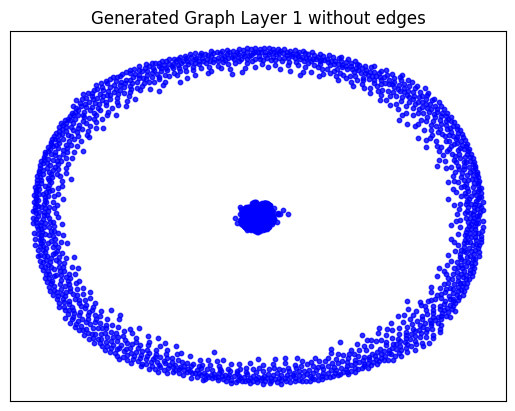

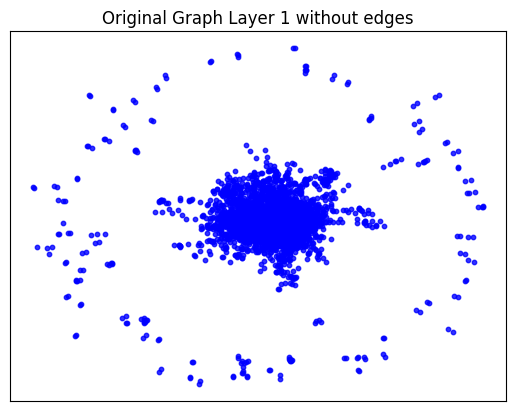

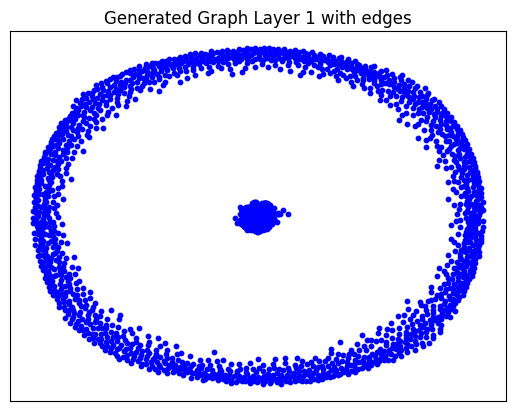

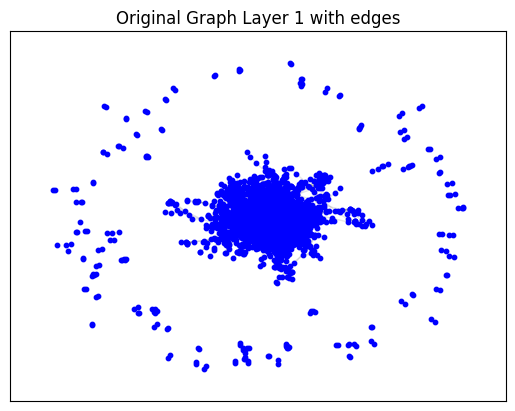

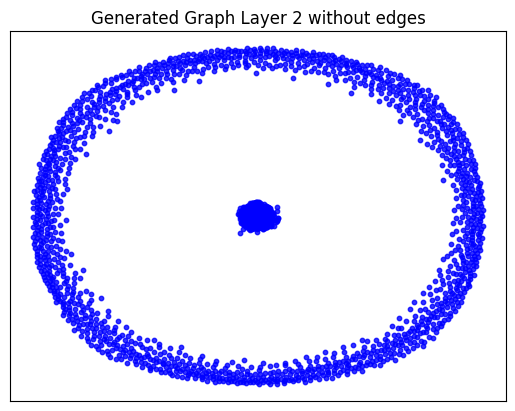

...

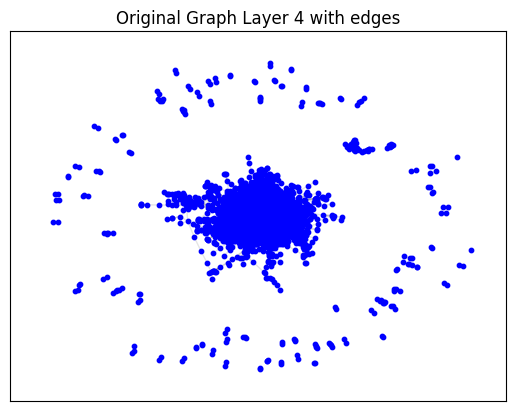

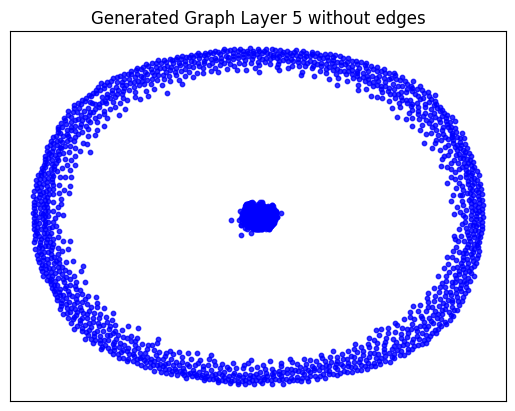

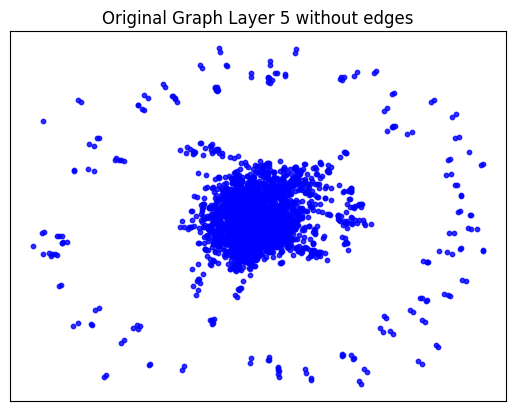

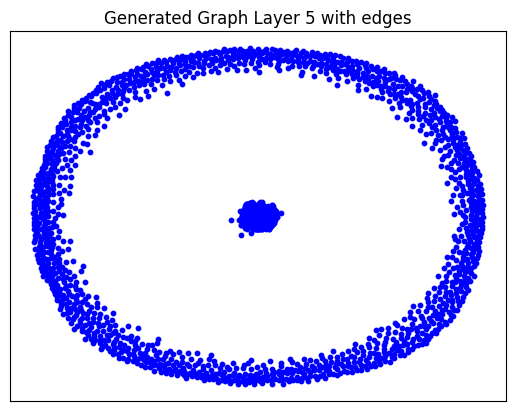

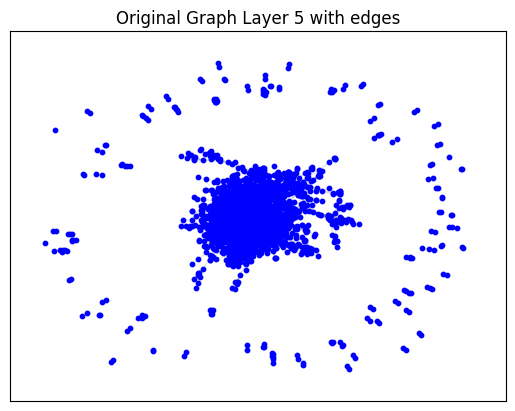

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_cora.
Flag learning_rate not found. Continuing...
Flag epochs not found. Continuing...
Flag hidden1 not found. Continuing...
Flag hidden2 not found. Continuing...
Flag weight_decay not found. Continuing...
Flag dropout not found. Continuing...
Flag filename not found. Continuing...
Flag model not found. Continuing...
Flag dataset not found. Continuing...
Flag features not found. Continuing...
Flag f not found. Continuing...


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
targets is deprecated, use labels instead


Epoch 0 - Cost: 1.732772707939148, Accuracy: 0.5004540681838989
Epoch 1 - Cost: 1.725758671760559, Accuracy: 0.5004328489303589
Epoch 2 - Cost: 1.6794590950012207, Accuracy: 0.5001320242881775
Epoch 3 - Cost: 1.6746182441711426, Accuracy: 0.5005833506584167
Epoch 4 - Cost: 1.6481860876083374, Accuracy: 0.5003359913825989
Epoch 5 - Cost: 1.5953391790390015, Accuracy: 0.49992719292640686
Epoch 6 - Cost: 1.5557194948196411, Accuracy: 0.4988921582698822
Epoch 7 - Cost: 1.5338737964630127, Accuracy: 0.4978293478488922
Epoch 8 - Cost: 1.4990330934524536, Accuracy: 0.49569058418273926
Epoch 9 - Cost: 1.4513596296310425, Accuracy: 0.494822233915329
Epoch 10 - Cost: 1.3685557842254639, Accuracy: 0.4929821193218231
Epoch 11 - Cost: 1.3421459197998047, Accuracy: 0.49049973487854004
Epoch 12 - Cost: 1.2510175704956055, Accuracy: 0.488444983959198
Epoch 13 - Cost: 1.1999908685684204, Accuracy: 0.4819084703922272
Epoch 14 - Cost: 1.1600481271743774, Accuracy: 0.4756171405315399
Epoch 15 - Cost: 1.08

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.11930012702941895 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 269, 'd_min': 0, 'd': 1.7928360413589366, 'LCC': 1042, 'wedge_count': 113438.0, 'claw_count': 6227750.999999999, 'triangle_count': 2618, 'power_law_exp': 2.4283147754283982, 'gini': 0.8460102956187334, 'rel_edge_distr_entropy': 0.7497381045789472, 'assortativity': -0.3201577459373219, 'clustering_coefficient': 0.001261129418950758, 'n_components': 1593}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  q = np.asarray(q, dtype=np.float)


KL divergence between original network and the network generated by Music_GAN: 10.837352397943375
KL divergence between original network and the network generated by Random E-R: 5.1943905601564575
KL divergence between original network and the network generated by Random B-A: 1.765950726935921
KL divergence between original network and the network generated by GAE: 1.4872970176361793
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.8640601191334524
KL divergence between original network and the network generated by Random E-R: 1.2090581718403193
KL divergence between original network and the network generated by Random B-A: 0.9435077076704936
KL divergence between original network and the network generated by GAE: 0.24135838992070127


In [ ]:
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

**PubMed Simulation:** <br>
The file taken from here: https://github.com/chennnM/GCNII/blob/master/data/ind.pubmed.graph <br>
Training MiscGan with the integrate G-Unets that trained with PROTEINS
<br>
We will split the dataset because of the limitation of GPU.

First batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_1.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_1'
args.filename = 'pubmed_1_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_1'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
Instructions for updating:
Call initializer instance

Starting training Layer 1
Epoch: [ 1] time: 13.7032
Epoch: [ 2] time: 13.9309
Epoch: [ 3] time: 14.1761
Epoch: [ 4] time: 14.3905
Epoch: [ 5] time: 14.6686
Epoch: [ 6] time: 14.8829
Epoch: [ 7] time: 15.0980
Epoch: [ 8] time: 15.3121
Epoch: [ 9] time: 15.5271
Epoch: [10] time: 15.7424
Epoch: [11] time: 15.9608
Epoch: [12] time: 16.1757
Epoch: [13] time: 16.3915
Epoch: [14] time: 16.6066
Epoch: [15] time: 16.8212
Epoch: [16] time: 17.0358
Epoch: [17] time: 17.2493
Epoch: [18] time: 17.4641
Epoch: [19] time: 17.6780
Epoch: [20] time: 17.8922
Epoch: [21] time: 18.1060
Epoch: [22] time: 18.3196
Epoch: [23] time: 18.5331
Epoch: [24] time: 18.7472
Epoch: [25] time: 18.9623
Epoch: [26] time: 19.1767
Epoch: [27] time: 19.3906
Epoch: [28] time: 19.6048
Epoch: [29] time: 19.8200
Epoch: [30] time: 20.0351
Epoch: [31] time: 20.2492
Epoch: [32] time: 20.4628
Epoch: [33] time: 20.6762
Epoch: [34] time: 20.8923
Epoch: [35] time: 21.1067
Epoch: [36] time: 21.3213
Epoch: [37] time: 21.5354
Epoch: [38] 

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)
/usr/local/lib/python3.10/dist-packages/numpy/lib/npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


Shape of new_h before assignment: torch.Size([6705, 64])
Shape of h_subset: torch.Size([387, 64])
Shape of idx: torch.Size([387])
Shape of new_h before assignment: torch.Size([6705, 64])
Shape of h_subset: torch.Size([309, 64])
Shape of idx: torch.Size([309])
Shape of new_h before assignment: torch.Size([6705, 64])
Shape of h_subset: torch.Size([216, 64])
Shape of idx: torch.Size([216])
Computing metrics for original graph
--- 0.03603935241699219 seconds to compute statistics_degrees ---
--- 1.630690336227417 seconds to compute statistics_LCC ---
--- 0.04813361167907715 seconds to compute statistics_wedge_count ---
--- 0.049927473068237305 seconds to compute statistics_claw_count ---
--- 0.2726302146911621 seconds to compute statistics_triangle_count ---
--- 0.03806662559509277 seconds to compute statistics_power_law_alpha ---
--- 0.03851723670959473 seconds to compute statistics_gini ---
--- 0.18094897270202637 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05940437

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07892823219299316 seconds to compute degree_assortativity_coefficient ---
--- 0.8390750885009766 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 118.0, 'd_min': 0.0, 'd': 2.3756897, 'LCC': 1964, 'wedge_count': 260021.0, 'claw_count': 4722132.0, 'triangle_count': 8584, 'power_law_exp': 1.522417981212999, 'gini': 0.9212864562259382, 'rel_edge_distr_entropy': 0.7420709033292543, 'assortativity': -0.040121926237261206, 'clustering_coefficient': 0.005453468899217557, 'n_components': 4739}


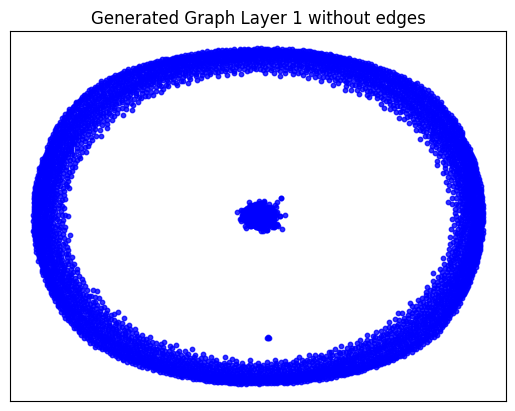

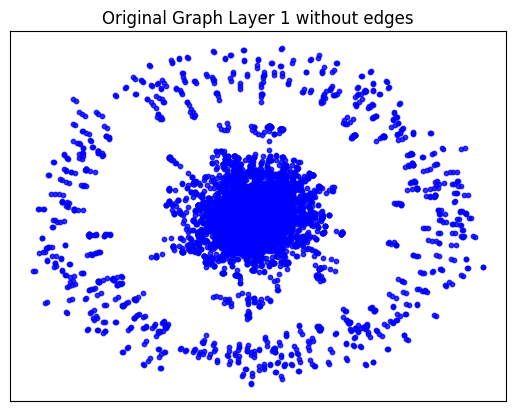

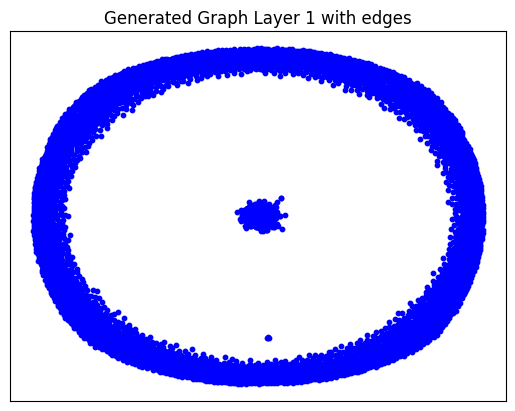

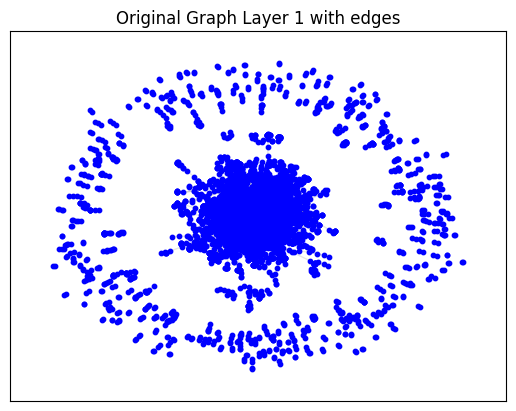

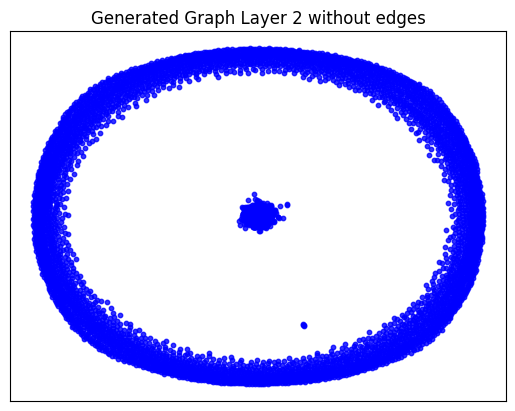

...

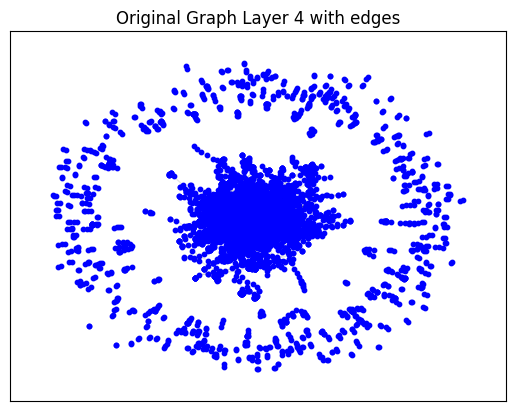

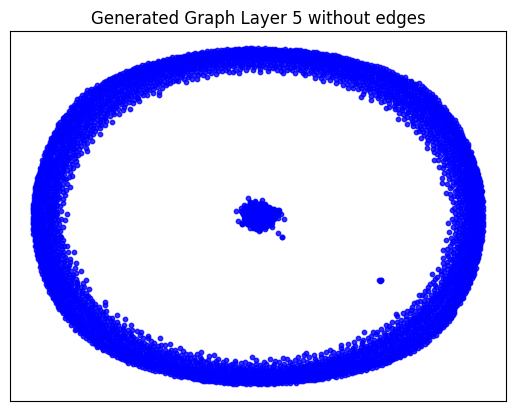

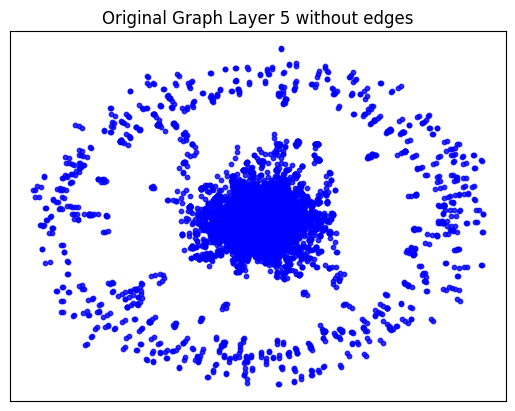

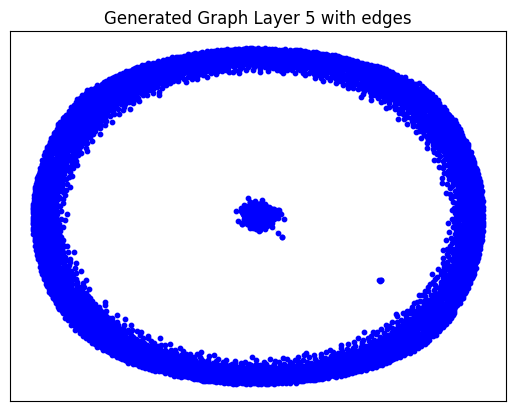

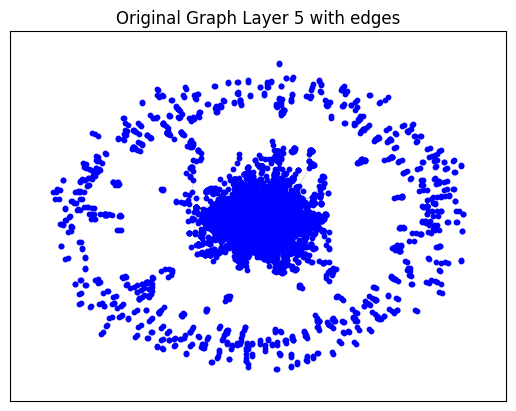

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_1.
Flag learning_rate not found. Continuing...
Flag epochs not found. Continuing...
Flag hidden1 not found. Continuing...
Flag hidden2 not found. Continuing...
Flag weight_decay not found. Continuing...
Flag dropout not found. Continuing...
Flag filename not found. Continuing...
Flag model not found. Continuing...
Flag dataset not found. Continuing...
Flag features not found. Continuing...
Flag f not found. Continuing...


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
targets is deprecated, use labels instead


Epoch 0 - Cost: 1.7708770036697388, Accuracy: 0.500065267086029
Epoch 1 - Cost: 1.746161937713623, Accuracy: 0.5000844597816467
Epoch 2 - Cost: 1.7051116228103638, Accuracy: 0.49966961145401
Epoch 3 - Cost: 1.6872073411941528, Accuracy: 0.500019371509552
Epoch 4 - Cost: 1.702643632888794, Accuracy: 0.49981191754341125
Epoch 5 - Cost: 1.6878135204315186, Accuracy: 0.4997149705886841
Epoch 6 - Cost: 1.645103931427002, Accuracy: 0.49923616647720337
Epoch 7 - Cost: 1.6334062814712524, Accuracy: 0.49926066398620605
Epoch 8 - Cost: 1.5815545320510864, Accuracy: 0.4986054301261902
Epoch 9 - Cost: 1.5309568643569946, Accuracy: 0.4976634979248047
Epoch 10 - Cost: 1.5220037698745728, Accuracy: 0.4962926208972931
Epoch 11 - Cost: 1.4605298042297363, Accuracy: 0.49472662806510925
Epoch 12 - Cost: 1.411899447441101, Accuracy: 0.49098673462867737
Epoch 13 - Cost: 1.355958104133606, Accuracy: 0.48859158158302307
Epoch 14 - Cost: 1.310933232307434, Accuracy: 0.48179399967193604
Epoch 15 - Cost: 1.2642

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1776740550994873 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05114030838012695 seconds to compute degree_assortativity_coefficient ---
--- 0.8127684593200684 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 257, 'd_min': 0, 'd': 1.235759021771548, 'LCC': 1636, 'wedge_count': 160579.0, 'claw_count': 6259980.0, 'triangle_count': 7480, 'power_law_exp': 2.442122324680664, 'gini': 0.9231580795306005, 'rel_edge_distr_entropy': 0.7124410704242037, 'assortativity': -0.305402562307266, 'clustering_coefficient': 0.003584675989380158, 'n_components': 5071}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:48: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by it

KL divergence between original network and the network generated by Music_GAN: 0.7816281302680108
KL divergence between original network and the network generated by Random E-R: 6.203112632861247
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0004873998817354215
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.6506563430883885
KL divergence between original network and the network generated by Random E-R: 3.5808161360574426
KL divergence between original network and the network generated by Random B-A: 1.8830643726523195
KL divergence between original network and the network generated by GAE: 30.218288988561874


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Second batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_2.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_2'
args.filename = 'pubmed_2_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_2'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.3481
Epoch: [ 2] time: 10.5267
Epoch: [ 3] time: 10.7054
Epoch: [ 4] time: 10.8838
Epoch: [ 5] time: 11.0634
Epoch: [ 6] time: 11.2412
Epoch: [ 7] time: 11.4195
Epoch: [ 8] time: 11.5978
Epoch: [ 9] time: 11.7770
Epoch: [10] time: 11.9556
Epoch: [11] time: 12.1339
Epoch: [12] time: 12.3123
Epoch: [13] time: 12.4909
Epoch: [14] time: 12.6694
Epoch: [15] time: 12.8482
Epoch: [16] time: 13.0259
Epoch: [17] time: 13.2045
Epoch: [18] time: 13.3829
Epoch: [19] time: 13.5610
Epoch: [20] time: 13.7395
Epoch: [21] time: 13.9188
Epoch: [22] time: 14.0979
Epoch: [23] time: 14.2770
Epoch: [24] time: 14.4554
Epoch: [25] time: 14.6343
Epoch: [26] time: 14.8132
Epoch: [27] time: 14.9920
Epoch: [28] time: 15.1719
Epoch: [29] time: 15.3526
Epoch: [30] time: 15.5469
Epoch: [31] time: 15.7266
Epoch: [32] time: 15.9064
Epoch: [33] time: 16.0853
Epoch: [34] time: 16.2644
Epoch: [35] time: 16.4423
Epoch: [36] time: 16.6211
Epoch: [37] time: 16.8007
Epoch: [38] 

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6178, 64])
Shape of h_subset: torch.Size([357, 64])
Shape of idx: torch.Size([357])
Shape of new_h before assignment: torch.Size([6178, 64])
Shape of h_subset: torch.Size([285, 64])
Shape of idx: torch.Size([285])
Shape of new_h before assignment: torch.Size([6178, 64])
Shape of h_subset: torch.Size([199, 64])
Shape of idx: torch.Size([199])
Computing metrics for original graph
--- 0.029554128646850586 seconds to compute statistics_degrees ---
--- 1.2695324420928955 seconds to compute statistics_LCC ---
--- 0.04061627388000488 seconds to compute statistics_wedge_count ---
--- 0.041596174240112305 seconds to compute statistics_claw_count ---
--- 0.2366020679473877 seconds to compute statistics_triangle_count ---
--- 0.03097391128540039 seconds to compute statistics_power_law_alpha ---
--- 0.030860424041748047 seconds to compute statistics_gini ---
--- 0.1484975814819336 seconds to compute statistics_edge_distribution_entropy ---
--- 0.055399

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.677687406539917 seconds to compute connected_components ---
--- 4.291534423828125e-06 seconds to compute statistics_cluster_props ---
{'d_max': 127.0, 'd_min': 0.0, 'd': 2.4268372, 'LCC': 2114, 'wedge_count': 255574.0, 'claw_count': 5132752.0, 'triangle_count': 8527, 'power_law_exp': 1.615150201492649, 'gini': 0.9155785919044512, 'rel_edge_distr_entropy': 0.7466747485579016, 'assortativity': -0.17281923068537844, 'clustering_coefficient': 0.004983876096098155, 'n_components': 4039}


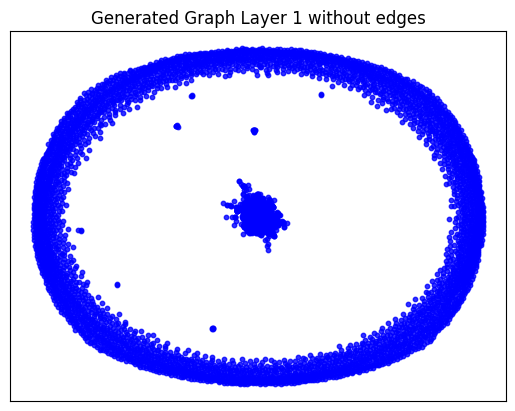

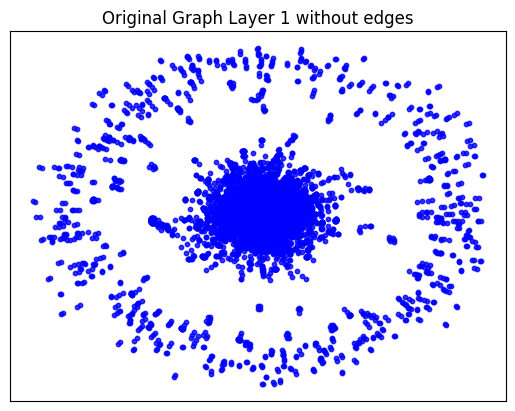

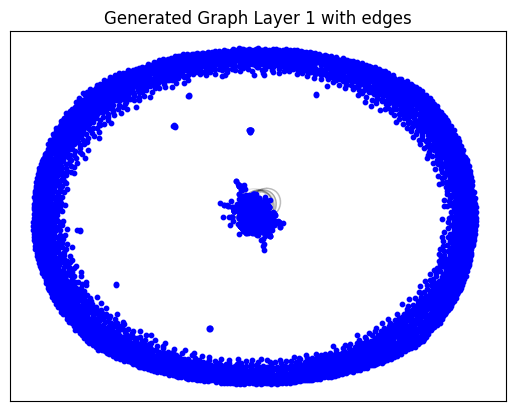

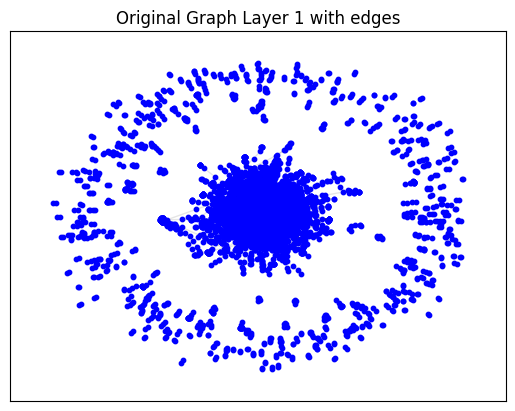

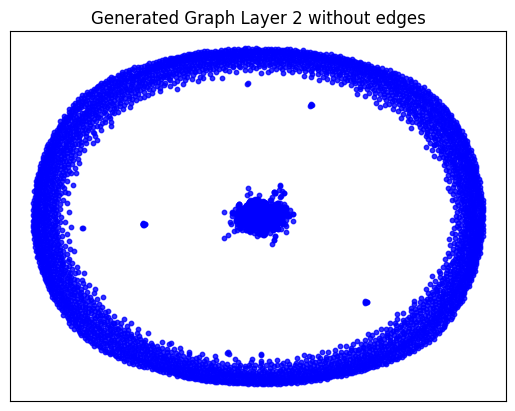

...

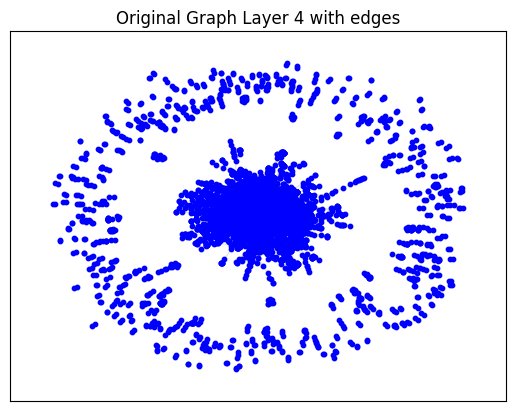

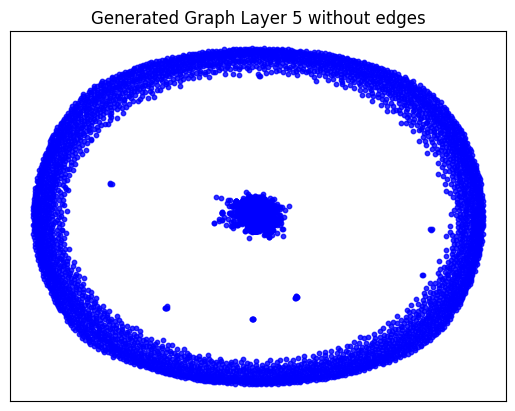

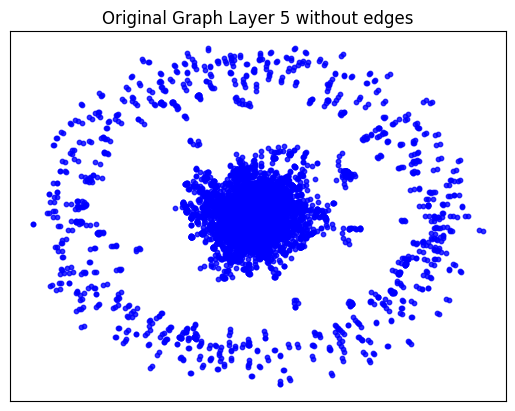

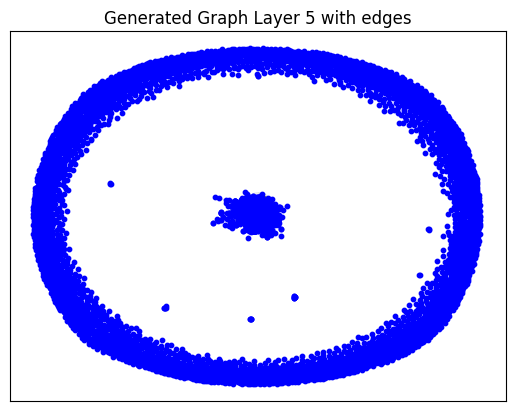

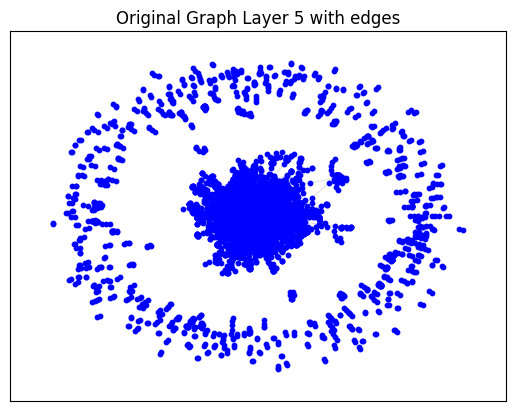

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_2.
Epoch 0 - Cost: 1.6920616626739502, Accuracy: 0.4999903738498688
Epoch 1 - Cost: 1.7147161960601807, Accuracy: 0.5000301003456116
Epoch 2 - Cost: 1.7195534706115723, Accuracy: 0.5000854730606079
Epoch 3 - Cost: 1.6916731595993042, Accuracy: 0.49962514638900757
Epoch 4 - Cost: 1.687073826789856, Accuracy: 0.49952033162117004
Epoch 5 - Cost: 1.6201987266540527, Accuracy: 0.4999580979347229
Epoch 6 - Cost: 1.5989501476287842, Accuracy: 0.4997621774673462
Epoch 7 - Cost: 1.5644574165344238, Accuracy: 0.49859705567359924
Epoch 8 - Cost: 1.5282362699508667, Accuracy: 0.49815914034843445
Epoch 9 - Cost: 1.4868112802505493, Accuracy: 0.49744391441345215
Epoch 10 - Cost: 1.4340622425079346, Accuracy: 0.496516615152359
Epoch 11 - Cost: 1.3838526010513306, Accuracy: 0.4939342141151428
Epoch 12 - Cost: 1.3308591842651367, Accuracy: 0.49266716837882996
Epoch 13 - Co

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15509724617004395 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05013108253479004 seconds to compute degree_assortativity_coefficient ---
--- 0.6251523494720459 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 273, 'd_min': 0, 'd': 1.2659006311700922, 'LCC': 1468, 'wedge_count': 177189.0, 'claw_count': 7872320.0, 'triangle_count': 8292, 'power_law_exp': 2.3571860711295582, 'gini': 0.9259576723049163, 'rel_edge_distr_entropy': 0.7025190258571787, 'assortativity': -0.29922860188063527, 'clustering_coefficient': 0.003159932523068168, 'n_components': 4705}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.012768824850652576
KL divergence between original network and the network generated by Random E-R: 6.172496028052713
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0021213828489306604
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.5621873121723737
KL divergence between original network and the network generated by Random E-R: 45.467674362725376
KL divergence between original network and the network generated by Random B-A: 2.008851192064434
KL divergence between original network and the network generated by GAE: 32.45871097547705


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Third batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_3.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_3'
args.filename = 'pubmed_3_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_3'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.4410
Epoch: [ 2] time: 10.7798
Epoch: [ 3] time: 11.1185
Epoch: [ 4] time: 11.4572
Epoch: [ 5] time: 11.7961
Epoch: [ 6] time: 12.1348
Epoch: [ 7] time: 12.4738
Epoch: [ 8] time: 12.8121
Epoch: [ 9] time: 13.1502
Epoch: [10] time: 13.4885
Epoch: [11] time: 13.8270
Epoch: [12] time: 14.1652
Epoch: [13] time: 14.5038
Epoch: [14] time: 14.8422
Epoch: [15] time: 15.1816
Epoch: [16] time: 15.5203
Epoch: [17] time: 15.8587
Epoch: [18] time: 16.1971
Epoch: [19] time: 16.5351
Epoch: [20] time: 16.8734
Epoch: [21] time: 17.2119
Epoch: [22] time: 17.5505
Epoch: [23] time: 17.8890
Epoch: [24] time: 18.2274
Epoch: [25] time: 18.5655
Epoch: [26] time: 18.9036
Epoch: [27] time: 19.2422
Epoch: [28] time: 19.5809
Epoch: [29] time: 19.9200
Epoch: [30] time: 20.2589
Epoch: [31] time: 20.5978
Epoch: [32] time: 20.9372
Epoch: [33] time: 21.2770
Epoch: [34] time: 21.6161
Epoch: [35] time: 21.9546
Epoch: [36] time: 22.2942
Epoch: [37] time: 22.6332
Epoch: [38] 

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([360, 64])
Shape of idx: torch.Size([360])
Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([288, 64])
Shape of idx: torch.Size([288])
Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([201, 64])
Shape of idx: torch.Size([201])
Computing metrics for original graph
--- 0.03079533576965332 seconds to compute statistics_degrees ---
--- 1.31496262550354 seconds to compute statistics_LCC ---
--- 0.042038679122924805 seconds to compute statistics_wedge_count ---
--- 0.04264235496520996 seconds to compute statistics_claw_count ---
--- 0.24394631385803223 seconds to compute statistics_triangle_count ---
--- 0.03137063980102539 seconds to compute statistics_power_law_alpha ---
--- 0.03172421455383301 seconds to compute statistics_gini ---
--- 0.15144634246826172 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05745387

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6708874702453613 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 98.0, 'd_min': 0.0, 'd': 2.3978872, 'LCC': 2456, 'wedge_count': 196086.0, 'claw_count': 2747945.0, 'triangle_count': 11155, 'power_law_exp': 1.6328148165739926, 'gini': 0.9017166096541629, 'rel_edge_distr_entropy': 0.7661915032613674, 'assortativity': 0.1098146769500586, 'clustering_coefficient': 0.012178191339346311, 'n_components': 3755}


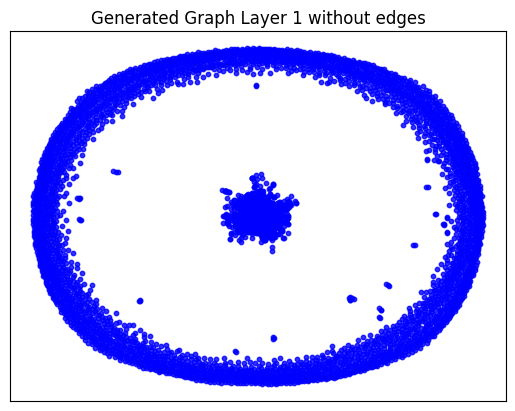

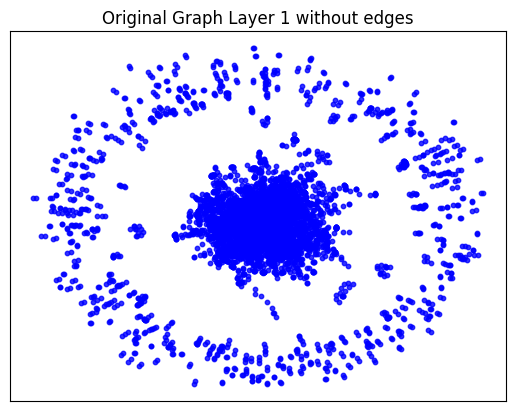

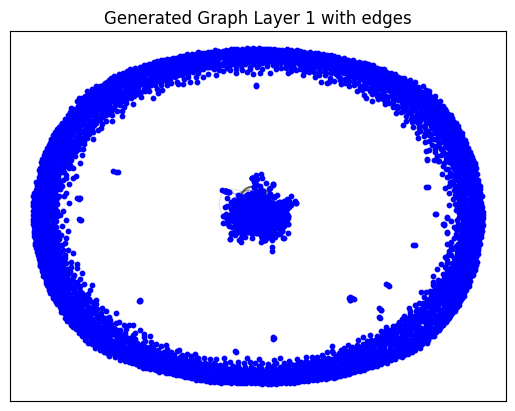

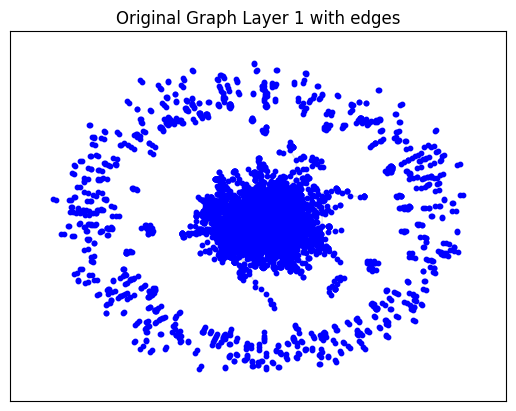

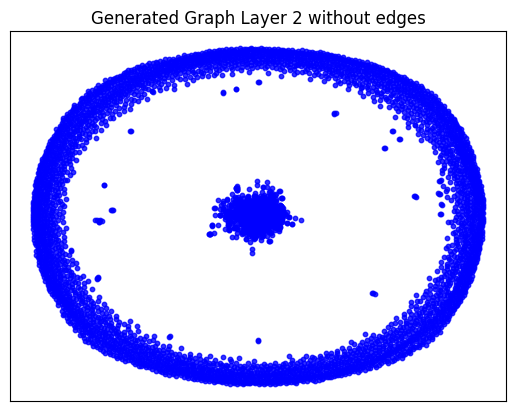

...

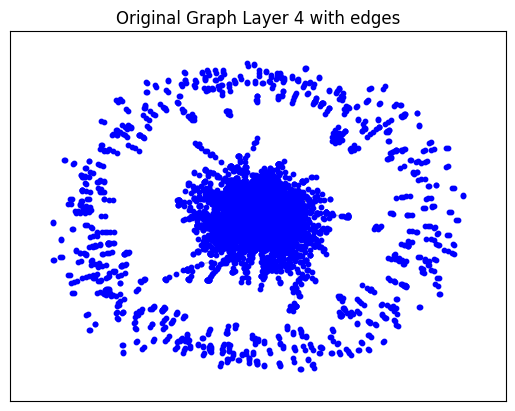

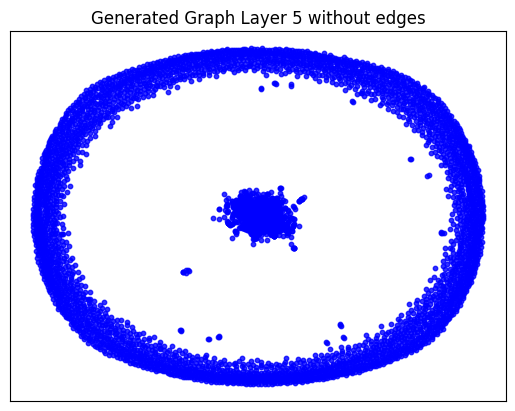

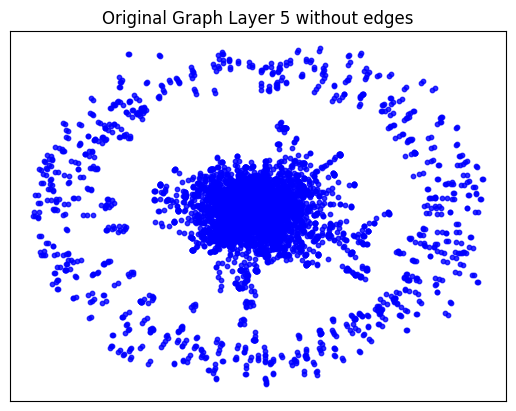

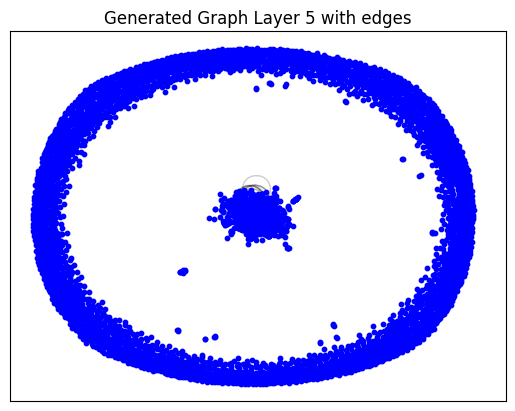

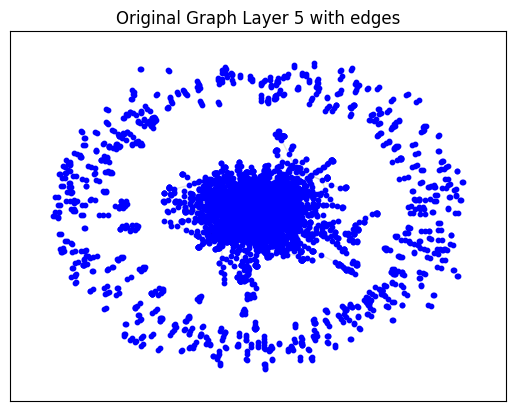

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_3.
Epoch 0 - Cost: 1.7170915603637695, Accuracy: 0.4999091327190399
Epoch 1 - Cost: 1.7169142961502075, Accuracy: 0.500095546245575
Epoch 2 - Cost: 1.710178017616272, Accuracy: 0.5001257061958313
Epoch 3 - Cost: 1.6883788108825684, Accuracy: 0.4996272325515747
Epoch 4 - Cost: 1.6684396266937256, Accuracy: 0.4991311728954315
Epoch 5 - Cost: 1.637284517288208, Accuracy: 0.4991506338119507
Epoch 6 - Cost: 1.5831787586212158, Accuracy: 0.4988323748111725
Epoch 7 - Cost: 1.5319150686264038, Accuracy: 0.4972206950187683
Epoch 8 - Cost: 1.476601004600525, Accuracy: 0.49636343121528625
Epoch 9 - Cost: 1.4155038595199585, Accuracy: 0.49350979924201965
Epoch 10 - Cost: 1.3972805738449097, Accuracy: 0.4916875660419464
Epoch 11 - Cost: 1.3227182626724243, Accuracy: 0.4859442710876465
Epoch 12 - Cost: 1.2620474100112915, Accuracy: 0.4801930785179138
Epoch 13 - Cost: 1.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15479803085327148 seconds to compute statistics_edge_distribution_entropy ---
--- 0.047675371170043945 seconds to compute degree_assortativity_coefficient ---
--- 0.653846263885498 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 142, 'd_min': 0, 'd': 1.2473995839334293, 'LCC': 1199, 'wedge_count': 135144.0, 'claw_count': 3122539.0, 'triangle_count': 9805, 'power_law_exp': 2.0886724548023796, 'gini': 0.9401889985527898, 'rel_edge_distr_entropy': 0.6945671052966103, 'assortativity': -0.3351002166178532, 'clustering_coefficient': 0.009420218610560189, 'n_components': 5051}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.22465729991459
KL divergence between original network and the network generated by Random E-R: 5.183851963912622
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.99756826281343
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.5505958270160856
KL divergence between original network and the network generated by Random E-R: 11.976539581849007
KL divergence between original network and the network generated by Random B-A: 1.9309413203050656
KL divergence between original network and the network generated by GAE: 36.17520101110545


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fourth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_4.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_4'
args.filename = 'pubmed_4_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_4'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 11.6681
Epoch: [ 2] time: 12.0195
Epoch: [ 3] time: 12.3712
Epoch: [ 4] time: 12.7231
Epoch: [ 5] time: 13.0745
Epoch: [ 6] time: 13.4262
Epoch: [ 7] time: 13.7776
Epoch: [ 8] time: 14.1284
Epoch: [ 9] time: 14.4793
Epoch: [10] time: 14.8298
Epoch: [11] time: 15.1810
Epoch: [12] time: 15.5318
Epoch: [13] time: 15.8828
Epoch: [14] time: 16.2338
Epoch: [15] time: 16.5849
Epoch: [16] time: 16.9363
Epoch: [17] time: 17.2876
Epoch: [18] time: 17.6382
Epoch: [19] time: 17.9889
Epoch: [20] time: 18.3401
Epoch: [21] time: 18.6908
Epoch: [22] time: 19.0418
Epoch: [23] time: 19.3931
Epoch: [24] time: 19.7448
Epoch: [25] time: 20.0967
Epoch: [26] time: 20.4487
Epoch: [27] time: 20.8018
Epoch: [28] time: 21.1640
Epoch: [29] time: 21.5152
Epoch: [30] time: 21.8661
Epoch: [31] time: 22.2171
Epoch: [32] time: 22.5678
Epoch: [33] time: 22.9186
Epoch: [34] time: 23.2700
Epoch: [35] time: 23.6208
Epoch: [36] time: 23.9715
Epoch: [37] time: 24.3236
Epoch: [38] 

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6376, 64])
Shape of h_subset: torch.Size([368, 64])
Shape of idx: torch.Size([368])
Shape of new_h before assignment: torch.Size([6376, 64])
Shape of h_subset: torch.Size([294, 64])
Shape of idx: torch.Size([294])
Shape of new_h before assignment: torch.Size([6376, 64])
Shape of h_subset: torch.Size([205, 64])
Shape of idx: torch.Size([205])
Computing metrics for original graph
--- 0.03226208686828613 seconds to compute statistics_degrees ---
--- 1.3670015335083008 seconds to compute statistics_LCC ---
--- 0.04435896873474121 seconds to compute statistics_wedge_count ---
--- 0.044413089752197266 seconds to compute statistics_claw_count ---
--- 0.24795913696289062 seconds to compute statistics_triangle_count ---
--- 0.03333687782287598 seconds to compute statistics_power_law_alpha ---
--- 0.03342795372009277 seconds to compute statistics_gini ---
--- 0.16009974479675293 seconds to compute statistics_edge_distribution_entropy ---
--- 0.058090

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.701305627822876 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 103.0, 'd_min': 0.0, 'd': 2.3640213, 'LCC': 1862, 'wedge_count': 290013.0, 'claw_count': 5257166.0, 'triangle_count': 335, 'power_law_exp': 1.496984432737289, 'gini': 0.9390615712024983, 'rel_edge_distr_entropy': 0.7134105960817836, 'assortativity': 0.0006127548698796697, 'clustering_coefficient': 0.00019116763670768623, 'n_components': 4497}


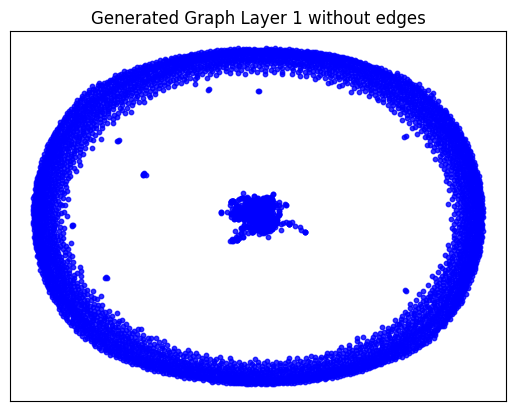

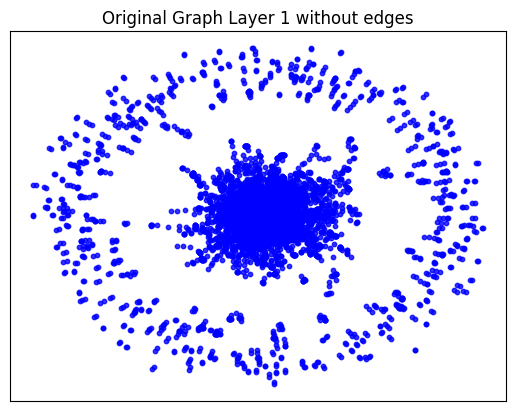

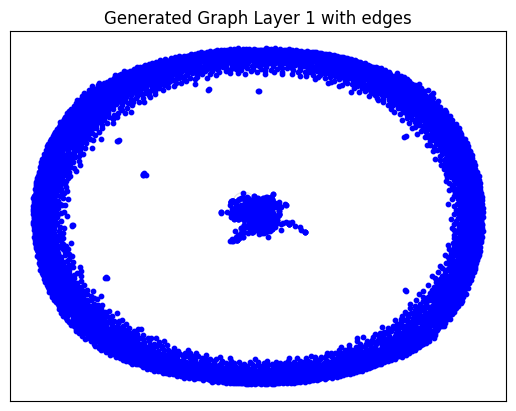

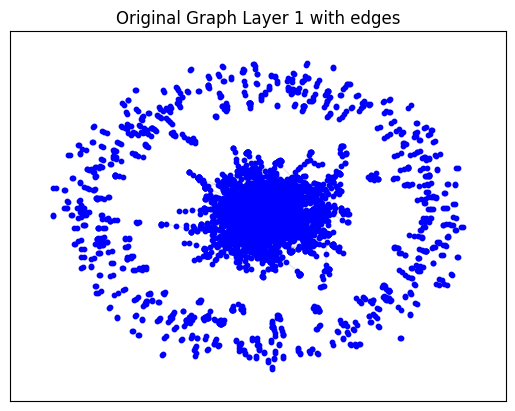

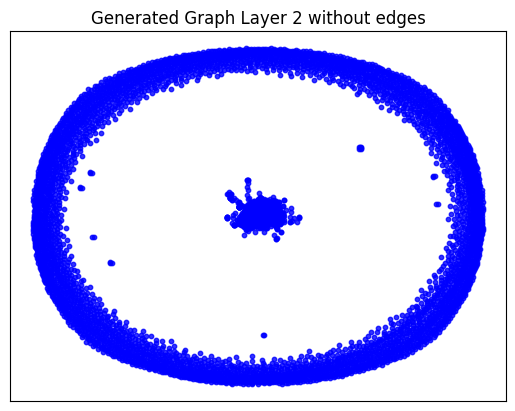

...

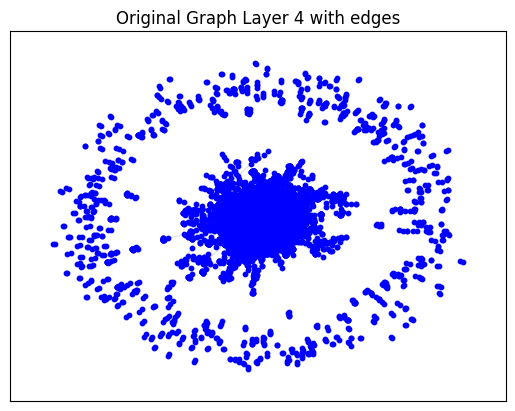

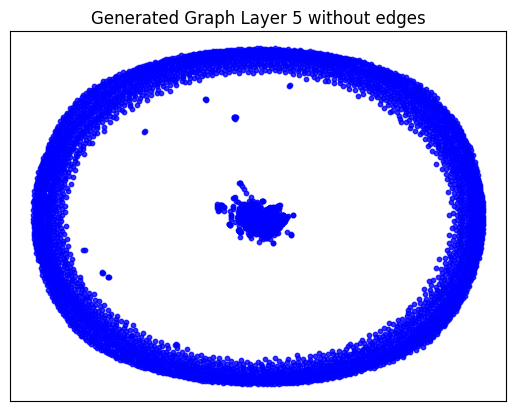

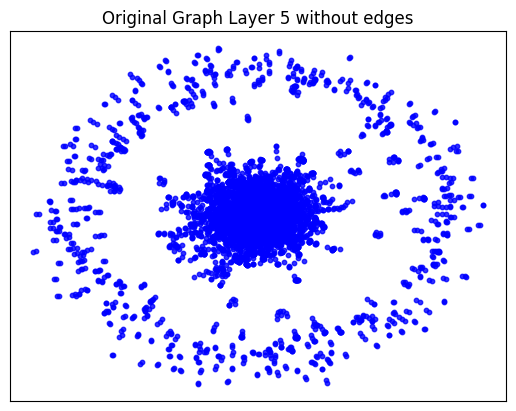

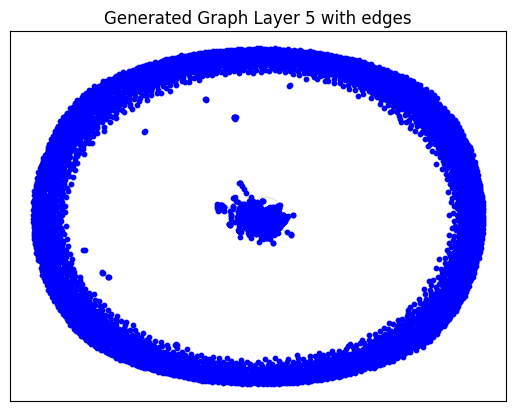

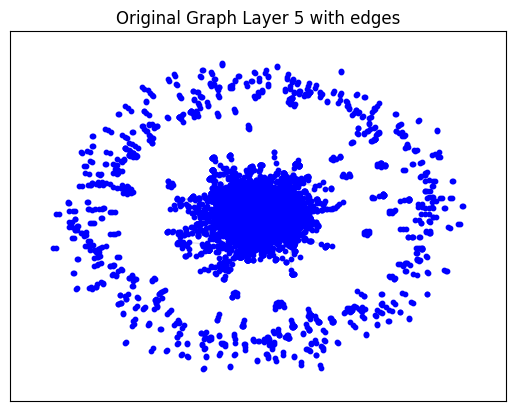

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_4.
Epoch 0 - Cost: 1.7261912822723389, Accuracy: 0.5000144839286804
Epoch 1 - Cost: 1.7151052951812744, Accuracy: 0.5000218152999878
Epoch 2 - Cost: 1.7278879880905151, Accuracy: 0.5000808238983154
Epoch 3 - Cost: 1.6681805849075317, Accuracy: 0.5000954866409302
Epoch 4 - Cost: 1.631944179534912, Accuracy: 0.49966537952423096
Epoch 5 - Cost: 1.6257610321044922, Accuracy: 0.4995480179786682
Epoch 6 - Cost: 1.5706455707550049, Accuracy: 0.49927133321762085
Epoch 7 - Cost: 1.5390499830245972, Accuracy: 0.4983747601509094
Epoch 8 - Cost: 1.5037156343460083, Accuracy: 0.49730420112609863
Epoch 9 - Cost: 1.4773181676864624, Accuracy: 0.4953411817550659
Epoch 10 - Cost: 1.3875483274459839, Accuracy: 0.49474865198135376
Epoch 11 - Cost: 1.378989815711975, Accuracy: 0.4919357895851135
Epoch 12 - Cost: 1.2955974340438843, Accuracy: 0.4885428845882416
Epoch 13 - Cost

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.16540026664733887 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04933667182922363 seconds to compute degree_assortativity_coefficient ---
--- 0.684065580368042 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 229, 'd_min': 0, 'd': 1.2280068997961424, 'LCC': 1276, 'wedge_count': 175557.0, 'claw_count': 6486473.0, 'triangle_count': 13270, 'power_law_exp': 2.180806565124322, 'gini': 0.9395031912087812, 'rel_edge_distr_entropy': 0.6860933732041012, 'assortativity': -0.32597853522376474, 'clustering_coefficient': 0.006137387760652052, 'n_components': 5101}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.2313432984169126
KL divergence between original network and the network generated by Random E-R: 5.8537356545180765
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.2335441814723596
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.5649493575326723
KL divergence between original network and the network generated by Random E-R: 3.8265124424252934
KL divergence between original network and the network generated by Random B-A: 2.042575770813447
KL divergence between original network and the network generated by GAE: 47.3786859383867


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fifth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_5.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_5'
args.filename = 'pubmed_5_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_5'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.3896
Epoch: [ 2] time: 7.7269
Epoch: [ 3] time: 8.0639
Epoch: [ 4] time: 8.4017
Epoch: [ 5] time: 8.7403
Epoch: [ 6] time: 9.0784
Epoch: [ 7] time: 9.4172
Epoch: [ 8] time: 9.7555
Epoch: [ 9] time: 10.0944
Epoch: [10] time: 10.4337
Epoch: [11] time: 10.7715
Epoch: [12] time: 11.1109
Epoch: [13] time: 11.4601
Epoch: [14] time: 11.8094
Epoch: [15] time: 12.1582
Epoch: [16] time: 12.5070
Epoch: [17] time: 12.8462
Epoch: [18] time: 13.1849
Epoch: [19] time: 13.5229
Epoch: [20] time: 13.8605
Epoch: [21] time: 14.1993
Epoch: [22] time: 14.5374
Epoch: [23] time: 14.8762
Epoch: [24] time: 15.2150
Epoch: [25] time: 15.5539
Epoch: [26] time: 15.8917
Epoch: [27] time: 16.2305
Epoch: [28] time: 16.5684
Epoch: [29] time: 16.9070
Epoch: [30] time: 17.2458
Epoch: [31] time: 17.5845
Epoch: [32] time: 17.9225
Epoch: [33] time: 18.2603
Epoch: [34] time: 18.6000
Epoch: [35] time: 18.9384
Epoch: [36] time: 19.2771
Epoch: [37] time: 19.6149
Epoch: [38] time: 19

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([360, 64])
Shape of idx: torch.Size([360])
Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([288, 64])
Shape of idx: torch.Size([288])
Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([201, 64])
Shape of idx: torch.Size([201])
Computing metrics for original graph
--- 0.030596494674682617 seconds to compute statistics_degrees ---
--- 1.3169894218444824 seconds to compute statistics_LCC ---
--- 0.041582584381103516 seconds to compute statistics_wedge_count ---
--- 0.04274272918701172 seconds to compute statistics_claw_count ---
--- 0.24420738220214844 seconds to compute statistics_triangle_count ---
--- 0.03182840347290039 seconds to compute statistics_power_law_alpha ---
--- 0.0322110652923584 seconds to compute statistics_gini ---
--- 0.15455937385559082 seconds to compute statistics_edge_distribution_entropy ---
--- 0.056842

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.7350163459777832 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 122.0, 'd_min': 0.0, 'd': 2.4006083, 'LCC': 1987, 'wedge_count': 243745.0, 'claw_count': 4606738.0, 'triangle_count': 5032, 'power_law_exp': 1.720189288874119, 'gini': 0.9081291612355888, 'rel_edge_distr_entropy': 0.7551758766899975, 'assortativity': -0.2308904409841608, 'clustering_coefficient': 0.0032769391269918107, 'n_components': 4179}


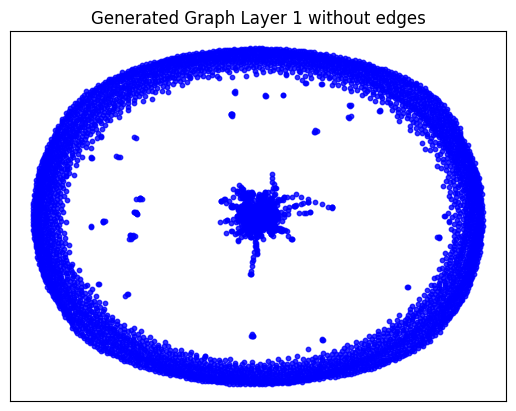

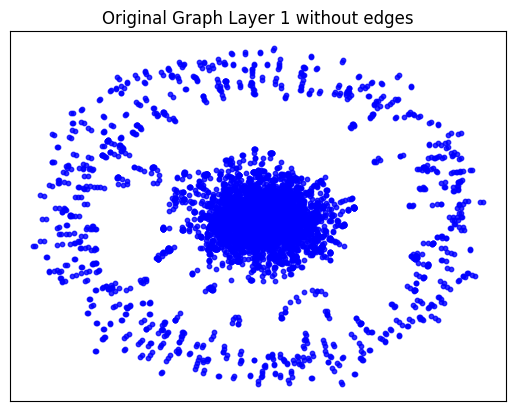

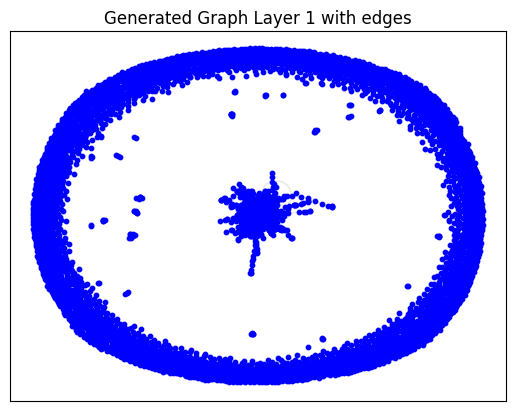

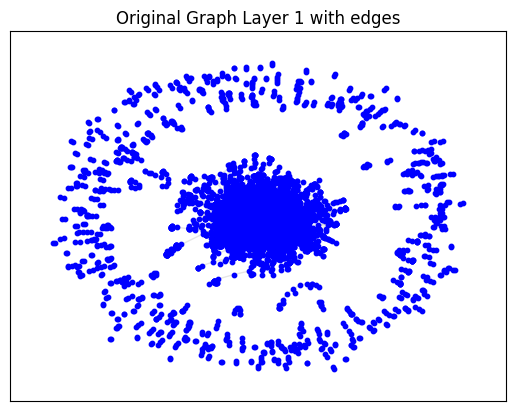

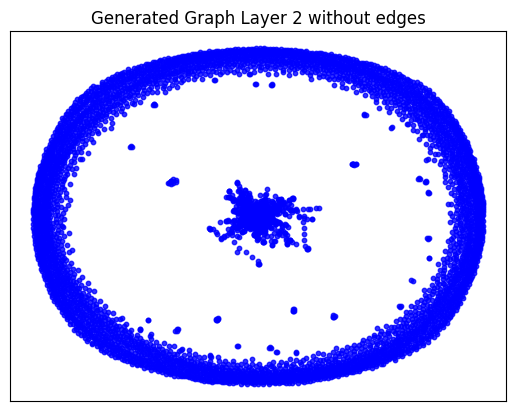

...

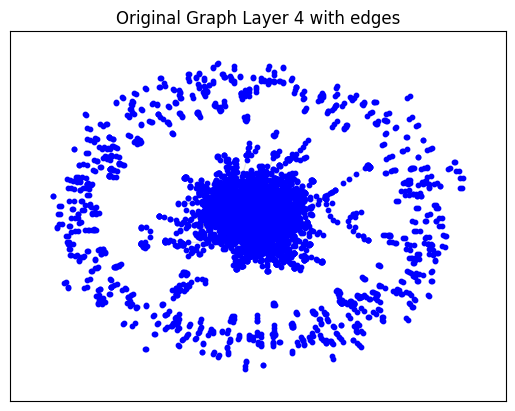

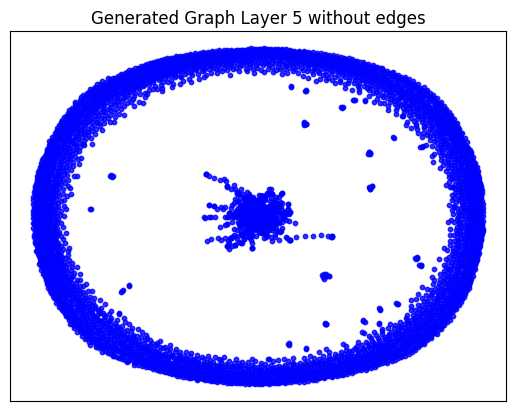

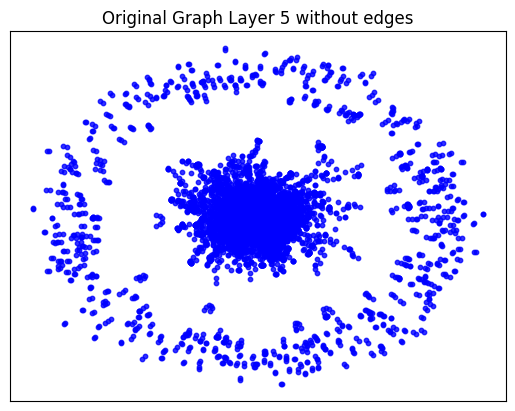

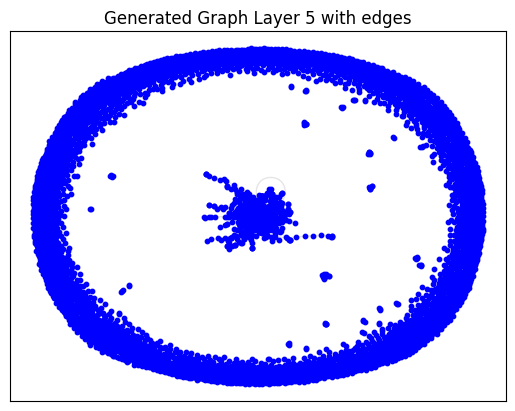

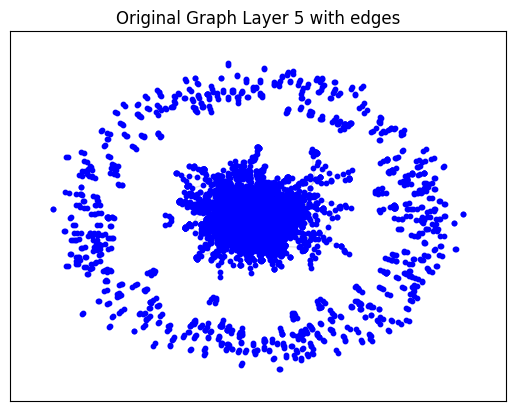

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_5.
Epoch 0 - Cost: 1.7286598682403564, Accuracy: 0.5000606179237366
Epoch 1 - Cost: 1.7592312097549438, Accuracy: 0.49996456503868103
Epoch 2 - Cost: 1.6992039680480957, Accuracy: 0.49997392296791077
Epoch 3 - Cost: 1.6782200336456299, Accuracy: 0.5001943707466125
Epoch 4 - Cost: 1.686892032623291, Accuracy: 0.49973347783088684
Epoch 5 - Cost: 1.6315122842788696, Accuracy: 0.49959099292755127
Epoch 6 - Cost: 1.645726203918457, Accuracy: 0.49937981367111206
Epoch 7 - Cost: 1.5453205108642578, Accuracy: 0.4986400008201599
Epoch 8 - Cost: 1.5323363542556763, Accuracy: 0.4983349144458771
Epoch 9 - Cost: 1.4826483726501465, Accuracy: 0.4979749917984009
Epoch 10 - Cost: 1.4446146488189697, Accuracy: 0.4968850314617157
Epoch 11 - Cost: 1.3988226652145386, Accuracy: 0.4959964156150818
Epoch 12 - Cost: 1.3376764059066772, Accuracy: 0.4934445023536682
Epoch 13 - Cos

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15505099296569824 seconds to compute statistics_edge_distribution_entropy ---
--- 0.048882246017456055 seconds to compute degree_assortativity_coefficient ---
--- 0.6509213447570801 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 251, 'd_min': 0, 'd': 1.250760121619459, 'LCC': 1259, 'wedge_count': 158582.0, 'claw_count': 5841348.0, 'triangle_count': 8608, 'power_law_exp': 2.1217864528048747, 'gini': 0.9371117802594577, 'rel_edge_distr_entropy': 0.6948427221241853, 'assortativity': -0.30542050374877416, 'clustering_coefficient': 0.004420897368210214, 'n_components': 4989}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.0219198125846836
KL divergence between original network and the network generated by Random E-R: 5.331630011829857
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 4.52048110509093
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.760009636742671
KL divergence between original network and the network generated by Random E-R: 2.984721373564728
KL divergence between original network and the network generated by Random B-A: 1.9723943327876832
KL divergence between original network and the network generated by GAE: 31.223018422686547


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Sixth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_6.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_6'
args.filename = 'pubmed_6_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_6'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.5367
Epoch: [ 2] time: 10.8661
Epoch: [ 3] time: 11.1949
Epoch: [ 4] time: 11.5238
Epoch: [ 5] time: 11.8529
Epoch: [ 6] time: 12.1817
Epoch: [ 7] time: 12.5098
Epoch: [ 8] time: 12.8381
Epoch: [ 9] time: 13.1666
Epoch: [10] time: 13.4953
Epoch: [11] time: 13.8238
Epoch: [12] time: 14.1575
Epoch: [13] time: 14.4946
Epoch: [14] time: 14.8238
Epoch: [15] time: 15.1534
Epoch: [16] time: 15.4828
Epoch: [17] time: 15.8125
Epoch: [18] time: 16.1427
Epoch: [19] time: 16.4714
Epoch: [20] time: 16.7999
Epoch: [21] time: 17.1284
Epoch: [22] time: 17.4578
Epoch: [23] time: 17.7861
Epoch: [24] time: 18.1142
Epoch: [25] time: 18.4430
Epoch: [26] time: 18.7709
Epoch: [27] time: 19.0991
Epoch: [28] time: 19.4274
Epoch: [29] time: 19.7557
Epoch: [30] time: 20.0846
Epoch: [31] time: 20.4133
Epoch: [32] time: 20.7426
Epoch: [33] time: 21.0711
Epoch: [34] time: 21.3994
Epoch: [35] time: 21.7281
Epoch: [36] time: 22.0571
Epoch: [37] time: 22.3856
Epoch: [38] 

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6130, 64])
Shape of h_subset: torch.Size([354, 64])
Shape of idx: torch.Size([354])
Shape of new_h before assignment: torch.Size([6130, 64])
Shape of h_subset: torch.Size([283, 64])
Shape of idx: torch.Size([283])
Shape of new_h before assignment: torch.Size([6130, 64])
Shape of h_subset: torch.Size([198, 64])
Shape of idx: torch.Size([198])
Computing metrics for original graph
--- 0.02947235107421875 seconds to compute statistics_degrees ---
--- 1.2605223655700684 seconds to compute statistics_LCC ---
--- 0.03955674171447754 seconds to compute statistics_wedge_count ---
--- 0.04111361503601074 seconds to compute statistics_claw_count ---
--- 0.23096942901611328 seconds to compute statistics_triangle_count ---
--- 0.030362606048583984 seconds to compute statistics_power_law_alpha ---
--- 0.030315160751342773 seconds to compute statistics_gini ---
--- 0.1464543342590332 seconds to compute statistics_edge_distribution_entropy ---
--- 0.053925

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6463325023651123 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 73.0, 'd_min': 0.0, 'd': 2.3856444, 'LCC': 2274, 'wedge_count': 147354.0, 'claw_count': 1669721.0, 'triangle_count': 2852, 'power_law_exp': 1.6825418990646175, 'gini': 0.8683818371819905, 'rel_edge_distr_entropy': 0.7970246723951618, 'assortativity': -0.22341372377823743, 'clustering_coefficient': 0.005124209373901388, 'n_components': 3844}


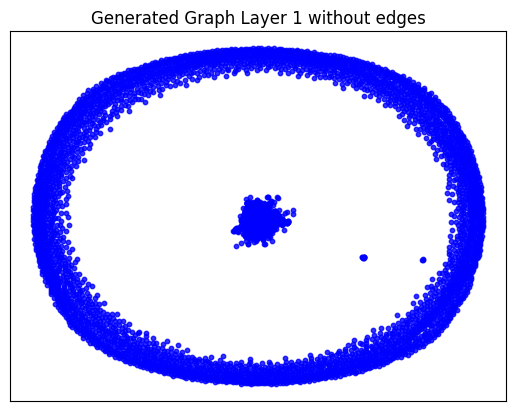

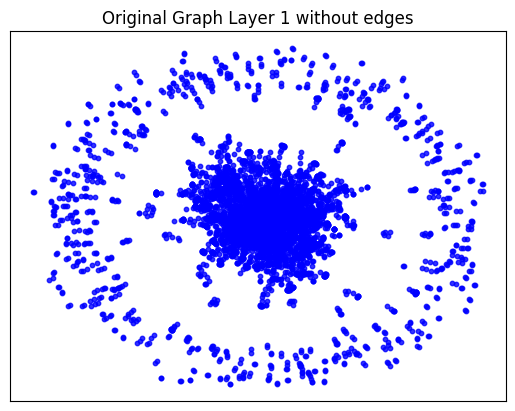

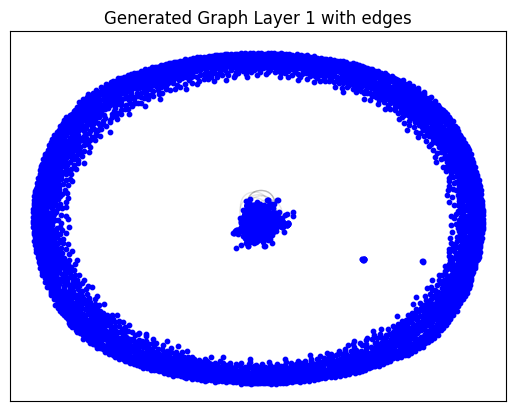

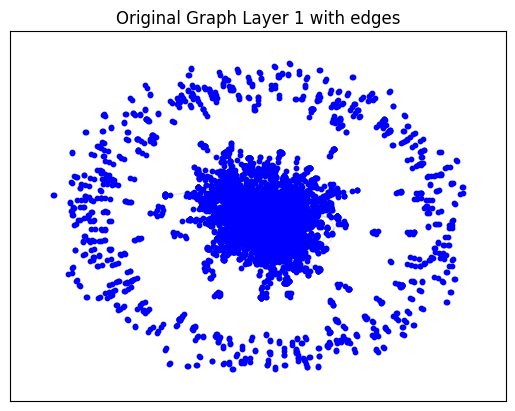

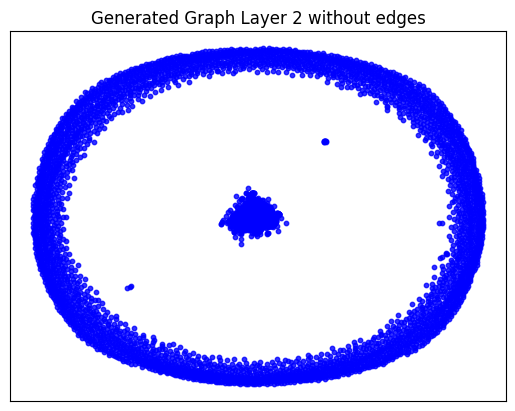

...

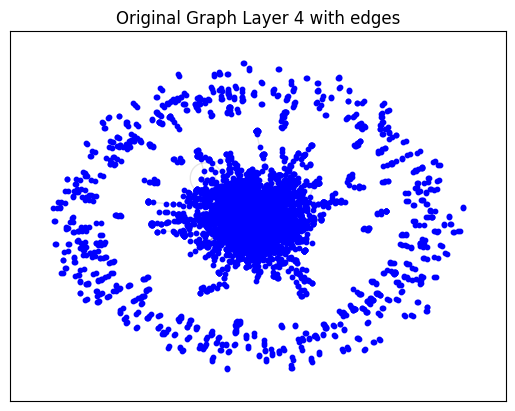

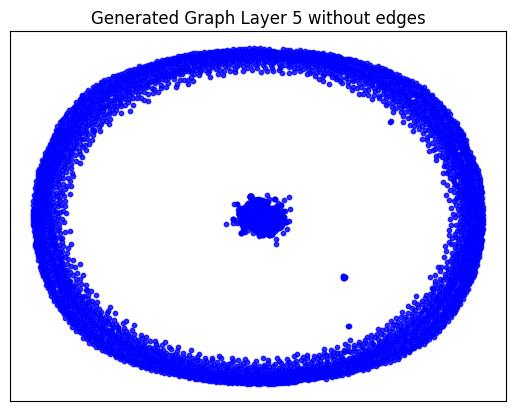

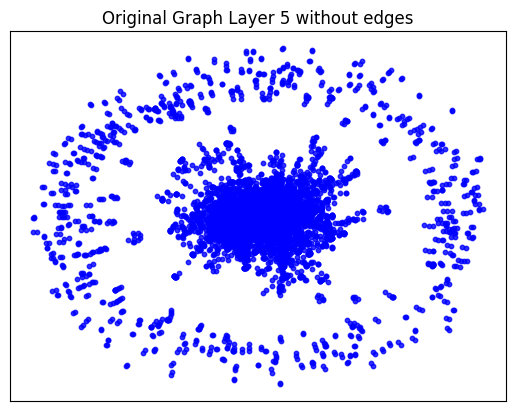

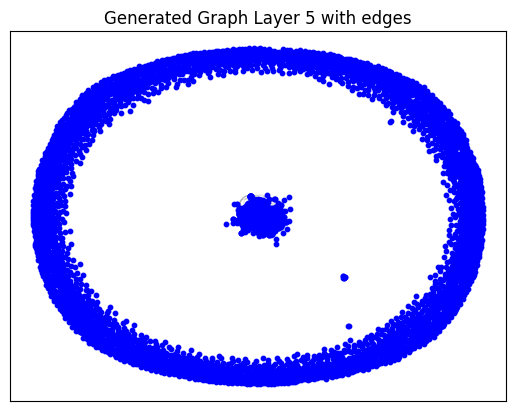

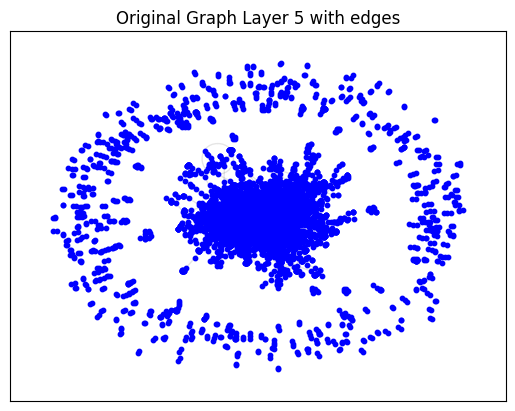

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_6.
Epoch 0 - Cost: 1.7465921640396118, Accuracy: 0.5002893209457397
Epoch 1 - Cost: 1.7212079763412476, Accuracy: 0.49989083409309387
Epoch 2 - Cost: 1.6967263221740723, Accuracy: 0.49962350726127625
Epoch 3 - Cost: 1.7031856775283813, Accuracy: 0.4997292757034302
Epoch 4 - Cost: 1.6639083623886108, Accuracy: 0.49969545006752014
Epoch 5 - Cost: 1.6679408550262451, Accuracy: 0.49979281425476074
Epoch 6 - Cost: 1.6343212127685547, Accuracy: 0.49941471219062805
Epoch 7 - Cost: 1.6078741550445557, Accuracy: 0.4992104172706604
Epoch 8 - Cost: 1.5526365041732788, Accuracy: 0.4994205832481384
Epoch 9 - Cost: 1.5264824628829956, Accuracy: 0.49817416071891785
Epoch 10 - Cost: 1.4462953805923462, Accuracy: 0.49753567576408386
Epoch 11 - Cost: 1.3882089853286743, Accuracy: 0.49702510237693787
Epoch 12 - Cost: 1.3381984233856201, Accuracy: 0.4945777952671051
Epoch 13 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14880681037902832 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04637718200683594 seconds to compute degree_assortativity_coefficient ---
--- 0.641176700592041 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 202, 'd_min': 0, 'd': 1.2433534496819443, 'LCC': 1019, 'wedge_count': 165804.0, 'claw_count': 5531505.0, 'triangle_count': 11551, 'power_law_exp': 1.965803833003759, 'gini': 0.9470431244129736, 'rel_edge_distr_entropy': 0.6781518137844567, 'assortativity': -0.29891451635374405, 'clustering_coefficient': 0.006264660341082581, 'n_components': 5105}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 15.277956730333049
KL divergence between original network and the network generated by Random E-R: 5.427009290457867
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 1.478312304297069
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.8718131768237471
KL divergence between original network and the network generated by Random E-R: 4.391942069922745
KL divergence between original network and the network generated by Random B-A: 2.0051817111932686
KL divergence between original network and the network generated by GAE: 41.49852740918207


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Seventh batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_7.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_7'
args.filename = 'pubmed_7_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_7'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 11.1015
Epoch: [ 2] time: 11.3932
Epoch: [ 3] time: 11.6857
Epoch: [ 4] time: 11.9784
Epoch: [ 5] time: 12.2716
Epoch: [ 6] time: 12.5632
Epoch: [ 7] time: 12.8563
Epoch: [ 8] time: 13.1481
Epoch: [ 9] time: 13.4403
Epoch: [10] time: 13.7326
Epoch: [11] time: 14.0250
Epoch: [12] time: 14.3163
Epoch: [13] time: 14.6089
Epoch: [14] time: 14.9008
Epoch: [15] time: 15.1931
Epoch: [16] time: 15.4855
Epoch: [17] time: 15.7778
Epoch: [18] time: 16.0702
Epoch: [19] time: 16.3621
Epoch: [20] time: 16.6543
Epoch: [21] time: 16.9466
Epoch: [22] time: 17.2389
Epoch: [23] time: 17.5303
Epoch: [24] time: 17.8227
Epoch: [25] time: 18.1148
Epoch: [26] time: 18.4080
Epoch: [27] time: 18.7013
Epoch: [28] time: 18.9957
Epoch: [29] time: 19.2894
Epoch: [30] time: 19.5826
Epoch: [31] time: 19.8841
Epoch: [32] time: 20.1855
Epoch: [33] time: 20.4777
Epoch: [34] time: 20.7701
Epoch: [35] time: 21.0634
Epoch: [36] time: 21.3557
Epoch: [37] time: 21.6486
Epoch: [38] 

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([5713, 64])
Shape of h_subset: torch.Size([330, 64])
Shape of idx: torch.Size([330])
Shape of new_h before assignment: torch.Size([5713, 64])
Shape of h_subset: torch.Size([264, 64])
Shape of idx: torch.Size([264])
Shape of new_h before assignment: torch.Size([5713, 64])
Shape of h_subset: torch.Size([184, 64])
Shape of idx: torch.Size([184])
Computing metrics for original graph
--- 0.026464462280273438 seconds to compute statistics_degrees ---
--- 1.1023666858673096 seconds to compute statistics_LCC ---
--- 0.03746175765991211 seconds to compute statistics_wedge_count ---
--- 0.038724660873413086 seconds to compute statistics_claw_count ---
--- 0.20842480659484863 seconds to compute statistics_triangle_count ---
--- 0.02835869789123535 seconds to compute statistics_power_law_alpha ---
--- 0.02884221076965332 seconds to compute statistics_gini ---
--- 0.13086509704589844 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05563

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5797665119171143 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 259.0, 'd_min': 0.0, 'd': 2.3987398, 'LCC': 2391, 'wedge_count': 225696.0, 'claw_count': 9301662.0, 'triangle_count': 2019, 'power_law_exp': 1.7320061790524626, 'gini': 0.8655308214926292, 'rel_edge_distr_entropy': 0.7874195043476218, 'assortativity': -0.11004184170554701, 'clustering_coefficient': 0.0006511739514938298, 'n_components': 3315}


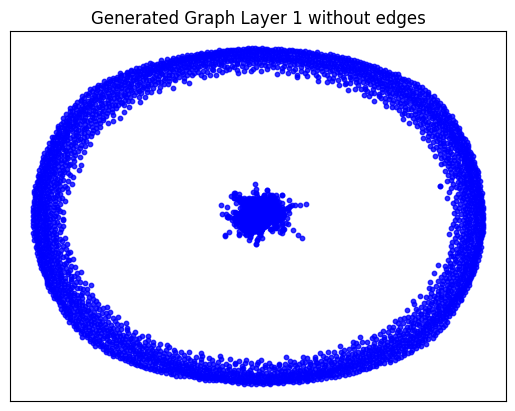

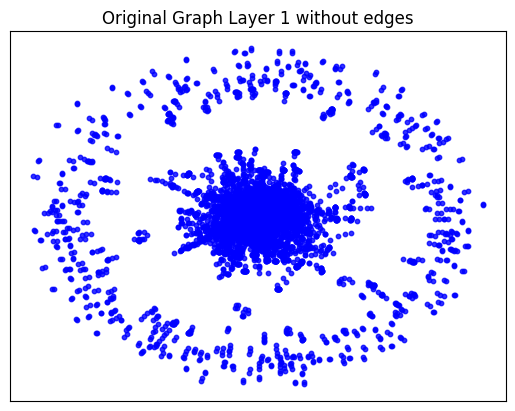

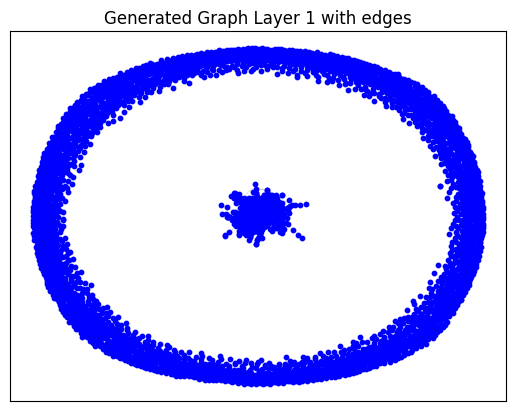

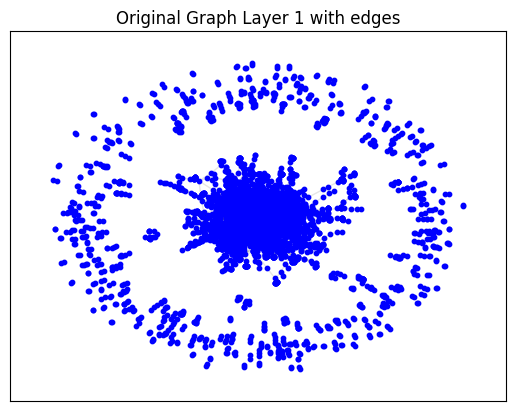

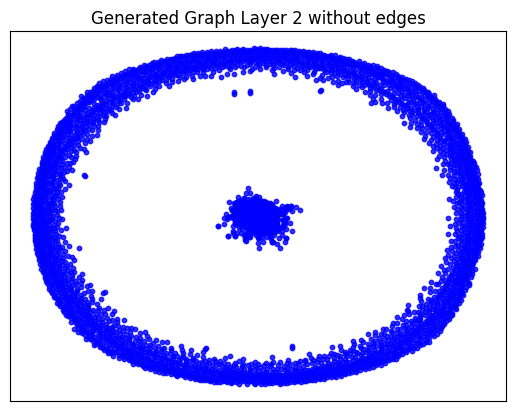

...

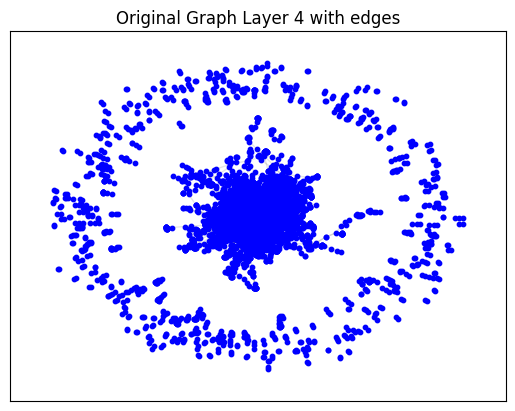

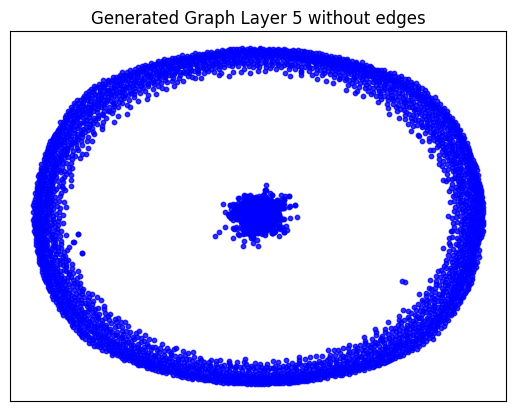

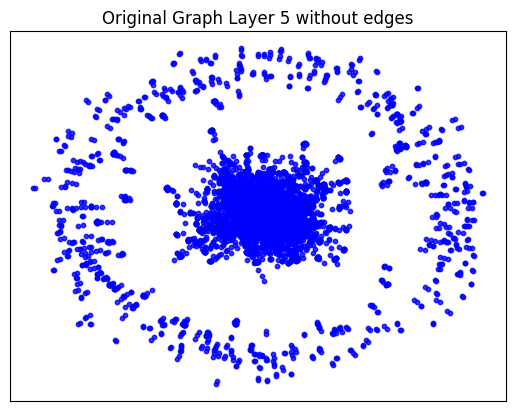

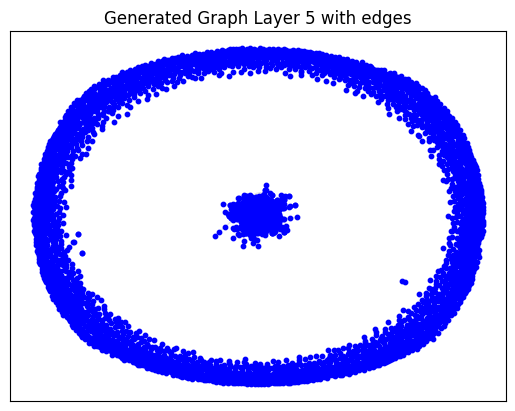

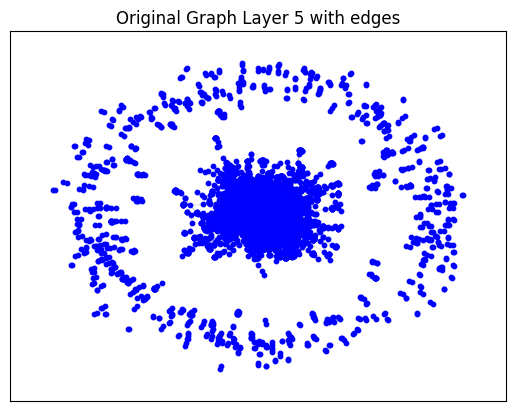

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_7.
Epoch 0 - Cost: 1.730812907218933, Accuracy: 0.5000527501106262
Epoch 1 - Cost: 1.7361276149749756, Accuracy: 0.4998345375061035
Epoch 2 - Cost: 1.6969059705734253, Accuracy: 0.4997944235801697
Epoch 3 - Cost: 1.6827853918075562, Accuracy: 0.500180721282959
Epoch 4 - Cost: 1.6627460718154907, Accuracy: 0.49967509508132935
Epoch 5 - Cost: 1.614662766456604, Accuracy: 0.49976882338523865
Epoch 6 - Cost: 1.6239348649978638, Accuracy: 0.4992905855178833
Epoch 7 - Cost: 1.5444977283477783, Accuracy: 0.49934467673301697
Epoch 8 - Cost: 1.5423437356948853, Accuracy: 0.49871599674224854
Epoch 9 - Cost: 1.4946966171264648, Accuracy: 0.4979495704174042
Epoch 10 - Cost: 1.451070785522461, Accuracy: 0.49712616205215454
Epoch 11 - Cost: 1.4136972427368164, Accuracy: 0.49530166387557983
Epoch 12 - Cost: 1.365743637084961, Accuracy: 0.49272221326828003
Epoch 13 - Cost

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04681730270385742 seconds to compute degree_assortativity_coefficient ---
--- 0.5479309558868408 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 322, 'd_min': 0, 'd': 1.2388869443472175, 'LCC': 1187, 'wedge_count': 219425.0, 'claw_count': 15582818.0, 'triangle_count': 6283, 'power_law_exp': 2.097115206624646, 'gini': 0.9329986452705881, 'rel_edge_distr_entropy': 0.6841870519300794, 'assortativity': -0.3107301252662027, 'clustering_coefficient': 0.0012096014982655896, 'n_components': 4525}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.5930706168031575
KL divergence between original network and the network generated by Random E-R: 5.5281667235434755
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0026603638396928836
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.7954575170902327
KL divergence between original network and the network generated by Random E-R: 7.040706917598073
KL divergence between original network and the network generated by Random B-A: 2.029391100464989
KL divergence between original network and the network generated by GAE: 27.31725729835695


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Eighth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_8.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_8'
args.filename = 'pubmed_8_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_8'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.4487
Epoch: [ 2] time: 10.7798
Epoch: [ 3] time: 11.1041
Epoch: [ 4] time: 11.4194
Epoch: [ 5] time: 11.7353
Epoch: [ 6] time: 12.0493
Epoch: [ 7] time: 12.3643
Epoch: [ 8] time: 12.6791
Epoch: [ 9] time: 12.9927
Epoch: [10] time: 13.3069
Epoch: [11] time: 13.6203
Epoch: [12] time: 13.9346
Epoch: [13] time: 14.2478
Epoch: [14] time: 14.5613
Epoch: [15] time: 14.8750
Epoch: [16] time: 15.1890
Epoch: [17] time: 15.5032
Epoch: [18] time: 15.8184
Epoch: [19] time: 16.1318
Epoch: [20] time: 16.4470
Epoch: [21] time: 16.7605
Epoch: [22] time: 17.0759
Epoch: [23] time: 17.3899
Epoch: [24] time: 17.7032
Epoch: [25] time: 18.0169
Epoch: [26] time: 18.3312
Epoch: [27] time: 18.6451
Epoch: [28] time: 18.9589
Epoch: [29] time: 19.2731
Epoch: [30] time: 19.5875
Epoch: [31] time: 19.9020
Epoch: [32] time: 20.2156
Epoch: [33] time: 20.5307
Epoch: [34] time: 20.8459
Epoch: [35] time: 21.1590
Epoch: [36] time: 21.4729
Epoch: [37] time: 21.7871
Epoch: [38] 

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6065, 64])
Shape of h_subset: torch.Size([350, 64])
Shape of idx: torch.Size([350])
Shape of new_h before assignment: torch.Size([6065, 64])
Shape of h_subset: torch.Size([280, 64])
Shape of idx: torch.Size([280])
Shape of new_h before assignment: torch.Size([6065, 64])
Shape of h_subset: torch.Size([196, 64])
Shape of idx: torch.Size([196])
Computing metrics for original graph
--- 0.02955174446105957 seconds to compute statistics_degrees ---
--- 1.3552544116973877 seconds to compute statistics_LCC ---
--- 0.04036831855773926 seconds to compute statistics_wedge_count ---
--- 0.04291057586669922 seconds to compute statistics_claw_count ---
--- 0.22559690475463867 seconds to compute statistics_triangle_count ---
--- 0.030587196350097656 seconds to compute statistics_power_law_alpha ---
--- 0.030790090560913086 seconds to compute statistics_gini ---
--- 0.1432032585144043 seconds to compute statistics_edge_distribution_entropy ---
--- 0.053999

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6507322788238525 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 110.0, 'd_min': 0.0, 'd': 2.2669415, 'LCC': 1924, 'wedge_count': 188699.0, 'claw_count': 3230676.0, 'triangle_count': 2418, 'power_law_exp': 1.6665942580088777, 'gini': 0.8976629582653604, 'rel_edge_distr_entropy': 0.7663276918952795, 'assortativity': -0.047918077834814624, 'clustering_coefficient': 0.0022453505086861077, 'n_components': 4110}


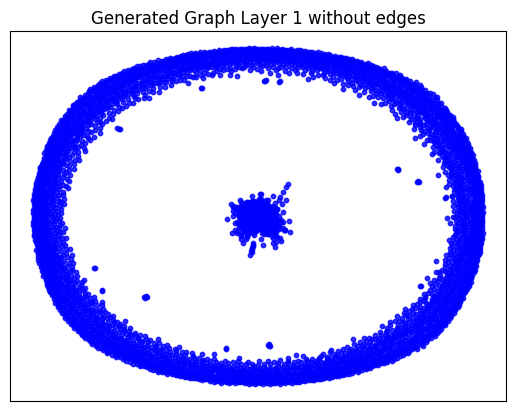

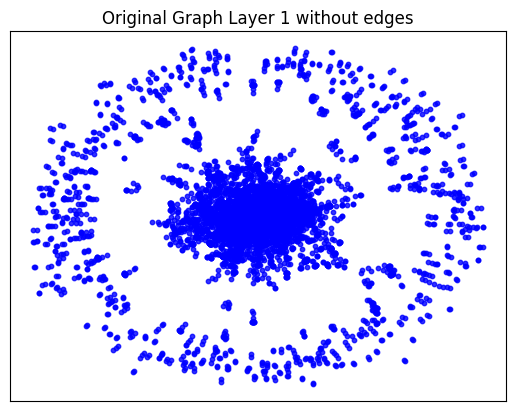

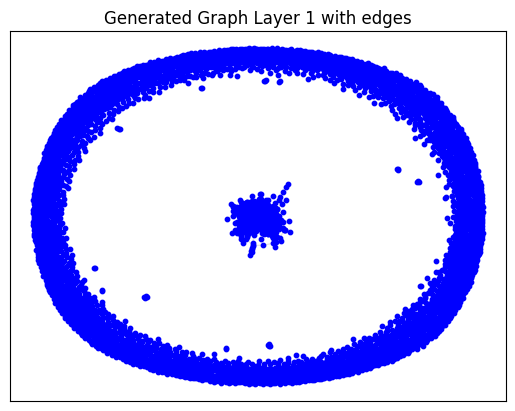

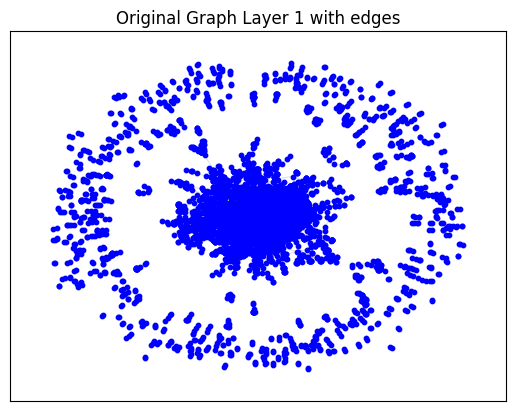

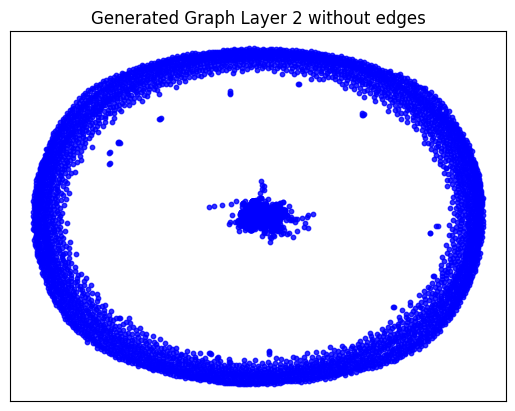

...

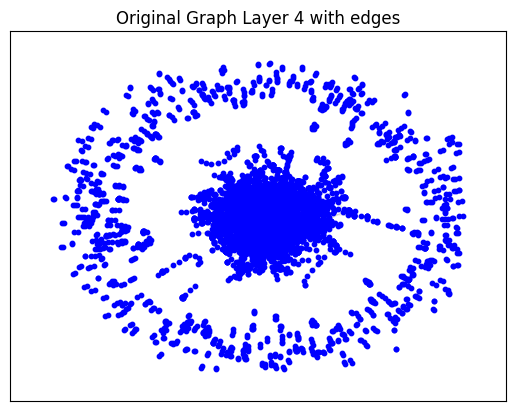

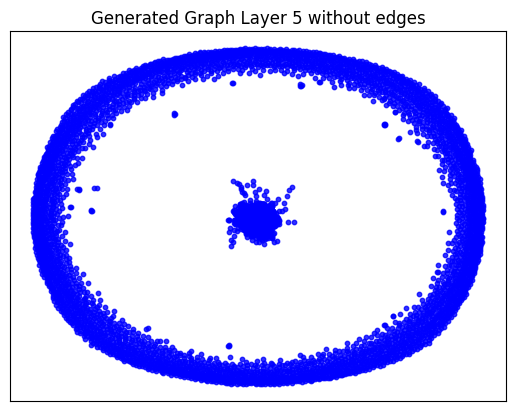

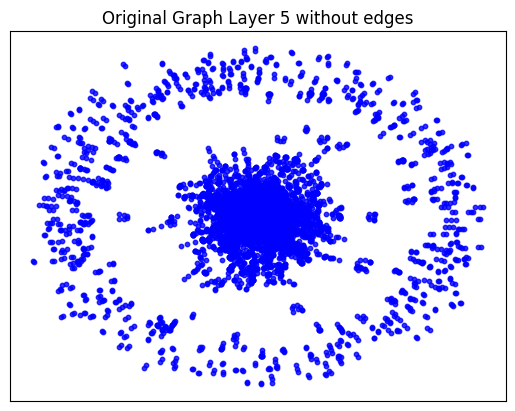

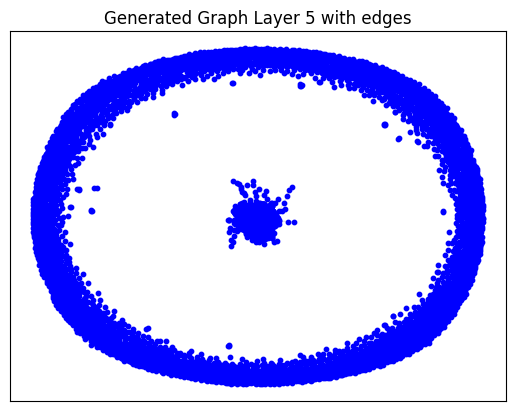

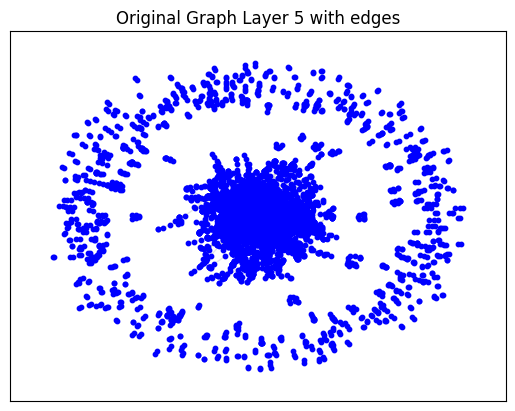

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_8.
Epoch 0 - Cost: 1.7865612506866455, Accuracy: 0.4999817907810211
Epoch 1 - Cost: 1.6874514818191528, Accuracy: 0.5000273585319519
Epoch 2 - Cost: 1.6785038709640503, Accuracy: 0.500015139579773
Epoch 3 - Cost: 1.7266746759414673, Accuracy: 0.4999692440032959
Epoch 4 - Cost: 1.6416945457458496, Accuracy: 0.5000081062316895
Epoch 5 - Cost: 1.6630640029907227, Accuracy: 0.4998743236064911
Epoch 6 - Cost: 1.5949736833572388, Accuracy: 0.4996776878833771
Epoch 7 - Cost: 1.5784430503845215, Accuracy: 0.49997055530548096
Epoch 8 - Cost: 1.5372427701950073, Accuracy: 0.4996107220649719
Epoch 9 - Cost: 1.5146276950836182, Accuracy: 0.4987647235393524
Epoch 10 - Cost: 1.5087212324142456, Accuracy: 0.49887266755104065
Epoch 11 - Cost: 1.415549874305725, Accuracy: 0.49864232540130615
Epoch 12 - Cost: 1.4122473001480103, Accuracy: 0.4980209469795227
Epoch 13 - Cost:

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14519786834716797 seconds to compute statistics_edge_distribution_entropy ---
--- 0.046605587005615234 seconds to compute degree_assortativity_coefficient ---
--- 0.6305782794952393 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 316, 'd_min': 0, 'd': 1.1795252225519288, 'LCC': 1273, 'wedge_count': 151596.0, 'claw_count': 7656427.0, 'triangle_count': 6350, 'power_law_exp': 2.200314905750174, 'gini': 0.9323983813734917, 'rel_edge_distr_entropy': 0.6981739444250167, 'assortativity': -0.23586582876075615, 'clustering_coefficient': 0.002488105744363526, 'n_components': 4791}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.098961630475422
KL divergence between original network and the network generated by Random E-R: 6.222370566869637
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 4.157756624238117e-05
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.317438852978305
KL divergence between original network and the network generated by Random E-R: 10.537658327590162
KL divergence between original network and the network generated by Random B-A: 1.9674433699154386
KL divergence between original network and the network generated by GAE: 32.0982724053853


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Ninth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_9.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_9'
args.filename = 'pubmed_9_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_9'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.1493
Epoch: [ 2] time: 10.4611
Epoch: [ 3] time: 10.7738
Epoch: [ 4] time: 11.0866
Epoch: [ 5] time: 11.3986
Epoch: [ 6] time: 11.7105
Epoch: [ 7] time: 12.0235
Epoch: [ 8] time: 12.3352
Epoch: [ 9] time: 12.6468
Epoch: [10] time: 12.9583
Epoch: [11] time: 13.2694
Epoch: [12] time: 13.5801
Epoch: [13] time: 13.8905
Epoch: [14] time: 14.2021
Epoch: [15] time: 14.5137
Epoch: [16] time: 14.8246
Epoch: [17] time: 15.1352
Epoch: [18] time: 15.4468
Epoch: [19] time: 15.7578
Epoch: [20] time: 16.0694
Epoch: [21] time: 16.3804
Epoch: [22] time: 16.6911
Epoch: [23] time: 17.0019
Epoch: [24] time: 17.3126
Epoch: [25] time: 17.6235
Epoch: [26] time: 17.9343
Epoch: [27] time: 18.2452
Epoch: [28] time: 18.5559
Epoch: [29] time: 18.8668
Epoch: [30] time: 19.1784
Epoch: [31] time: 19.4896
Epoch: [32] time: 19.8011
Epoch: [33] time: 20.1121
Epoch: [34] time: 20.4230
Epoch: [35] time: 20.7346
Epoch: [36] time: 21.0470
Epoch: [37] time: 21.3584
Epoch: [38] 

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([5935, 64])
Shape of h_subset: torch.Size([342, 64])
Shape of idx: torch.Size([342])
Shape of new_h before assignment: torch.Size([5935, 64])
Shape of h_subset: torch.Size([273, 64])
Shape of idx: torch.Size([273])
Shape of new_h before assignment: torch.Size([5935, 64])
Shape of h_subset: torch.Size([191, 64])
Shape of idx: torch.Size([191])
Computing metrics for original graph
--- 0.028456926345825195 seconds to compute statistics_degrees ---
--- 1.2163941860198975 seconds to compute statistics_LCC ---
--- 0.03959965705871582 seconds to compute statistics_wedge_count ---
--- 0.03991246223449707 seconds to compute statistics_claw_count ---
--- 0.2191612720489502 seconds to compute statistics_triangle_count ---
--- 0.0300447940826416 seconds to compute statistics_power_law_alpha ---
--- 0.029863357543945312 seconds to compute statistics_gini ---
--- 0.13846182823181152 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0538616

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.615962028503418 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 94.0, 'd_min': 0.0, 'd': 2.3209772, 'LCC': 2463, 'wedge_count': 104973.0, 'claw_count': 1193113.0, 'triangle_count': 990, 'power_law_exp': 1.6793022236251907, 'gini': 0.8314019176285135, 'rel_edge_distr_entropy': 0.8233619577638305, 'assortativity': -0.10272833637714301, 'clustering_coefficient': 0.0024892864297011265, 'n_components': 3467}


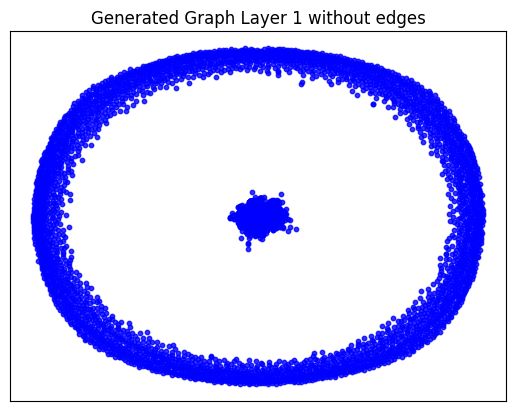

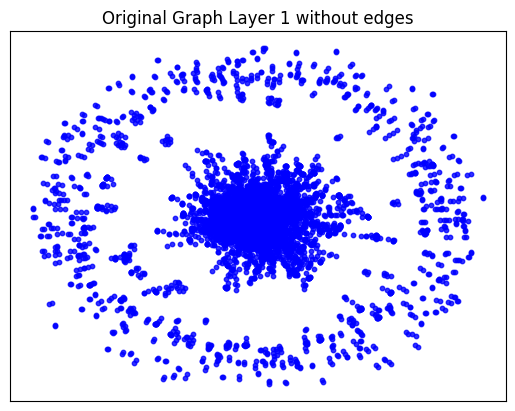

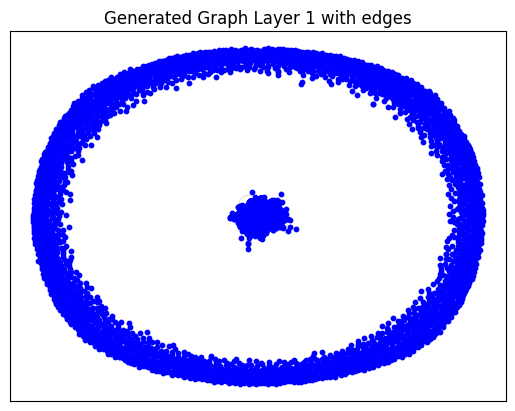

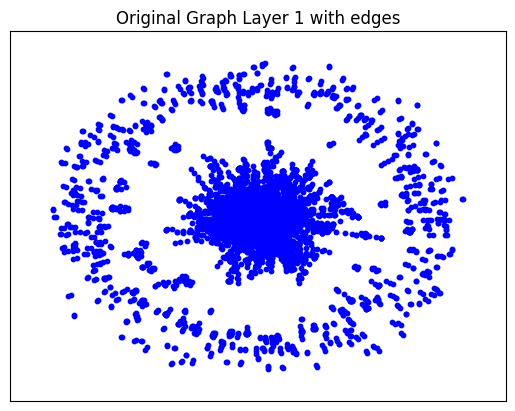

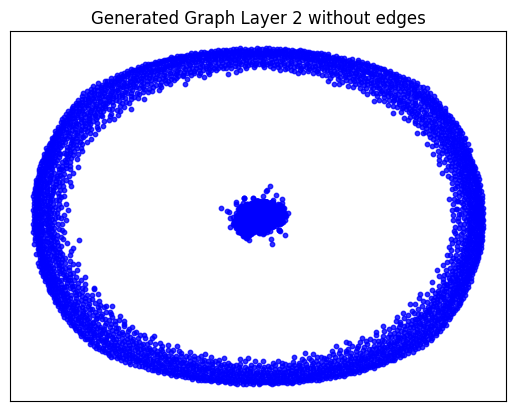

...

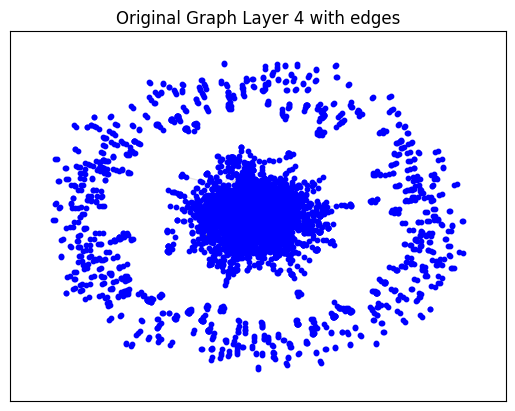

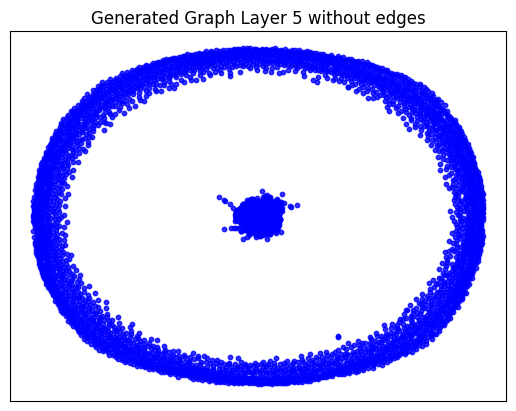

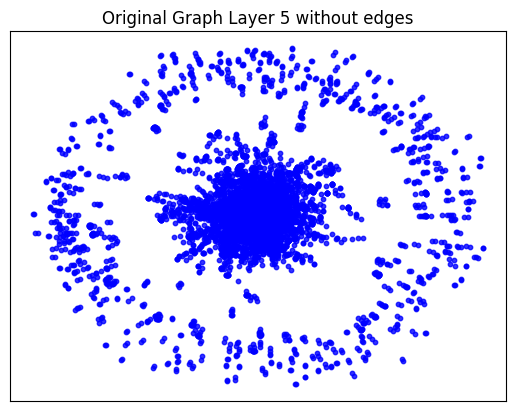

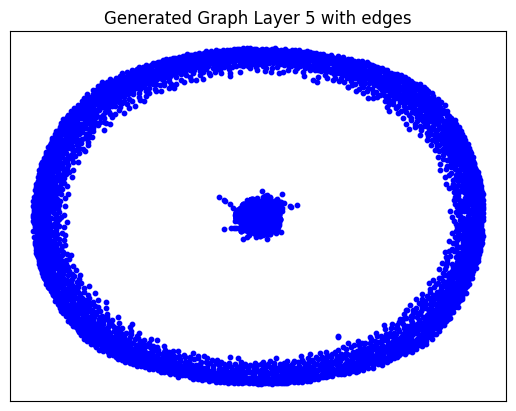

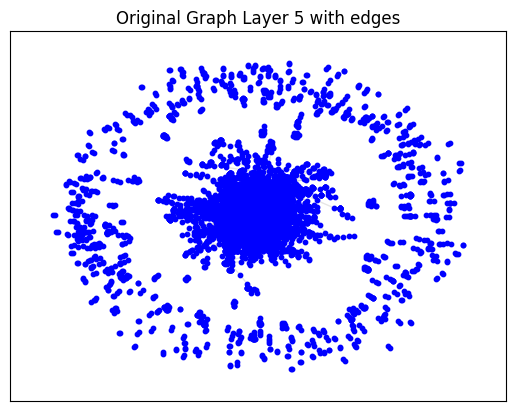

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_9.
Epoch 0 - Cost: 1.7417945861816406, Accuracy: 0.49958088994026184
Epoch 1 - Cost: 1.681304693222046, Accuracy: 0.4997405409812927
Epoch 2 - Cost: 1.6798795461654663, Accuracy: 0.5000906586647034
Epoch 3 - Cost: 1.674519419670105, Accuracy: 0.4997071623802185
Epoch 4 - Cost: 1.712754249572754, Accuracy: 0.4996243715286255
Epoch 5 - Cost: 1.696887731552124, Accuracy: 0.49951305985450745
Epoch 6 - Cost: 1.6598663330078125, Accuracy: 0.49942269921302795
Epoch 7 - Cost: 1.5912669897079468, Accuracy: 0.4993714988231659
Epoch 8 - Cost: 1.5561612844467163, Accuracy: 0.4987610876560211
Epoch 9 - Cost: 1.521790623664856, Accuracy: 0.4985853135585785
Epoch 10 - Cost: 1.4842060804367065, Accuracy: 0.4980134665966034
Epoch 11 - Cost: 1.451893925666809, Accuracy: 0.4978477656841278
Epoch 12 - Cost: 1.3952006101608276, Accuracy: 0.49697345495224
Epoch 13 - Cost: 1.386

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04760241508483887 seconds to compute degree_assortativity_coefficient ---
--- 0.6034739017486572 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 271, 'd_min': 0, 'd': 1.198955525606469, 'LCC': 1110, 'wedge_count': 173516.0, 'claw_count': 8111807.0, 'triangle_count': 8383, 'power_law_exp': 2.080400609384223, 'gini': 0.9412917449847695, 'rel_edge_distr_entropy': 0.680130820604816, 'assortativity': -0.3139446625660727, 'clustering_coefficient': 0.0031002956554563, 'n_components': 4821}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.7853221068432582
KL divergence between original network and the network generated by Random E-R: 5.817892428681959
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.26532533861678204
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.5263611424114156
KL divergence between original network and the network generated by Random E-R: 3.483230753956404
KL divergence between original network and the network generated by Random B-A: 1.8024191596701074
KL divergence between original network and the network generated by GAE: 41.692024981289734


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

10 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_10.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_10'
args.filename = 'pubmed_10_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_10'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.0869
Epoch: [ 2] time: 10.2540
Epoch: [ 3] time: 10.4193
Epoch: [ 4] time: 10.5850
Epoch: [ 5] time: 10.7505
Epoch: [ 6] time: 10.9165
Epoch: [ 7] time: 11.0820
Epoch: [ 8] time: 11.2484
Epoch: [ 9] time: 11.4139
Epoch: [10] time: 11.5797
Epoch: [11] time: 11.7444
Epoch: [12] time: 11.9099
Epoch: [13] time: 12.0765
Epoch: [14] time: 12.2427
Epoch: [15] time: 12.4087
Epoch: [16] time: 12.5752
Epoch: [17] time: 12.7418
Epoch: [18] time: 12.9069
Epoch: [19] time: 13.0737
Epoch: [20] time: 13.2398
Epoch: [21] time: 13.4057
Epoch: [22] time: 13.5728
Epoch: [23] time: 13.7394
Epoch: [24] time: 13.9049
Epoch: [25] time: 14.0717
Epoch: [26] time: 14.2373
Epoch: [27] time: 14.4036
Epoch: [28] time: 14.5722
Epoch: [29] time: 14.7396
Epoch: [30] time: 14.9051
Epoch: [31] time: 15.0720
Epoch: [32] time: 15.2388
Epoch: [33] time: 15.4049
Epoch: [34] time: 15.5711
Epoch: [35] time: 15.7380
Epoch: [36] time: 15.9066
Epoch: [37] time: 16.0730
Epoch: [38] 

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([5918, 64])
Shape of h_subset: torch.Size([342, 64])
Shape of idx: torch.Size([342])
Shape of new_h before assignment: torch.Size([5918, 64])
Shape of h_subset: torch.Size([273, 64])
Shape of idx: torch.Size([273])
Shape of new_h before assignment: torch.Size([5918, 64])
Shape of h_subset: torch.Size([191, 64])
Shape of idx: torch.Size([191])
Computing metrics for original graph
--- 0.02792644500732422 seconds to compute statistics_degrees ---
--- 1.2162275314331055 seconds to compute statistics_LCC ---
--- 0.03768658638000488 seconds to compute statistics_wedge_count ---
--- 0.038834571838378906 seconds to compute statistics_claw_count ---
--- 0.21697378158569336 seconds to compute statistics_triangle_count ---
--- 0.029023170471191406 seconds to compute statistics_power_law_alpha ---
--- 0.02895641326904297 seconds to compute statistics_gini ---
--- 0.13733530044555664 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05481

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6082637310028076 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 110.0, 'd_min': 0.0, 'd': 2.3144643, 'LCC': 2163, 'wedge_count': 182473.0, 'claw_count': 3157344.0, 'triangle_count': 3301, 'power_law_exp': 1.614576034291562, 'gini': 0.8929732481017556, 'rel_edge_distr_entropy': 0.770228903849746, 'assortativity': -0.14149524766876317, 'clustering_coefficient': 0.0031364970050776855, 'n_components': 3750}


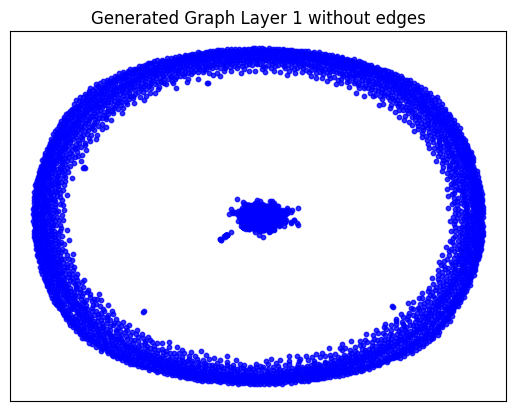

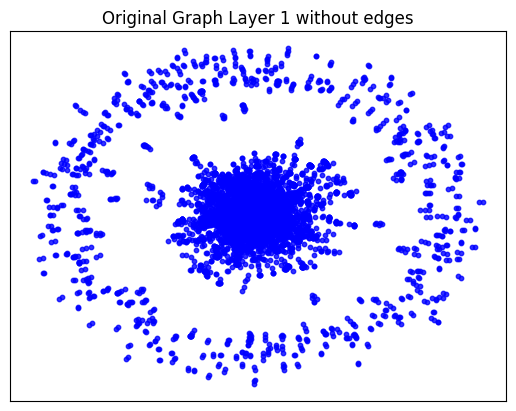

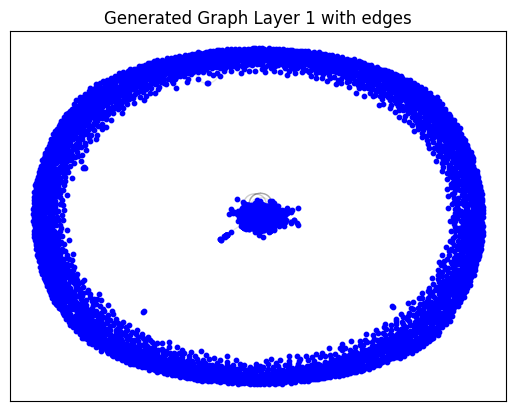

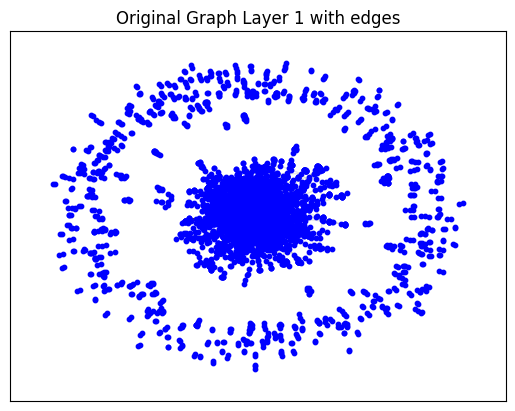

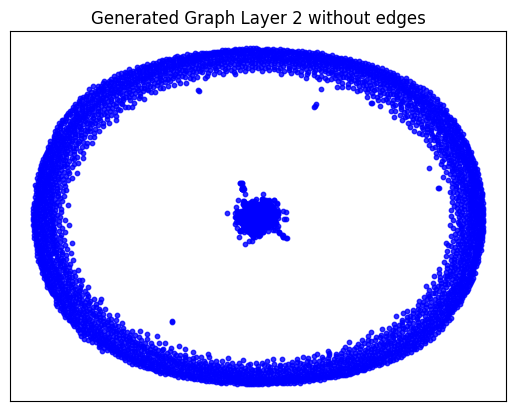

...

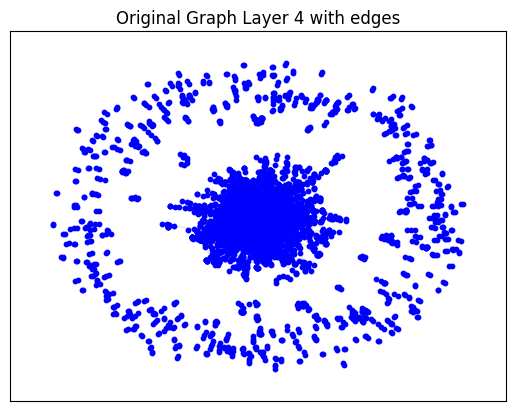

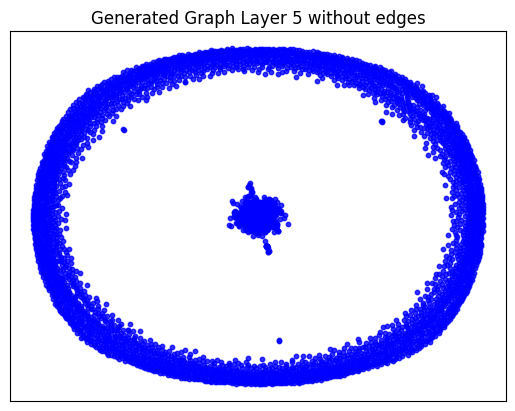

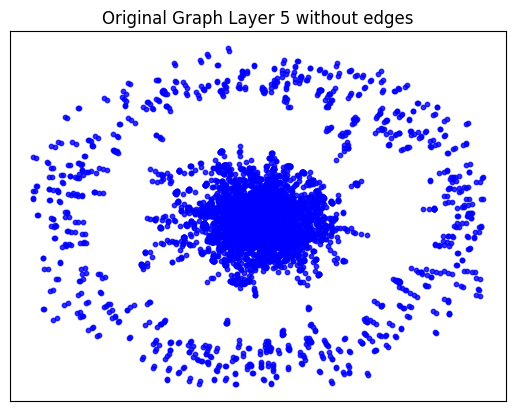

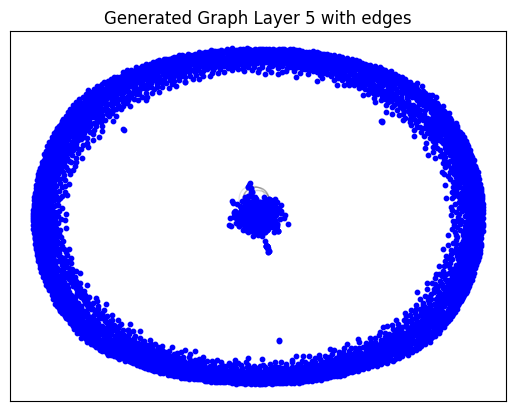

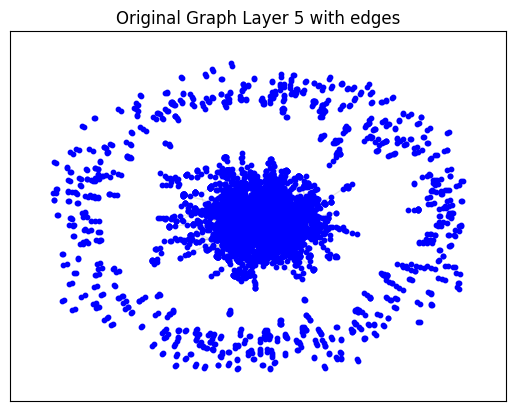

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_10.
Epoch 0 - Cost: 1.7494351863861084, Accuracy: 0.49995604157447815
Epoch 1 - Cost: 1.7308508157730103, Accuracy: 0.4998619556427002
Epoch 2 - Cost: 1.6986348628997803, Accuracy: 0.4997618496417999
Epoch 3 - Cost: 1.67310631275177, Accuracy: 0.49979496002197266
Epoch 4 - Cost: 1.6672890186309814, Accuracy: 0.4994257092475891
Epoch 5 - Cost: 1.628274917602539, Accuracy: 0.4991409480571747
Epoch 6 - Cost: 1.6269423961639404, Accuracy: 0.4995844066143036
Epoch 7 - Cost: 1.6054686307907104, Accuracy: 0.4993152916431427
Epoch 8 - Cost: 1.565216064453125, Accuracy: 0.49881887435913086
Epoch 9 - Cost: 1.518531084060669, Accuracy: 0.4988209307193756
Epoch 10 - Cost: 1.5101162195205688, Accuracy: 0.49855366349220276
Epoch 11 - Cost: 1.4392837285995483, Accuracy: 0.49807092547416687
Epoch 12 - Cost: 1.4067739248275757, Accuracy: 0.49713996052742004
Epoch 13 - Cost

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.05135202407836914 seconds to compute degree_assortativity_coefficient ---
--- 0.5823912620544434 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 204, 'd_min': 0, 'd': 1.2025680013515796, 'LCC': 945, 'wedge_count': 137629.0, 'claw_count': 3942048.0, 'triangle_count': 11406, 'power_law_exp': 1.9542006174455064, 'gini': 0.9493000500671209, 'rel_edge_distr_entropy': 0.6759749116387165, 'assortativity': -0.2947912128647143, 'clustering_coefficient': 0.008680259601100748, 'n_components': 4967}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.22928578405029332
KL divergence between original network and the network generated by Random E-R: 5.009777637908146
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 7.961928802238089
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.043050628342364
KL divergence between original network and the network generated by Random E-R: 3.518557906503157
KL divergence between original network and the network generated by Random B-A: 1.856186589755997
KL divergence between original network and the network generated by GAE: 42.04389847870811


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

11 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_11.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_11'
args.filename = 'pubmed_11_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_11'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 9.6607
Epoch: [ 2] time: 9.9821
Epoch: [ 3] time: 10.3019
Epoch: [ 4] time: 10.6226
Epoch: [ 5] time: 10.9420
Epoch: [ 6] time: 11.2610
Epoch: [ 7] time: 11.5803
Epoch: [ 8] time: 11.8996
Epoch: [ 9] time: 12.2190
Epoch: [10] time: 12.5385
Epoch: [11] time: 12.8584
Epoch: [12] time: 13.1788
Epoch: [13] time: 13.4981
Epoch: [14] time: 13.8178
Epoch: [15] time: 14.1368
Epoch: [16] time: 14.4559
Epoch: [17] time: 14.7754
Epoch: [18] time: 15.0947
Epoch: [19] time: 15.4142
Epoch: [20] time: 15.7332
Epoch: [21] time: 16.0524
Epoch: [22] time: 16.3723
Epoch: [23] time: 16.6911
Epoch: [24] time: 17.0116
Epoch: [25] time: 17.3317
Epoch: [26] time: 17.6510
Epoch: [27] time: 17.9717
Epoch: [28] time: 18.2914
Epoch: [29] time: 18.6115
Epoch: [30] time: 18.9359
Epoch: [31] time: 19.2562
Epoch: [32] time: 19.5762
Epoch: [33] time: 19.8956
Epoch: [34] time: 20.2147
Epoch: [35] time: 20.5349
Epoch: [36] time: 20.8550
Epoch: [37] time: 21.1751
Epoch: [38] ti

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6029, 64])
Shape of h_subset: torch.Size([348, 64])
Shape of idx: torch.Size([348])
Shape of new_h before assignment: torch.Size([6029, 64])
Shape of h_subset: torch.Size([278, 64])
Shape of idx: torch.Size([278])
Shape of new_h before assignment: torch.Size([6029, 64])
Shape of h_subset: torch.Size([194, 64])
Shape of idx: torch.Size([194])
Computing metrics for original graph
--- 0.02920985221862793 seconds to compute statistics_degrees ---
--- 1.2465274333953857 seconds to compute statistics_LCC ---
--- 0.04017066955566406 seconds to compute statistics_wedge_count ---
--- 0.04111814498901367 seconds to compute statistics_claw_count ---
--- 0.22304749488830566 seconds to compute statistics_triangle_count ---
--- 0.030504941940307617 seconds to compute statistics_power_law_alpha ---
--- 0.031271934509277344 seconds to compute statistics_gini ---
--- 0.14639067649841309 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05348

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6346225738525391 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 96.0, 'd_min': 0.0, 'd': 2.2733455, 'LCC': 2154, 'wedge_count': 146444.0, 'claw_count': 2137903.0, 'triangle_count': 2376, 'power_law_exp': 1.6772233485218466, 'gini': 0.8729731730751147, 'rel_edge_distr_entropy': 0.791181578565392, 'assortativity': -0.2799306391736169, 'clustering_coefficient': 0.0033341082359676748, 'n_components': 3865}


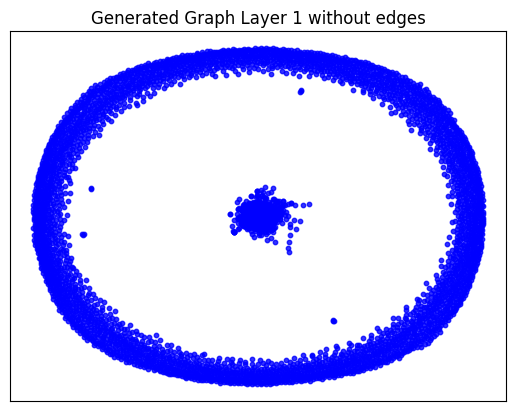

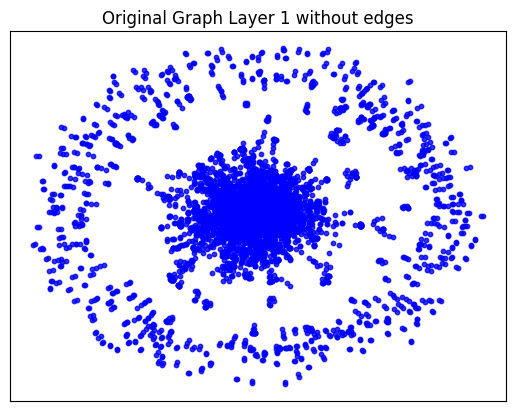

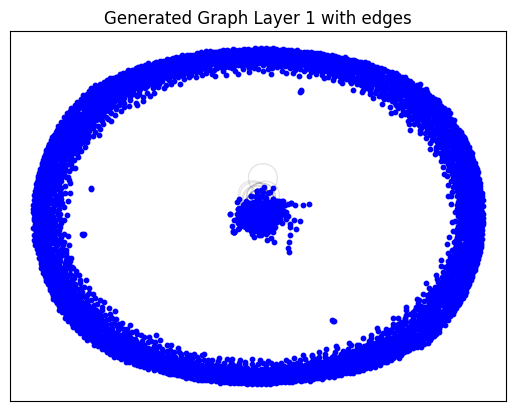

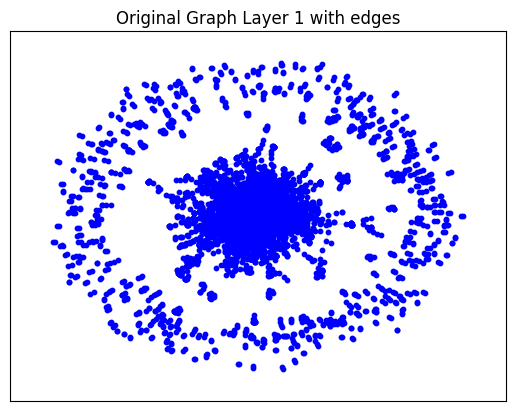

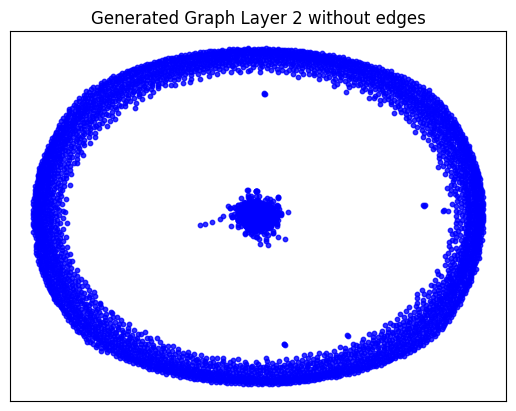

...

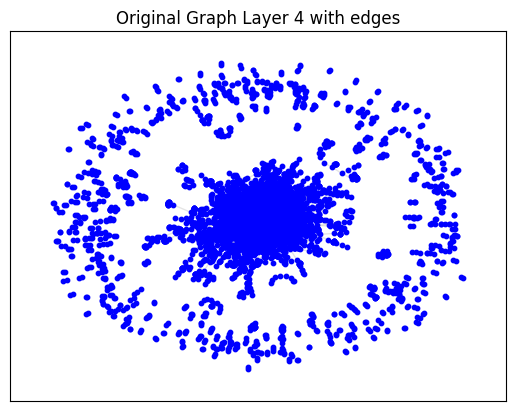

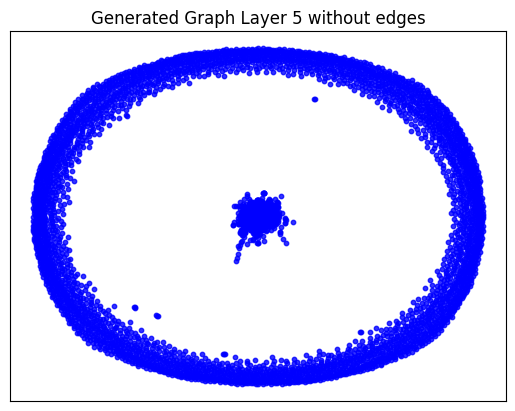

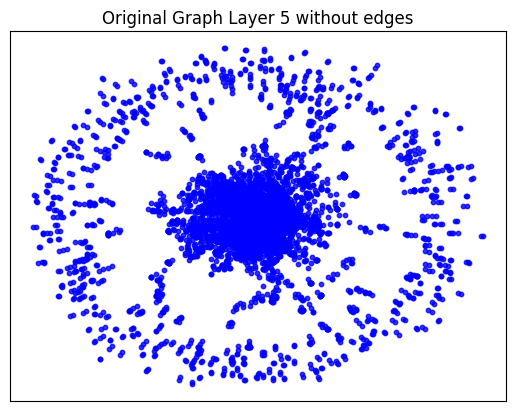

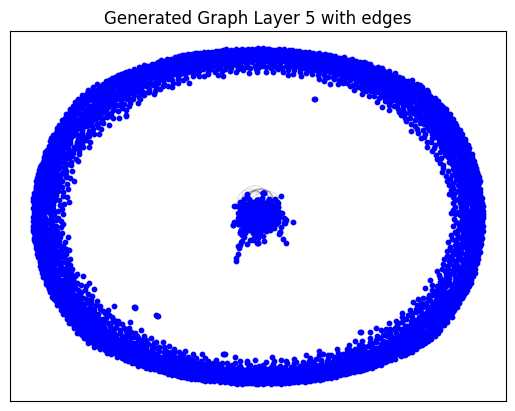

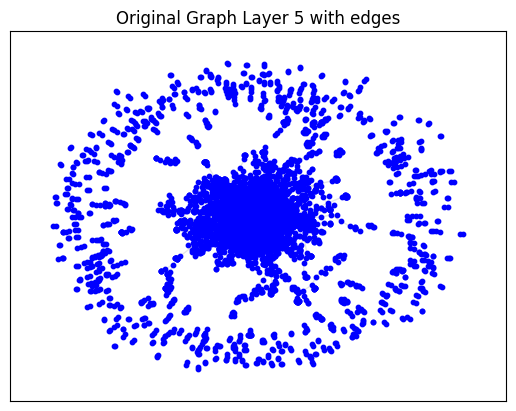

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_11.
Epoch 0 - Cost: 1.7731480598449707, Accuracy: 0.500266969203949
Epoch 1 - Cost: 1.7626827955245972, Accuracy: 0.5001068115234375
Epoch 2 - Cost: 1.7367463111877441, Accuracy: 0.49978339672088623
Epoch 3 - Cost: 1.7731982469558716, Accuracy: 0.4998205304145813
Epoch 4 - Cost: 1.747676968574524, Accuracy: 0.49967068433761597
Epoch 5 - Cost: 1.6054216623306274, Accuracy: 0.4994802176952362
Epoch 6 - Cost: 1.6507285833358765, Accuracy: 0.4995570480823517
Epoch 7 - Cost: 1.646837592124939, Accuracy: 0.4990648329257965
Epoch 8 - Cost: 1.6657042503356934, Accuracy: 0.4994783401489258
Epoch 9 - Cost: 1.5674598217010498, Accuracy: 0.498737096786499
Epoch 10 - Cost: 1.5796111822128296, Accuracy: 0.499421626329422
Epoch 11 - Cost: 1.4774965047836304, Accuracy: 0.4987635016441345
Epoch 12 - Cost: 1.4779248237609863, Accuracy: 0.49862977862358093
Epoch 13 - Cost: 1

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.144364595413208 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0450899600982666 seconds to compute degree_assortativity_coefficient ---
--- 0.6076500415802002 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 202, 'd_min': 0, 'd': 1.1703150912106135, 'LCC': 760, 'wedge_count': 146302.0, 'claw_count': 4696228.0, 'triangle_count': 10574, 'power_law_exp': 1.7673577870843311, 'gini': 0.953626017566976, 'rel_edge_distr_entropy': 0.6674075379481555, 'assortativity': -0.25365785142364994, 'clustering_coefficient': 0.006754782774601233, 'n_components': 5229}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.23840079499834949
KL divergence between original network and the network generated by Random E-R: 5.030620089857033
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.8108401051469083
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.367296040132772
KL divergence between original network and the network generated by Random E-R: 13.557263129776523
KL divergence between original network and the network generated by Random B-A: 1.8332577460767487
KL divergence between original network and the network generated by GAE: 48.413441016985054


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

12 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_12.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_12'
args.filename = 'pubmed_12_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_12'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 8.8506
Epoch: [ 2] time: 9.0714
Epoch: [ 3] time: 9.2917
Epoch: [ 4] time: 9.5126
Epoch: [ 5] time: 9.7332
Epoch: [ 6] time: 9.9551
Epoch: [ 7] time: 10.1815
Epoch: [ 8] time: 10.4026
Epoch: [ 9] time: 10.6229
Epoch: [10] time: 10.8440
Epoch: [11] time: 11.0645
Epoch: [12] time: 11.2855
Epoch: [13] time: 11.5058
Epoch: [14] time: 11.7259
Epoch: [15] time: 11.9455
Epoch: [16] time: 12.1656
Epoch: [17] time: 12.3855
Epoch: [18] time: 12.6054
Epoch: [19] time: 12.8259
Epoch: [20] time: 13.0460
Epoch: [21] time: 13.2656
Epoch: [22] time: 13.4852
Epoch: [23] time: 13.7055
Epoch: [24] time: 13.9255
Epoch: [25] time: 14.1452
Epoch: [26] time: 14.3642
Epoch: [27] time: 14.5834
Epoch: [28] time: 14.8031
Epoch: [29] time: 15.0231
Epoch: [30] time: 15.2434
Epoch: [31] time: 15.4632
Epoch: [32] time: 15.7285
Epoch: [33] time: 15.9486
Epoch: [34] time: 16.1691
Epoch: [35] time: 16.3889
Epoch: [36] time: 16.6085
Epoch: [37] time: 16.8285
Epoch: [38] time: 

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-53-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([4868, 64])
Shape of h_subset: torch.Size([280, 64])
Shape of idx: torch.Size([280])
Shape of new_h before assignment: torch.Size([4868, 64])
Shape of h_subset: torch.Size([224, 64])
Shape of idx: torch.Size([224])
Shape of new_h before assignment: torch.Size([4868, 64])
Shape of h_subset: torch.Size([156, 64])
Shape of idx: torch.Size([156])
Computing metrics for original graph
--- 0.0183413028717041 seconds to compute statistics_degrees ---
--- 0.789806604385376 seconds to compute statistics_LCC ---
--- 0.027111530303955078 seconds to compute statistics_wedge_count ---
--- 0.02780461311340332 seconds to compute statistics_claw_count ---
--- 0.1512746810913086 seconds to compute statistics_triangle_count ---
--- 0.01952052116394043 seconds to compute statistics_power_law_alpha ---
--- 0.019663095474243164 seconds to compute statistics_gini ---
--- 0.09267878532409668 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04249739

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.40302038192749023 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 94.0, 'd_min': 0.0, 'd': 2.165982, 'LCC': 1544, 'wedge_count': 136572.0, 'claw_count': 2019519.0, 'triangle_count': 2100, 'power_law_exp': 1.6048474444862135, 'gini': 0.9063603097494648, 'rel_edge_distr_entropy': 0.7519757680022626, 'assortativity': -0.31308494114091096, 'clustering_coefficient': 0.0031195547058482736, 'n_components': 3318}


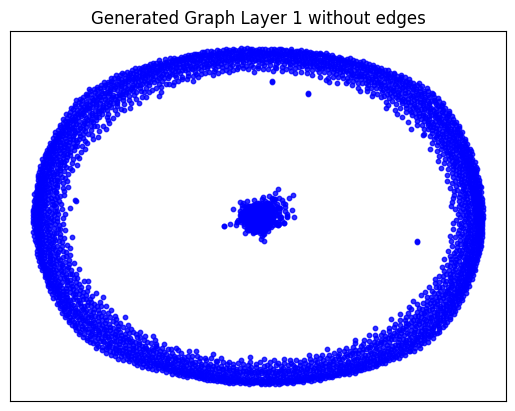

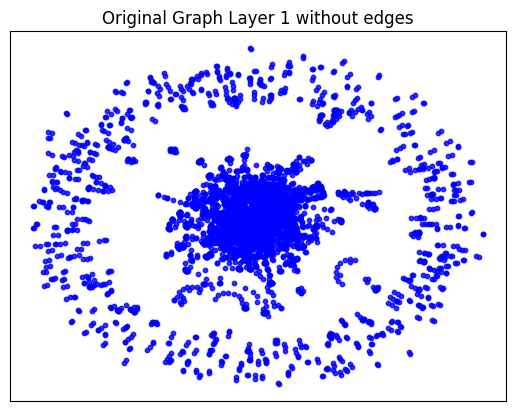

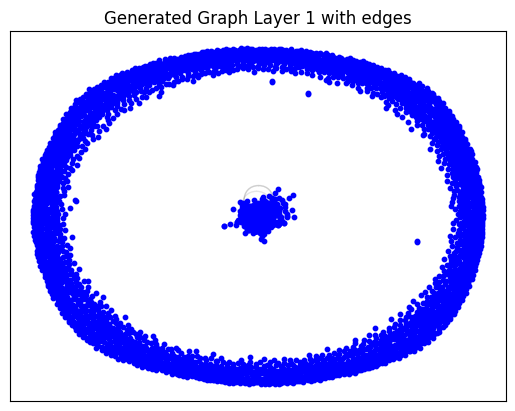

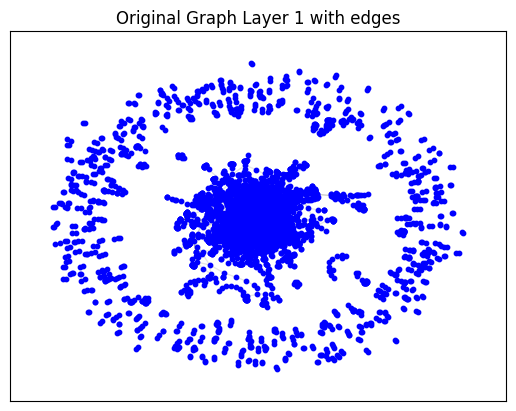

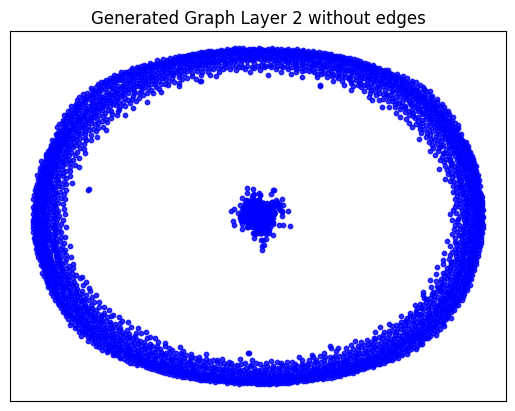

...

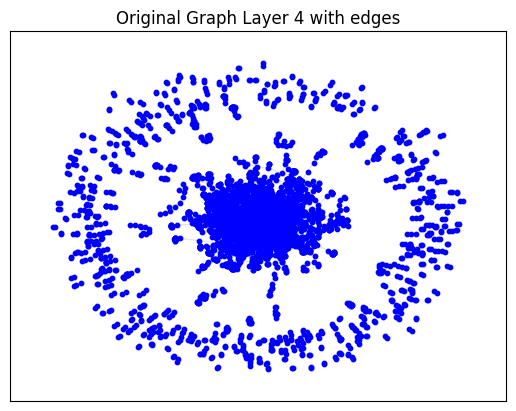

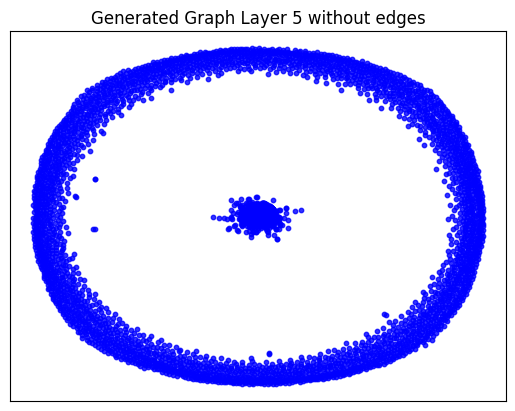

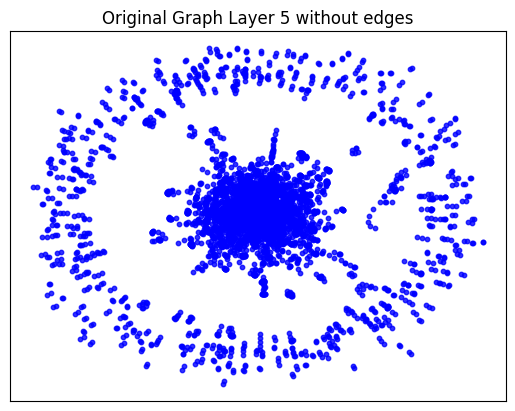

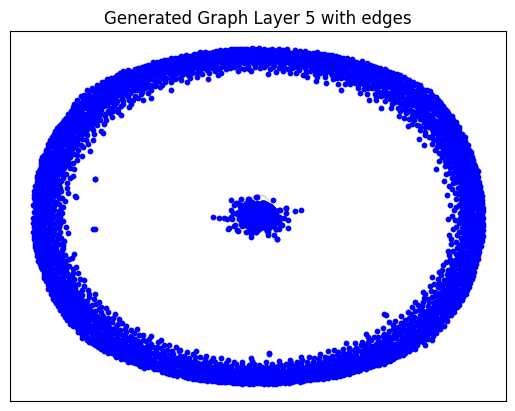

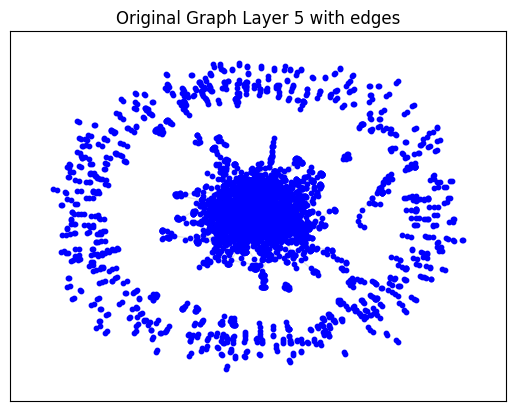

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_12.
Epoch 0 - Cost: 1.6106092929840088, Accuracy: 0.5000361204147339
Epoch 1 - Cost: 1.7099964618682861, Accuracy: 0.49985772371292114
Epoch 2 - Cost: 1.7441747188568115, Accuracy: 0.49980854988098145
Epoch 3 - Cost: 1.8016507625579834, Accuracy: 0.4997008144855499
Epoch 4 - Cost: 1.7295889854431152, Accuracy: 0.4995773136615753
Epoch 5 - Cost: 1.5432841777801514, Accuracy: 0.49913549423217773
Epoch 6 - Cost: 1.6873719692230225, Accuracy: 0.49925461411476135
Epoch 7 - Cost: 1.58822500705719, Accuracy: 0.499529629945755
Epoch 8 - Cost: 1.504381775856018, Accuracy: 0.4988269805908203
Epoch 9 - Cost: 1.6884715557098389, Accuracy: 0.49888357520103455
Epoch 10 - Cost: 1.6710586547851562, Accuracy: 0.4988206624984741
Epoch 11 - Cost: 1.6296833753585815, Accuracy: 0.4992125928401947
Epoch 12 - Cost: 1.5495045185089111, Accuracy: 0.4988895654678345
Epoch 13 - Cost

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.0202486515045166 seconds to compute statistics_power_law_alpha ---
--- 0.020199298858642578 seconds to compute statistics_gini ---
--- 0.09232807159423828 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0362248420715332 seconds to compute degree_assortativity_coefficient ---
--- 0.39052748680114746 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 125, 'd_min': 0, 'd': 1.1084411583487368, 'LCC': 230, 'wedge_count': 128964.0, 'claw_count': 2994314.0, 'triangle_count': 19346, 'power_law_exp': 1.4077709361806572, 'gini': 0.9763283672387004, 'rel_edge_distr_entropy': 0.5905380513612489, 'assortativity': -0.11777810124317058, 'clustering_coefficient': 0.019382736747047904, 'n_components': 4630}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.1107157719978162
KL divergence between original network and the network generated by Random E-R: 5.943078450220589
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.08569223453710297
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.025351690746352
KL divergence between original network and the network generated by Random E-R: 54.16682691298048
KL divergence between original network and the network generated by Random B-A: 1.814500083362181
KL divergence between original network and the network generated by GAE: 10.764797484005573


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()